## BDS Assignment 1

#### Group No. : BDS - 093
#### Group Members : 
- Abhinay Sirohi (2020fc04179)
- Mukesh Kumar Yadav (2020fc04994)
- Sudeep Shekhar Mishra (2020fc04174)

### Import required libraries

In [1]:
#Import required libraries
import warnings 
warnings.filterwarnings('ignore')
import time
import numpy as np
import pandas as pd
import psycopg2
from psycopg2.extensions import AsIs
import pymongo
from pymongo import MongoClient
import matplotlib.pyplot as plt
import copy

### Constants

In [29]:
#PostgreSQL connection details
POSTGRES_HOST="127.0.0.1" #Hostname
POSTGRES_PORT="5432"      #Port
POSTGRES_USER="postgres"  #Username
POSTGRES_PASSWORD="admin" #Password
POSTGRES_DB_NAME="perf_benchmark" #Database name
POSTGRES_TBL_NAME="cust_order_info" #Table name

#MongoDB connection details
MONGODB_CONN_URI="mongodb://localhost:27017/perf_benchmark" #Connection String
MONGODB_DB_NAME="perf_benchmark" #Database name     
MONGODB_CLTN_NAME="cust_order_info_mongodb" #Collection name

### Utility functions for testing PostgreSQL

1. postgresql_connect                     : Instantiate PostgreSQL connection
2. postgresql_disconnect                  : Close PostgreSQL connection
3. postgresql_select                      : Execute SELECT query
4. postgresql_add_update_delete           : Execute ADD, UPDATE or DELETE query

In [21]:
#Function to create a connect object
#Returns a tuple of connection object & execution time in miliseconds
def postgresql_connect():
    start_time=time.time()
    conn = psycopg2.connect(database=POSTGRES_DB_NAME, user=POSTGRES_USER, password=POSTGRES_PASSWORD, 
                            host=POSTGRES_HOST, port=POSTGRES_PORT)
    end_time=time.time()
    execution_time=round((end_time-start_time)*1000,5)
    return ((conn, execution_time))

#Function to close a connect object
#Returns execution time in seconds
def postgresql_disconnect(conn):
    start_time=time.time()
    conn.close()
    end_time=time.time()
    execution_time=round((end_time-start_time)*1000,5)
    print("PostgreSQL connection closed.")
    return ((conn, execution_time))

#Function toexecute select queries
#Returns a tuple of rows object & execution time in miliseconds
def postgresql_select(conn, query):
    cur=conn.cursor()
    start_time=time.time()
    cur.execute(query)
    end_time=time.time()
    execution_time=round((end_time-start_time)*1000,5)
    rows=cur.fetchall()
    return ((rows,execution_time))

#Function to execute add, update & delete queries
#Returns execution time in miliseconds
def postgresql_add_update_delete(conn, query):
    cur=conn.cursor()
    start_time=time.time()
    cur.execute(query)
    conn.commit()
    end_time=time.time()
    execution_time=round((end_time-start_time)*1000,5)
    return (1,execution_time)

### Utility functions for testing MongoDB

1. mongodb_connect                     : Instantiate mongodb connection
2. mongodb_disconnect                  : Close mongodb connection
3. mongodb_getdb                       : Switch to database
4. mongodb_select_filter               : Read data with filter condition
5. mongodb_count                       : Count number of documents in the collection
6. mongodb_select_filter_sort          : Read data with filter condition & sort order
7. mongodb_select_aggregate            : Execute aggregate queries
8. mongodb_add_doc                     : Add new doc. Checks if the doc exists then replaces it
9. mongodb_update_doc                  : Update a doc based on a specific criteria
10. mongodb_delete_doc                 : Deletes a doc following the criteria

In [22]:
#Function to create a connect object
#Returns a tuple of connection object & execution time in miliseconds
def mongodb_connect():
    start_time=time.time()
    conn = MongoClient(MONGODB_CONN_URI)
    end_time=time.time()
    execution_time=round((end_time-start_time)*1000,5)
    return ((conn, execution_time))

#Function to close a connect object
#Returns execution time in seconds
def mongodb_disconnect(conn):
    start_time=time.time()
    conn.close()
    end_time=time.time()
    execution_time=round((end_time-start_time)*1000,5)
    print("MongoDB connection closed.")
    return ((conn, execution_time))

#Function to get MongoDB database
def mongodb_getdb(conn):
    return conn['perf_benchmark']

#Function to count number of documents
def mongodb_count(conn, db):
    start_time=time.time()
    collection=db.cust_order_info_mongodb
    count=collection.count_documents({})    
    end_time=time.time()
    execution_time=round((end_time-start_time)*1000,5)
    return ((count, execution_time))

#Function to select with filter
def mongodb_select_filter(conn, db, filter_clause, numDocs):
    start_time=time.time()
    collection=db.cust_order_info_mongodb
    count=collection.find(filter_clause).limit(numDocs)
    for i in count:
        x=1
    end_time=time.time()
    execution_time=round((end_time-start_time)*1000,5)
    return ((count, execution_time))

#Function to select with filter and count
def mongodb_select_filter_sort(conn, db, filter_clause, sort_col, numDocs):
    start_time=time.time()
    collection=db.cust_order_info_mongodb
    count=collection.find(filter_clause).sort(sort_col).limit(numDocs)
    for i in count:
        x=1
    end_time=time.time()
    execution_time=round((end_time-start_time)*1000,5)
    return ((count, execution_time))

#Function to select with filter and count
def mongodb_select_aggregate(conn, db, pipeline):
    start_time=time.time()
    collection=db.cust_order_info_mongodb
    count=collection.aggregate(pipeline)
    print("MongoDB output:")
    for i in count:
        print(i)
    end_time=time.time()
    execution_time=round((end_time-start_time)*1000,5)
    return ((count, execution_time))

#Function to execute add queries
#Returns insertion id & execution time in miliseconds
def mongodb_add_doc(conn, db, doc):
    start_time=time.time()
    collection=db.cust_order_info_mongodb
    obj_id=collection.insert_one(doc).inserted_id
    end_time=time.time()
    execution_time=round((end_time-start_time)*1000,5)
    return (obj_id, execution_time)

#Function to execute update queries
#Returns updation id & execution time in miliseconds
def mongodb_update_doc(conn, db, criteria, replace):
    start_time=time.time()
    collection=db.cust_order_info_mongodb
    obj_id=collection.find_one_and_update(criteria, replace)
    end_time=time.time()
    execution_time=round((end_time-start_time)*1000,5)
    return (obj_id, execution_time)

#Function to execute update queries
#Returns deletion id & execution time in miliseconds
def mongodb_delete_doc(conn, db, criteria):
    start_time=time.time()
    collection=db.cust_order_info_mongodb
    obj_id=collection.delete_one(criteria)
    end_time=time.time()
    execution_time=round((end_time-start_time)*1000,5)
    return (obj_id, execution_time)

### Utility functions for plotting comparative performance data

1. summarizePerformance     : Show min, max, 90th percentile, 95th percentile, 99th percentile of execution time
2. plotPerformance          : Plot execution time stats for MongoDB & postgreSQL

In [9]:
#Function to print performance stats summary
def summarizePerformance(postgresql_stats, mongodb_stats, title):
    pgdb_lst=[i[1] for i in postgresql_stats]
    mdb_lst=[j[1] for j in mongodb_stats]
    
    print("\nSummary for " + title + ":\n")
    
    print("MongoDB: Min=" + str(min(mdb_lst)) + ", max= " + str(max(mdb_lst)) +
         ", 90th percentile=" + str(np.percentile(mdb_lst, 90)) + ", 95th percentile=" + 
         str(np.percentile(mdb_lst, 95)) + ", 99th percentile=" + str(np.percentile(mdb_lst, 99)))
    print()
    
    print("PostgreSQL: Min=" + str(min(pgdb_lst)) + ", max= " + str(max(pgdb_lst)) +
         ", 90th percentile=" + str(np.percentile(pgdb_lst, 90)) + ", 95th percentile=" + 
         str(np.percentile(pgdb_lst, 95)) + ", 99th percentile=" + str(np.percentile(pgdb_lst, 99)))

#Function to plot the performance stats
def plotPerformance(postgresql_stats, mongodb_stats, title):
    
    #Create dataframes from the stats
    postgresql_df = pd.DataFrame(postgresql_stats, columns=['x','y'])
    mongodb_df = pd.DataFrame(mongodb_stats, columns=['x','y'])

    #Plot data
    plt.title(title, fontsize=15)
    plt.plot('x', 'y', data=postgresql_df, linestyle='-', marker='.')
    plt.plot('x', 'y', data=mongodb_df, linestyle='-', marker='.')
    plt.legend(['PostgreSQL','MongoDB'])
    plt.xlabel('Iteration')
    plt.ylabel('Execution time in milisecs')
    plt.show()

### Initialize connections

In [35]:
#MongoDB
mongo_conn=mongodb_connect()
mongo_db=mongodb_getdb(mongo_conn[0])
print("Time taken to connect to MongoDB = " + str(mongo_conn[1]) + " milisecs")

#PostgreSQL
pg_conn_output=postgresql_connect()
pg_conn=pg_conn_output[0]
print("Time taken to connect to PostgreSQL = " + str(pg_conn_output[1]) + " milisecs")

Time taken to connect to MongoDB = 3.9506 milisecs
Time taken to connect to PostgreSQL = 48.72942 milisecs


### Count Query

In [57]:
#MongoDB
r1=mongodb_count(mongo_conn, mongo_db)
print("Time taken to count number of documents in MongoDB = " + str(r1[1]) + " milisecs")

#PostgreSQL
r2=postgresql_select(pg_conn, "SELECT COUNT(*) FROM cust_order_info")
print("Time taken to count number of records in PostgreSQL = " + str(r2[1]) + " milisecs")

Time taken to count number of documents in MongoDB = 118963.23681 milisecs
Time taken to count number of records in PostgreSQL = 88951.93291 milisecs


### Create Operation

PostgreSQL Insert Query: INSERT INTO cust_order_info (customer_id,gender,status_x,verified_x,created_at_x,updated_at_x,location_number,location_type,latitude_x,longitude_x,id,authentication_id,latitude_y,longitude_y,vendor_category_en,vendor_category_id,delivery_charge,serving_distance,is_open,OpeningTime,OpeningTime2,prepration_time,commission,is_akeed_delivering,discount_percentage,status_y,verified_y,rank,language,vendor_rating,sunday_from_time1,sunday_to_time1,monday_from_time1,monday_to_time1,tuesday_from_time1,tuesday_to_time1,wednesday_from_time1,wednesday_to_time1,thursday_from_time1,thursday_to_time1,friday_from_time1,friday_to_time1,saturday_from_time1,saturday_to_time1,primary_tags,open_close_flags,vendor_tag,vendor_tag_name,one_click_vendor,country_id,city_id,created_at_y,updated_at_y,device_type,display_orders,location_number_obj,id_obj,CID_LOC_NUM_VENDOR,target) VALUES ('TCHWPBT-0', 'Male', 1, 1, '2018-02-07 19:16:23', '2018-02-07 19:16:23', 0, 'Work',  -96.44,  -67.2, 20

PostgreSQL Insert Query: INSERT INTO cust_order_info (customer_id,gender,status_x,verified_x,created_at_x,updated_at_x,location_number,location_type,latitude_x,longitude_x,id,authentication_id,latitude_y,longitude_y,vendor_category_en,vendor_category_id,delivery_charge,serving_distance,is_open,OpeningTime,OpeningTime2,prepration_time,commission,is_akeed_delivering,discount_percentage,status_y,verified_y,rank,language,vendor_rating,sunday_from_time1,sunday_to_time1,monday_from_time1,monday_to_time1,tuesday_from_time1,tuesday_to_time1,wednesday_from_time1,wednesday_to_time1,thursday_from_time1,thursday_to_time1,friday_from_time1,friday_to_time1,saturday_from_time1,saturday_to_time1,primary_tags,open_close_flags,vendor_tag,vendor_tag_name,one_click_vendor,country_id,city_id,created_at_y,updated_at_y,device_type,display_orders,location_number_obj,id_obj,CID_LOC_NUM_VENDOR,target) VALUES ('TCHWPBT-106', 'Male', 1, 1, '2018-02-07 19:16:23', '2018-02-07 19:16:23', 0, 'Work',  -96.44,  -67.2, 

PostgreSQL Insert Query: INSERT INTO cust_order_info (customer_id,gender,status_x,verified_x,created_at_x,updated_at_x,location_number,location_type,latitude_x,longitude_x,id,authentication_id,latitude_y,longitude_y,vendor_category_en,vendor_category_id,delivery_charge,serving_distance,is_open,OpeningTime,OpeningTime2,prepration_time,commission,is_akeed_delivering,discount_percentage,status_y,verified_y,rank,language,vendor_rating,sunday_from_time1,sunday_to_time1,monday_from_time1,monday_to_time1,tuesday_from_time1,tuesday_to_time1,wednesday_from_time1,wednesday_to_time1,thursday_from_time1,thursday_to_time1,friday_from_time1,friday_to_time1,saturday_from_time1,saturday_to_time1,primary_tags,open_close_flags,vendor_tag,vendor_tag_name,one_click_vendor,country_id,city_id,created_at_y,updated_at_y,device_type,display_orders,location_number_obj,id_obj,CID_LOC_NUM_VENDOR,target) VALUES ('TCHWPBT-292', 'Male', 1, 1, '2018-02-07 19:16:23', '2018-02-07 19:16:23', 0, 'Work',  -96.44,  -67.2, 

PostgreSQL Insert Query: INSERT INTO cust_order_info (customer_id,gender,status_x,verified_x,created_at_x,updated_at_x,location_number,location_type,latitude_x,longitude_x,id,authentication_id,latitude_y,longitude_y,vendor_category_en,vendor_category_id,delivery_charge,serving_distance,is_open,OpeningTime,OpeningTime2,prepration_time,commission,is_akeed_delivering,discount_percentage,status_y,verified_y,rank,language,vendor_rating,sunday_from_time1,sunday_to_time1,monday_from_time1,monday_to_time1,tuesday_from_time1,tuesday_to_time1,wednesday_from_time1,wednesday_to_time1,thursday_from_time1,thursday_to_time1,friday_from_time1,friday_to_time1,saturday_from_time1,saturday_to_time1,primary_tags,open_close_flags,vendor_tag,vendor_tag_name,one_click_vendor,country_id,city_id,created_at_y,updated_at_y,device_type,display_orders,location_number_obj,id_obj,CID_LOC_NUM_VENDOR,target) VALUES ('TCHWPBT-491', 'Male', 1, 1, '2018-02-07 19:16:23', '2018-02-07 19:16:23', 0, 'Work',  -96.44,  -67.2, 

PostgreSQL Insert Query: INSERT INTO cust_order_info (customer_id,gender,status_x,verified_x,created_at_x,updated_at_x,location_number,location_type,latitude_x,longitude_x,id,authentication_id,latitude_y,longitude_y,vendor_category_en,vendor_category_id,delivery_charge,serving_distance,is_open,OpeningTime,OpeningTime2,prepration_time,commission,is_akeed_delivering,discount_percentage,status_y,verified_y,rank,language,vendor_rating,sunday_from_time1,sunday_to_time1,monday_from_time1,monday_to_time1,tuesday_from_time1,tuesday_to_time1,wednesday_from_time1,wednesday_to_time1,thursday_from_time1,thursday_to_time1,friday_from_time1,friday_to_time1,saturday_from_time1,saturday_to_time1,primary_tags,open_close_flags,vendor_tag,vendor_tag_name,one_click_vendor,country_id,city_id,created_at_y,updated_at_y,device_type,display_orders,location_number_obj,id_obj,CID_LOC_NUM_VENDOR,target) VALUES ('TCHWPBT-600', 'Male', 1, 1, '2018-02-07 19:16:23', '2018-02-07 19:16:23', 0, 'Work',  -96.44,  -67.2, 

PostgreSQL Insert Query: INSERT INTO cust_order_info (customer_id,gender,status_x,verified_x,created_at_x,updated_at_x,location_number,location_type,latitude_x,longitude_x,id,authentication_id,latitude_y,longitude_y,vendor_category_en,vendor_category_id,delivery_charge,serving_distance,is_open,OpeningTime,OpeningTime2,prepration_time,commission,is_akeed_delivering,discount_percentage,status_y,verified_y,rank,language,vendor_rating,sunday_from_time1,sunday_to_time1,monday_from_time1,monday_to_time1,tuesday_from_time1,tuesday_to_time1,wednesday_from_time1,wednesday_to_time1,thursday_from_time1,thursday_to_time1,friday_from_time1,friday_to_time1,saturday_from_time1,saturday_to_time1,primary_tags,open_close_flags,vendor_tag,vendor_tag_name,one_click_vendor,country_id,city_id,created_at_y,updated_at_y,device_type,display_orders,location_number_obj,id_obj,CID_LOC_NUM_VENDOR,target) VALUES ('TCHWPBT-757', 'Male', 1, 1, '2018-02-07 19:16:23', '2018-02-07 19:16:23', 0, 'Work',  -96.44,  -67.2, 

PostgreSQL Insert Query: INSERT INTO cust_order_info (customer_id,gender,status_x,verified_x,created_at_x,updated_at_x,location_number,location_type,latitude_x,longitude_x,id,authentication_id,latitude_y,longitude_y,vendor_category_en,vendor_category_id,delivery_charge,serving_distance,is_open,OpeningTime,OpeningTime2,prepration_time,commission,is_akeed_delivering,discount_percentage,status_y,verified_y,rank,language,vendor_rating,sunday_from_time1,sunday_to_time1,monday_from_time1,monday_to_time1,tuesday_from_time1,tuesday_to_time1,wednesday_from_time1,wednesday_to_time1,thursday_from_time1,thursday_to_time1,friday_from_time1,friday_to_time1,saturday_from_time1,saturday_to_time1,primary_tags,open_close_flags,vendor_tag,vendor_tag_name,one_click_vendor,country_id,city_id,created_at_y,updated_at_y,device_type,display_orders,location_number_obj,id_obj,CID_LOC_NUM_VENDOR,target) VALUES ('TCHWPBT-924', 'Male', 1, 1, '2018-02-07 19:16:23', '2018-02-07 19:16:23', 0, 'Work',  -96.44,  -67.2, 

PostgreSQL Insert Query: INSERT INTO cust_order_info (customer_id,gender,status_x,verified_x,created_at_x,updated_at_x,location_number,location_type,latitude_x,longitude_x,id,authentication_id,latitude_y,longitude_y,vendor_category_en,vendor_category_id,delivery_charge,serving_distance,is_open,OpeningTime,OpeningTime2,prepration_time,commission,is_akeed_delivering,discount_percentage,status_y,verified_y,rank,language,vendor_rating,sunday_from_time1,sunday_to_time1,monday_from_time1,monday_to_time1,tuesday_from_time1,tuesday_to_time1,wednesday_from_time1,wednesday_to_time1,thursday_from_time1,thursday_to_time1,friday_from_time1,friday_to_time1,saturday_from_time1,saturday_to_time1,primary_tags,open_close_flags,vendor_tag,vendor_tag_name,one_click_vendor,country_id,city_id,created_at_y,updated_at_y,device_type,display_orders,location_number_obj,id_obj,CID_LOC_NUM_VENDOR,target) VALUES ('TCHWPBT-1095', 'Male', 1, 1, '2018-02-07 19:16:23', '2018-02-07 19:16:23', 0, 'Work',  -96.44,  -67.2,

PostgreSQL Insert Query: INSERT INTO cust_order_info (customer_id,gender,status_x,verified_x,created_at_x,updated_at_x,location_number,location_type,latitude_x,longitude_x,id,authentication_id,latitude_y,longitude_y,vendor_category_en,vendor_category_id,delivery_charge,serving_distance,is_open,OpeningTime,OpeningTime2,prepration_time,commission,is_akeed_delivering,discount_percentage,status_y,verified_y,rank,language,vendor_rating,sunday_from_time1,sunday_to_time1,monday_from_time1,monday_to_time1,tuesday_from_time1,tuesday_to_time1,wednesday_from_time1,wednesday_to_time1,thursday_from_time1,thursday_to_time1,friday_from_time1,friday_to_time1,saturday_from_time1,saturday_to_time1,primary_tags,open_close_flags,vendor_tag,vendor_tag_name,one_click_vendor,country_id,city_id,created_at_y,updated_at_y,device_type,display_orders,location_number_obj,id_obj,CID_LOC_NUM_VENDOR,target) VALUES ('TCHWPBT-1279', 'Male', 1, 1, '2018-02-07 19:16:23', '2018-02-07 19:16:23', 0, 'Work',  -96.44,  -67.2,


PostgreSQL Insert Query: INSERT INTO cust_order_info (customer_id,gender,status_x,verified_x,created_at_x,updated_at_x,location_number,location_type,latitude_x,longitude_x,id,authentication_id,latitude_y,longitude_y,vendor_category_en,vendor_category_id,delivery_charge,serving_distance,is_open,OpeningTime,OpeningTime2,prepration_time,commission,is_akeed_delivering,discount_percentage,status_y,verified_y,rank,language,vendor_rating,sunday_from_time1,sunday_to_time1,monday_from_time1,monday_to_time1,tuesday_from_time1,tuesday_to_time1,wednesday_from_time1,wednesday_to_time1,thursday_from_time1,thursday_to_time1,friday_from_time1,friday_to_time1,saturday_from_time1,saturday_to_time1,primary_tags,open_close_flags,vendor_tag,vendor_tag_name,one_click_vendor,country_id,city_id,created_at_y,updated_at_y,device_type,display_orders,location_number_obj,id_obj,CID_LOC_NUM_VENDOR,target) VALUES ('TCHWPBT-1431', 'Male', 1, 1, '2018-02-07 19:16:23', '2018-02-07 19:16:23', 0, 'Work',  -96.44,  -67.2

PostgreSQL Insert Query: INSERT INTO cust_order_info (customer_id,gender,status_x,verified_x,created_at_x,updated_at_x,location_number,location_type,latitude_x,longitude_x,id,authentication_id,latitude_y,longitude_y,vendor_category_en,vendor_category_id,delivery_charge,serving_distance,is_open,OpeningTime,OpeningTime2,prepration_time,commission,is_akeed_delivering,discount_percentage,status_y,verified_y,rank,language,vendor_rating,sunday_from_time1,sunday_to_time1,monday_from_time1,monday_to_time1,tuesday_from_time1,tuesday_to_time1,wednesday_from_time1,wednesday_to_time1,thursday_from_time1,thursday_to_time1,friday_from_time1,friday_to_time1,saturday_from_time1,saturday_to_time1,primary_tags,open_close_flags,vendor_tag,vendor_tag_name,one_click_vendor,country_id,city_id,created_at_y,updated_at_y,device_type,display_orders,location_number_obj,id_obj,CID_LOC_NUM_VENDOR,target) VALUES ('TCHWPBT-1598', 'Male', 1, 1, '2018-02-07 19:16:23', '2018-02-07 19:16:23', 0, 'Work',  -96.44,  -67.2,

PostgreSQL Insert Query: INSERT INTO cust_order_info (customer_id,gender,status_x,verified_x,created_at_x,updated_at_x,location_number,location_type,latitude_x,longitude_x,id,authentication_id,latitude_y,longitude_y,vendor_category_en,vendor_category_id,delivery_charge,serving_distance,is_open,OpeningTime,OpeningTime2,prepration_time,commission,is_akeed_delivering,discount_percentage,status_y,verified_y,rank,language,vendor_rating,sunday_from_time1,sunday_to_time1,monday_from_time1,monday_to_time1,tuesday_from_time1,tuesday_to_time1,wednesday_from_time1,wednesday_to_time1,thursday_from_time1,thursday_to_time1,friday_from_time1,friday_to_time1,saturday_from_time1,saturday_to_time1,primary_tags,open_close_flags,vendor_tag,vendor_tag_name,one_click_vendor,country_id,city_id,created_at_y,updated_at_y,device_type,display_orders,location_number_obj,id_obj,CID_LOC_NUM_VENDOR,target) VALUES ('TCHWPBT-1743', 'Male', 1, 1, '2018-02-07 19:16:23', '2018-02-07 19:16:23', 0, 'Work',  -96.44,  -67.2,

PostgreSQL Insert Query: INSERT INTO cust_order_info (customer_id,gender,status_x,verified_x,created_at_x,updated_at_x,location_number,location_type,latitude_x,longitude_x,id,authentication_id,latitude_y,longitude_y,vendor_category_en,vendor_category_id,delivery_charge,serving_distance,is_open,OpeningTime,OpeningTime2,prepration_time,commission,is_akeed_delivering,discount_percentage,status_y,verified_y,rank,language,vendor_rating,sunday_from_time1,sunday_to_time1,monday_from_time1,monday_to_time1,tuesday_from_time1,tuesday_to_time1,wednesday_from_time1,wednesday_to_time1,thursday_from_time1,thursday_to_time1,friday_from_time1,friday_to_time1,saturday_from_time1,saturday_to_time1,primary_tags,open_close_flags,vendor_tag,vendor_tag_name,one_click_vendor,country_id,city_id,created_at_y,updated_at_y,device_type,display_orders,location_number_obj,id_obj,CID_LOC_NUM_VENDOR,target) VALUES ('TCHWPBT-1808', 'Male', 1, 1, '2018-02-07 19:16:23', '2018-02-07 19:16:23', 0, 'Work',  -96.44,  -67.2,

PostgreSQL Insert Query: INSERT INTO cust_order_info (customer_id,gender,status_x,verified_x,created_at_x,updated_at_x,location_number,location_type,latitude_x,longitude_x,id,authentication_id,latitude_y,longitude_y,vendor_category_en,vendor_category_id,delivery_charge,serving_distance,is_open,OpeningTime,OpeningTime2,prepration_time,commission,is_akeed_delivering,discount_percentage,status_y,verified_y,rank,language,vendor_rating,sunday_from_time1,sunday_to_time1,monday_from_time1,monday_to_time1,tuesday_from_time1,tuesday_to_time1,wednesday_from_time1,wednesday_to_time1,thursday_from_time1,thursday_to_time1,friday_from_time1,friday_to_time1,saturday_from_time1,saturday_to_time1,primary_tags,open_close_flags,vendor_tag,vendor_tag_name,one_click_vendor,country_id,city_id,created_at_y,updated_at_y,device_type,display_orders,location_number_obj,id_obj,CID_LOC_NUM_VENDOR,target) VALUES ('TCHWPBT-1824', 'Male', 1, 1, '2018-02-07 19:16:23', '2018-02-07 19:16:23', 0, 'Work',  -96.44,  -67.2,

PostgreSQL Insert Query: INSERT INTO cust_order_info (customer_id,gender,status_x,verified_x,created_at_x,updated_at_x,location_number,location_type,latitude_x,longitude_x,id,authentication_id,latitude_y,longitude_y,vendor_category_en,vendor_category_id,delivery_charge,serving_distance,is_open,OpeningTime,OpeningTime2,prepration_time,commission,is_akeed_delivering,discount_percentage,status_y,verified_y,rank,language,vendor_rating,sunday_from_time1,sunday_to_time1,monday_from_time1,monday_to_time1,tuesday_from_time1,tuesday_to_time1,wednesday_from_time1,wednesday_to_time1,thursday_from_time1,thursday_to_time1,friday_from_time1,friday_to_time1,saturday_from_time1,saturday_to_time1,primary_tags,open_close_flags,vendor_tag,vendor_tag_name,one_click_vendor,country_id,city_id,created_at_y,updated_at_y,device_type,display_orders,location_number_obj,id_obj,CID_LOC_NUM_VENDOR,target) VALUES ('TCHWPBT-1840', 'Male', 1, 1, '2018-02-07 19:16:23', '2018-02-07 19:16:23', 0, 'Work',  -96.44,  -67.2,

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



PostgreSQL Insert Query: INSERT INTO cust_order_info (customer_id,gender,status_x,verified_x,created_at_x,updated_at_x,location_number,location_type,latitude_x,longitude_x,id,authentication_id,latitude_y,longitude_y,vendor_category_en,vendor_category_id,delivery_charge,serving_distance,is_open,OpeningTime,OpeningTime2,prepration_time,commission,is_akeed_delivering,discount_percentage,status_y,verified_y,rank,language,vendor_rating,sunday_from_time1,sunday_to_time1,monday_from_time1,monday_to_time1,tuesday_from_time1,tuesday_to_time1,wednesday_from_time1,wednesday_to_time1,thursday_from_time1,thursday_to_time1,friday_from_time1,friday_to_time1,saturday_from_time1,saturday_to_time1,primary_tags,open_close_flags,vendor_tag,vendor_tag_name,one_click_vendor,country_id,city_id,created_at_y,updated_at_y,device_type,display_orders,location_number_obj,id_obj,CID_LOC_NUM_VENDOR,target) VALUES ('TCHWPBT-2150', 'Male', 1, 1, '2018-02-07 19:16:23', '2018-02-07 19:16:23', 0, 'Work',  -96.44,  -67.2,

PostgreSQL Insert Query: INSERT INTO cust_order_info (customer_id,gender,status_x,verified_x,created_at_x,updated_at_x,location_number,location_type,latitude_x,longitude_x,id,authentication_id,latitude_y,longitude_y,vendor_category_en,vendor_category_id,delivery_charge,serving_distance,is_open,OpeningTime,OpeningTime2,prepration_time,commission,is_akeed_delivering,discount_percentage,status_y,verified_y,rank,language,vendor_rating,sunday_from_time1,sunday_to_time1,monday_from_time1,monday_to_time1,tuesday_from_time1,tuesday_to_time1,wednesday_from_time1,wednesday_to_time1,thursday_from_time1,thursday_to_time1,friday_from_time1,friday_to_time1,saturday_from_time1,saturday_to_time1,primary_tags,open_close_flags,vendor_tag,vendor_tag_name,one_click_vendor,country_id,city_id,created_at_y,updated_at_y,device_type,display_orders,location_number_obj,id_obj,CID_LOC_NUM_VENDOR,target) VALUES ('TCHWPBT-2345', 'Male', 1, 1, '2018-02-07 19:16:23', '2018-02-07 19:16:23', 0, 'Work',  -96.44,  -67.2,


PostgreSQL Insert Query: INSERT INTO cust_order_info (customer_id,gender,status_x,verified_x,created_at_x,updated_at_x,location_number,location_type,latitude_x,longitude_x,id,authentication_id,latitude_y,longitude_y,vendor_category_en,vendor_category_id,delivery_charge,serving_distance,is_open,OpeningTime,OpeningTime2,prepration_time,commission,is_akeed_delivering,discount_percentage,status_y,verified_y,rank,language,vendor_rating,sunday_from_time1,sunday_to_time1,monday_from_time1,monday_to_time1,tuesday_from_time1,tuesday_to_time1,wednesday_from_time1,wednesday_to_time1,thursday_from_time1,thursday_to_time1,friday_from_time1,friday_to_time1,saturday_from_time1,saturday_to_time1,primary_tags,open_close_flags,vendor_tag,vendor_tag_name,one_click_vendor,country_id,city_id,created_at_y,updated_at_y,device_type,display_orders,location_number_obj,id_obj,CID_LOC_NUM_VENDOR,target) VALUES ('TCHWPBT-2393', 'Male', 1, 1, '2018-02-07 19:16:23', '2018-02-07 19:16:23', 0, 'Work',  -96.44,  -67.2

PostgreSQL Insert Query: INSERT INTO cust_order_info (customer_id,gender,status_x,verified_x,created_at_x,updated_at_x,location_number,location_type,latitude_x,longitude_x,id,authentication_id,latitude_y,longitude_y,vendor_category_en,vendor_category_id,delivery_charge,serving_distance,is_open,OpeningTime,OpeningTime2,prepration_time,commission,is_akeed_delivering,discount_percentage,status_y,verified_y,rank,language,vendor_rating,sunday_from_time1,sunday_to_time1,monday_from_time1,monday_to_time1,tuesday_from_time1,tuesday_to_time1,wednesday_from_time1,wednesday_to_time1,thursday_from_time1,thursday_to_time1,friday_from_time1,friday_to_time1,saturday_from_time1,saturday_to_time1,primary_tags,open_close_flags,vendor_tag,vendor_tag_name,one_click_vendor,country_id,city_id,created_at_y,updated_at_y,device_type,display_orders,location_number_obj,id_obj,CID_LOC_NUM_VENDOR,target) VALUES ('TCHWPBT-2559', 'Male', 1, 1, '2018-02-07 19:16:23', '2018-02-07 19:16:23', 0, 'Work',  -96.44,  -67.2,

PostgreSQL Insert Query: INSERT INTO cust_order_info (customer_id,gender,status_x,verified_x,created_at_x,updated_at_x,location_number,location_type,latitude_x,longitude_x,id,authentication_id,latitude_y,longitude_y,vendor_category_en,vendor_category_id,delivery_charge,serving_distance,is_open,OpeningTime,OpeningTime2,prepration_time,commission,is_akeed_delivering,discount_percentage,status_y,verified_y,rank,language,vendor_rating,sunday_from_time1,sunday_to_time1,monday_from_time1,monday_to_time1,tuesday_from_time1,tuesday_to_time1,wednesday_from_time1,wednesday_to_time1,thursday_from_time1,thursday_to_time1,friday_from_time1,friday_to_time1,saturday_from_time1,saturday_to_time1,primary_tags,open_close_flags,vendor_tag,vendor_tag_name,one_click_vendor,country_id,city_id,created_at_y,updated_at_y,device_type,display_orders,location_number_obj,id_obj,CID_LOC_NUM_VENDOR,target) VALUES ('TCHWPBT-2764', 'Male', 1, 1, '2018-02-07 19:16:23', '2018-02-07 19:16:23', 0, 'Work',  -96.44,  -67.2,

PostgreSQL Insert Query: INSERT INTO cust_order_info (customer_id,gender,status_x,verified_x,created_at_x,updated_at_x,location_number,location_type,latitude_x,longitude_x,id,authentication_id,latitude_y,longitude_y,vendor_category_en,vendor_category_id,delivery_charge,serving_distance,is_open,OpeningTime,OpeningTime2,prepration_time,commission,is_akeed_delivering,discount_percentage,status_y,verified_y,rank,language,vendor_rating,sunday_from_time1,sunday_to_time1,monday_from_time1,monday_to_time1,tuesday_from_time1,tuesday_to_time1,wednesday_from_time1,wednesday_to_time1,thursday_from_time1,thursday_to_time1,friday_from_time1,friday_to_time1,saturday_from_time1,saturday_to_time1,primary_tags,open_close_flags,vendor_tag,vendor_tag_name,one_click_vendor,country_id,city_id,created_at_y,updated_at_y,device_type,display_orders,location_number_obj,id_obj,CID_LOC_NUM_VENDOR,target) VALUES ('TCHWPBT-2919', 'Male', 1, 1, '2018-02-07 19:16:23', '2018-02-07 19:16:23', 0, 'Work',  -96.44,  -67.2,

PostgreSQL Insert Query: INSERT INTO cust_order_info (customer_id,gender,status_x,verified_x,created_at_x,updated_at_x,location_number,location_type,latitude_x,longitude_x,id,authentication_id,latitude_y,longitude_y,vendor_category_en,vendor_category_id,delivery_charge,serving_distance,is_open,OpeningTime,OpeningTime2,prepration_time,commission,is_akeed_delivering,discount_percentage,status_y,verified_y,rank,language,vendor_rating,sunday_from_time1,sunday_to_time1,monday_from_time1,monday_to_time1,tuesday_from_time1,tuesday_to_time1,wednesday_from_time1,wednesday_to_time1,thursday_from_time1,thursday_to_time1,friday_from_time1,friday_to_time1,saturday_from_time1,saturday_to_time1,primary_tags,open_close_flags,vendor_tag,vendor_tag_name,one_click_vendor,country_id,city_id,created_at_y,updated_at_y,device_type,display_orders,location_number_obj,id_obj,CID_LOC_NUM_VENDOR,target) VALUES ('TCHWPBT-3108', 'Male', 1, 1, '2018-02-07 19:16:23', '2018-02-07 19:16:23', 0, 'Work',  -96.44,  -67.2,

PostgreSQL Insert Query: INSERT INTO cust_order_info (customer_id,gender,status_x,verified_x,created_at_x,updated_at_x,location_number,location_type,latitude_x,longitude_x,id,authentication_id,latitude_y,longitude_y,vendor_category_en,vendor_category_id,delivery_charge,serving_distance,is_open,OpeningTime,OpeningTime2,prepration_time,commission,is_akeed_delivering,discount_percentage,status_y,verified_y,rank,language,vendor_rating,sunday_from_time1,sunday_to_time1,monday_from_time1,monday_to_time1,tuesday_from_time1,tuesday_to_time1,wednesday_from_time1,wednesday_to_time1,thursday_from_time1,thursday_to_time1,friday_from_time1,friday_to_time1,saturday_from_time1,saturday_to_time1,primary_tags,open_close_flags,vendor_tag,vendor_tag_name,one_click_vendor,country_id,city_id,created_at_y,updated_at_y,device_type,display_orders,location_number_obj,id_obj,CID_LOC_NUM_VENDOR,target) VALUES ('TCHWPBT-3263', 'Male', 1, 1, '2018-02-07 19:16:23', '2018-02-07 19:16:23', 0, 'Work',  -96.44,  -67.2,

PostgreSQL Insert Query: INSERT INTO cust_order_info (customer_id,gender,status_x,verified_x,created_at_x,updated_at_x,location_number,location_type,latitude_x,longitude_x,id,authentication_id,latitude_y,longitude_y,vendor_category_en,vendor_category_id,delivery_charge,serving_distance,is_open,OpeningTime,OpeningTime2,prepration_time,commission,is_akeed_delivering,discount_percentage,status_y,verified_y,rank,language,vendor_rating,sunday_from_time1,sunday_to_time1,monday_from_time1,monday_to_time1,tuesday_from_time1,tuesday_to_time1,wednesday_from_time1,wednesday_to_time1,thursday_from_time1,thursday_to_time1,friday_from_time1,friday_to_time1,saturday_from_time1,saturday_to_time1,primary_tags,open_close_flags,vendor_tag,vendor_tag_name,one_click_vendor,country_id,city_id,created_at_y,updated_at_y,device_type,display_orders,location_number_obj,id_obj,CID_LOC_NUM_VENDOR,target) VALUES ('TCHWPBT-3387', 'Male', 1, 1, '2018-02-07 19:16:23', '2018-02-07 19:16:23', 0, 'Work',  -96.44,  -67.2,

PostgreSQL Insert Query: INSERT INTO cust_order_info (customer_id,gender,status_x,verified_x,created_at_x,updated_at_x,location_number,location_type,latitude_x,longitude_x,id,authentication_id,latitude_y,longitude_y,vendor_category_en,vendor_category_id,delivery_charge,serving_distance,is_open,OpeningTime,OpeningTime2,prepration_time,commission,is_akeed_delivering,discount_percentage,status_y,verified_y,rank,language,vendor_rating,sunday_from_time1,sunday_to_time1,monday_from_time1,monday_to_time1,tuesday_from_time1,tuesday_to_time1,wednesday_from_time1,wednesday_to_time1,thursday_from_time1,thursday_to_time1,friday_from_time1,friday_to_time1,saturday_from_time1,saturday_to_time1,primary_tags,open_close_flags,vendor_tag,vendor_tag_name,one_click_vendor,country_id,city_id,created_at_y,updated_at_y,device_type,display_orders,location_number_obj,id_obj,CID_LOC_NUM_VENDOR,target) VALUES ('TCHWPBT-3534', 'Male', 1, 1, '2018-02-07 19:16:23', '2018-02-07 19:16:23', 0, 'Work',  -96.44,  -67.2,

PostgreSQL Insert Query: INSERT INTO cust_order_info (customer_id,gender,status_x,verified_x,created_at_x,updated_at_x,location_number,location_type,latitude_x,longitude_x,id,authentication_id,latitude_y,longitude_y,vendor_category_en,vendor_category_id,delivery_charge,serving_distance,is_open,OpeningTime,OpeningTime2,prepration_time,commission,is_akeed_delivering,discount_percentage,status_y,verified_y,rank,language,vendor_rating,sunday_from_time1,sunday_to_time1,monday_from_time1,monday_to_time1,tuesday_from_time1,tuesday_to_time1,wednesday_from_time1,wednesday_to_time1,thursday_from_time1,thursday_to_time1,friday_from_time1,friday_to_time1,saturday_from_time1,saturday_to_time1,primary_tags,open_close_flags,vendor_tag,vendor_tag_name,one_click_vendor,country_id,city_id,created_at_y,updated_at_y,device_type,display_orders,location_number_obj,id_obj,CID_LOC_NUM_VENDOR,target) VALUES ('TCHWPBT-3629', 'Male', 1, 1, '2018-02-07 19:16:23', '2018-02-07 19:16:23', 0, 'Work',  -96.44,  -67.2,

PostgreSQL Insert Query: INSERT INTO cust_order_info (customer_id,gender,status_x,verified_x,created_at_x,updated_at_x,location_number,location_type,latitude_x,longitude_x,id,authentication_id,latitude_y,longitude_y,vendor_category_en,vendor_category_id,delivery_charge,serving_distance,is_open,OpeningTime,OpeningTime2,prepration_time,commission,is_akeed_delivering,discount_percentage,status_y,verified_y,rank,language,vendor_rating,sunday_from_time1,sunday_to_time1,monday_from_time1,monday_to_time1,tuesday_from_time1,tuesday_to_time1,wednesday_from_time1,wednesday_to_time1,thursday_from_time1,thursday_to_time1,friday_from_time1,friday_to_time1,saturday_from_time1,saturday_to_time1,primary_tags,open_close_flags,vendor_tag,vendor_tag_name,one_click_vendor,country_id,city_id,created_at_y,updated_at_y,device_type,display_orders,location_number_obj,id_obj,CID_LOC_NUM_VENDOR,target) VALUES ('TCHWPBT-3640', 'Male', 1, 1, '2018-02-07 19:16:23', '2018-02-07 19:16:23', 0, 'Work',  -96.44,  -67.2,

PostgreSQL Insert Query: INSERT INTO cust_order_info (customer_id,gender,status_x,verified_x,created_at_x,updated_at_x,location_number,location_type,latitude_x,longitude_x,id,authentication_id,latitude_y,longitude_y,vendor_category_en,vendor_category_id,delivery_charge,serving_distance,is_open,OpeningTime,OpeningTime2,prepration_time,commission,is_akeed_delivering,discount_percentage,status_y,verified_y,rank,language,vendor_rating,sunday_from_time1,sunday_to_time1,monday_from_time1,monday_to_time1,tuesday_from_time1,tuesday_to_time1,wednesday_from_time1,wednesday_to_time1,thursday_from_time1,thursday_to_time1,friday_from_time1,friday_to_time1,saturday_from_time1,saturday_to_time1,primary_tags,open_close_flags,vendor_tag,vendor_tag_name,one_click_vendor,country_id,city_id,created_at_y,updated_at_y,device_type,display_orders,location_number_obj,id_obj,CID_LOC_NUM_VENDOR,target) VALUES ('TCHWPBT-3657', 'Male', 1, 1, '2018-02-07 19:16:23', '2018-02-07 19:16:23', 0, 'Work',  -96.44,  -67.2,

PostgreSQL Insert Query: INSERT INTO cust_order_info (customer_id,gender,status_x,verified_x,created_at_x,updated_at_x,location_number,location_type,latitude_x,longitude_x,id,authentication_id,latitude_y,longitude_y,vendor_category_en,vendor_category_id,delivery_charge,serving_distance,is_open,OpeningTime,OpeningTime2,prepration_time,commission,is_akeed_delivering,discount_percentage,status_y,verified_y,rank,language,vendor_rating,sunday_from_time1,sunday_to_time1,monday_from_time1,monday_to_time1,tuesday_from_time1,tuesday_to_time1,wednesday_from_time1,wednesday_to_time1,thursday_from_time1,thursday_to_time1,friday_from_time1,friday_to_time1,saturday_from_time1,saturday_to_time1,primary_tags,open_close_flags,vendor_tag,vendor_tag_name,one_click_vendor,country_id,city_id,created_at_y,updated_at_y,device_type,display_orders,location_number_obj,id_obj,CID_LOC_NUM_VENDOR,target) VALUES ('TCHWPBT-3671', 'Male', 1, 1, '2018-02-07 19:16:23', '2018-02-07 19:16:23', 0, 'Work',  -96.44,  -67.2,

PostgreSQL Insert Query: INSERT INTO cust_order_info (customer_id,gender,status_x,verified_x,created_at_x,updated_at_x,location_number,location_type,latitude_x,longitude_x,id,authentication_id,latitude_y,longitude_y,vendor_category_en,vendor_category_id,delivery_charge,serving_distance,is_open,OpeningTime,OpeningTime2,prepration_time,commission,is_akeed_delivering,discount_percentage,status_y,verified_y,rank,language,vendor_rating,sunday_from_time1,sunday_to_time1,monday_from_time1,monday_to_time1,tuesday_from_time1,tuesday_to_time1,wednesday_from_time1,wednesday_to_time1,thursday_from_time1,thursday_to_time1,friday_from_time1,friday_to_time1,saturday_from_time1,saturday_to_time1,primary_tags,open_close_flags,vendor_tag,vendor_tag_name,one_click_vendor,country_id,city_id,created_at_y,updated_at_y,device_type,display_orders,location_number_obj,id_obj,CID_LOC_NUM_VENDOR,target) VALUES ('TCHWPBT-3680', 'Male', 1, 1, '2018-02-07 19:16:23', '2018-02-07 19:16:23', 0, 'Work',  -96.44,  -67.2,

PostgreSQL Insert Query: INSERT INTO cust_order_info (customer_id,gender,status_x,verified_x,created_at_x,updated_at_x,location_number,location_type,latitude_x,longitude_x,id,authentication_id,latitude_y,longitude_y,vendor_category_en,vendor_category_id,delivery_charge,serving_distance,is_open,OpeningTime,OpeningTime2,prepration_time,commission,is_akeed_delivering,discount_percentage,status_y,verified_y,rank,language,vendor_rating,sunday_from_time1,sunday_to_time1,monday_from_time1,monday_to_time1,tuesday_from_time1,tuesday_to_time1,wednesday_from_time1,wednesday_to_time1,thursday_from_time1,thursday_to_time1,friday_from_time1,friday_to_time1,saturday_from_time1,saturday_to_time1,primary_tags,open_close_flags,vendor_tag,vendor_tag_name,one_click_vendor,country_id,city_id,created_at_y,updated_at_y,device_type,display_orders,location_number_obj,id_obj,CID_LOC_NUM_VENDOR,target) VALUES ('TCHWPBT-3696', 'Male', 1, 1, '2018-02-07 19:16:23', '2018-02-07 19:16:23', 0, 'Work',  -96.44,  -67.2,

PostgreSQL Insert Query: INSERT INTO cust_order_info (customer_id,gender,status_x,verified_x,created_at_x,updated_at_x,location_number,location_type,latitude_x,longitude_x,id,authentication_id,latitude_y,longitude_y,vendor_category_en,vendor_category_id,delivery_charge,serving_distance,is_open,OpeningTime,OpeningTime2,prepration_time,commission,is_akeed_delivering,discount_percentage,status_y,verified_y,rank,language,vendor_rating,sunday_from_time1,sunday_to_time1,monday_from_time1,monday_to_time1,tuesday_from_time1,tuesday_to_time1,wednesday_from_time1,wednesday_to_time1,thursday_from_time1,thursday_to_time1,friday_from_time1,friday_to_time1,saturday_from_time1,saturday_to_time1,primary_tags,open_close_flags,vendor_tag,vendor_tag_name,one_click_vendor,country_id,city_id,created_at_y,updated_at_y,device_type,display_orders,location_number_obj,id_obj,CID_LOC_NUM_VENDOR,target) VALUES ('TCHWPBT-3705', 'Male', 1, 1, '2018-02-07 19:16:23', '2018-02-07 19:16:23', 0, 'Work',  -96.44,  -67.2,

PostgreSQL Insert Query: INSERT INTO cust_order_info (customer_id,gender,status_x,verified_x,created_at_x,updated_at_x,location_number,location_type,latitude_x,longitude_x,id,authentication_id,latitude_y,longitude_y,vendor_category_en,vendor_category_id,delivery_charge,serving_distance,is_open,OpeningTime,OpeningTime2,prepration_time,commission,is_akeed_delivering,discount_percentage,status_y,verified_y,rank,language,vendor_rating,sunday_from_time1,sunday_to_time1,monday_from_time1,monday_to_time1,tuesday_from_time1,tuesday_to_time1,wednesday_from_time1,wednesday_to_time1,thursday_from_time1,thursday_to_time1,friday_from_time1,friday_to_time1,saturday_from_time1,saturday_to_time1,primary_tags,open_close_flags,vendor_tag,vendor_tag_name,one_click_vendor,country_id,city_id,created_at_y,updated_at_y,device_type,display_orders,location_number_obj,id_obj,CID_LOC_NUM_VENDOR,target) VALUES ('TCHWPBT-3714', 'Male', 1, 1, '2018-02-07 19:16:23', '2018-02-07 19:16:23', 0, 'Work',  -96.44,  -67.2,

PostgreSQL Insert Query: INSERT INTO cust_order_info (customer_id,gender,status_x,verified_x,created_at_x,updated_at_x,location_number,location_type,latitude_x,longitude_x,id,authentication_id,latitude_y,longitude_y,vendor_category_en,vendor_category_id,delivery_charge,serving_distance,is_open,OpeningTime,OpeningTime2,prepration_time,commission,is_akeed_delivering,discount_percentage,status_y,verified_y,rank,language,vendor_rating,sunday_from_time1,sunday_to_time1,monday_from_time1,monday_to_time1,tuesday_from_time1,tuesday_to_time1,wednesday_from_time1,wednesday_to_time1,thursday_from_time1,thursday_to_time1,friday_from_time1,friday_to_time1,saturday_from_time1,saturday_to_time1,primary_tags,open_close_flags,vendor_tag,vendor_tag_name,one_click_vendor,country_id,city_id,created_at_y,updated_at_y,device_type,display_orders,location_number_obj,id_obj,CID_LOC_NUM_VENDOR,target) VALUES ('TCHWPBT-3724', 'Male', 1, 1, '2018-02-07 19:16:23', '2018-02-07 19:16:23', 0, 'Work',  -96.44,  -67.2,

PostgreSQL Insert Query: INSERT INTO cust_order_info (customer_id,gender,status_x,verified_x,created_at_x,updated_at_x,location_number,location_type,latitude_x,longitude_x,id,authentication_id,latitude_y,longitude_y,vendor_category_en,vendor_category_id,delivery_charge,serving_distance,is_open,OpeningTime,OpeningTime2,prepration_time,commission,is_akeed_delivering,discount_percentage,status_y,verified_y,rank,language,vendor_rating,sunday_from_time1,sunday_to_time1,monday_from_time1,monday_to_time1,tuesday_from_time1,tuesday_to_time1,wednesday_from_time1,wednesday_to_time1,thursday_from_time1,thursday_to_time1,friday_from_time1,friday_to_time1,saturday_from_time1,saturday_to_time1,primary_tags,open_close_flags,vendor_tag,vendor_tag_name,one_click_vendor,country_id,city_id,created_at_y,updated_at_y,device_type,display_orders,location_number_obj,id_obj,CID_LOC_NUM_VENDOR,target) VALUES ('TCHWPBT-3735', 'Male', 1, 1, '2018-02-07 19:16:23', '2018-02-07 19:16:23', 0, 'Work',  -96.44,  -67.2,

PostgreSQL Insert Query: INSERT INTO cust_order_info (customer_id,gender,status_x,verified_x,created_at_x,updated_at_x,location_number,location_type,latitude_x,longitude_x,id,authentication_id,latitude_y,longitude_y,vendor_category_en,vendor_category_id,delivery_charge,serving_distance,is_open,OpeningTime,OpeningTime2,prepration_time,commission,is_akeed_delivering,discount_percentage,status_y,verified_y,rank,language,vendor_rating,sunday_from_time1,sunday_to_time1,monday_from_time1,monday_to_time1,tuesday_from_time1,tuesday_to_time1,wednesday_from_time1,wednesday_to_time1,thursday_from_time1,thursday_to_time1,friday_from_time1,friday_to_time1,saturday_from_time1,saturday_to_time1,primary_tags,open_close_flags,vendor_tag,vendor_tag_name,one_click_vendor,country_id,city_id,created_at_y,updated_at_y,device_type,display_orders,location_number_obj,id_obj,CID_LOC_NUM_VENDOR,target) VALUES ('TCHWPBT-3746', 'Male', 1, 1, '2018-02-07 19:16:23', '2018-02-07 19:16:23', 0, 'Work',  -96.44,  -67.2,

PostgreSQL Insert Query: INSERT INTO cust_order_info (customer_id,gender,status_x,verified_x,created_at_x,updated_at_x,location_number,location_type,latitude_x,longitude_x,id,authentication_id,latitude_y,longitude_y,vendor_category_en,vendor_category_id,delivery_charge,serving_distance,is_open,OpeningTime,OpeningTime2,prepration_time,commission,is_akeed_delivering,discount_percentage,status_y,verified_y,rank,language,vendor_rating,sunday_from_time1,sunday_to_time1,monday_from_time1,monday_to_time1,tuesday_from_time1,tuesday_to_time1,wednesday_from_time1,wednesday_to_time1,thursday_from_time1,thursday_to_time1,friday_from_time1,friday_to_time1,saturday_from_time1,saturday_to_time1,primary_tags,open_close_flags,vendor_tag,vendor_tag_name,one_click_vendor,country_id,city_id,created_at_y,updated_at_y,device_type,display_orders,location_number_obj,id_obj,CID_LOC_NUM_VENDOR,target) VALUES ('TCHWPBT-3799', 'Male', 1, 1, '2018-02-07 19:16:23', '2018-02-07 19:16:23', 0, 'Work',  -96.44,  -67.2,

PostgreSQL Insert Query: INSERT INTO cust_order_info (customer_id,gender,status_x,verified_x,created_at_x,updated_at_x,location_number,location_type,latitude_x,longitude_x,id,authentication_id,latitude_y,longitude_y,vendor_category_en,vendor_category_id,delivery_charge,serving_distance,is_open,OpeningTime,OpeningTime2,prepration_time,commission,is_akeed_delivering,discount_percentage,status_y,verified_y,rank,language,vendor_rating,sunday_from_time1,sunday_to_time1,monday_from_time1,monday_to_time1,tuesday_from_time1,tuesday_to_time1,wednesday_from_time1,wednesday_to_time1,thursday_from_time1,thursday_to_time1,friday_from_time1,friday_to_time1,saturday_from_time1,saturday_to_time1,primary_tags,open_close_flags,vendor_tag,vendor_tag_name,one_click_vendor,country_id,city_id,created_at_y,updated_at_y,device_type,display_orders,location_number_obj,id_obj,CID_LOC_NUM_VENDOR,target) VALUES ('TCHWPBT-3806', 'Male', 1, 1, '2018-02-07 19:16:23', '2018-02-07 19:16:23', 0, 'Work',  -96.44,  -67.2,

PostgreSQL Insert Query: INSERT INTO cust_order_info (customer_id,gender,status_x,verified_x,created_at_x,updated_at_x,location_number,location_type,latitude_x,longitude_x,id,authentication_id,latitude_y,longitude_y,vendor_category_en,vendor_category_id,delivery_charge,serving_distance,is_open,OpeningTime,OpeningTime2,prepration_time,commission,is_akeed_delivering,discount_percentage,status_y,verified_y,rank,language,vendor_rating,sunday_from_time1,sunday_to_time1,monday_from_time1,monday_to_time1,tuesday_from_time1,tuesday_to_time1,wednesday_from_time1,wednesday_to_time1,thursday_from_time1,thursday_to_time1,friday_from_time1,friday_to_time1,saturday_from_time1,saturday_to_time1,primary_tags,open_close_flags,vendor_tag,vendor_tag_name,one_click_vendor,country_id,city_id,created_at_y,updated_at_y,device_type,display_orders,location_number_obj,id_obj,CID_LOC_NUM_VENDOR,target) VALUES ('TCHWPBT-3814', 'Male', 1, 1, '2018-02-07 19:16:23', '2018-02-07 19:16:23', 0, 'Work',  -96.44,  -67.2,

PostgreSQL Insert Query: INSERT INTO cust_order_info (customer_id,gender,status_x,verified_x,created_at_x,updated_at_x,location_number,location_type,latitude_x,longitude_x,id,authentication_id,latitude_y,longitude_y,vendor_category_en,vendor_category_id,delivery_charge,serving_distance,is_open,OpeningTime,OpeningTime2,prepration_time,commission,is_akeed_delivering,discount_percentage,status_y,verified_y,rank,language,vendor_rating,sunday_from_time1,sunday_to_time1,monday_from_time1,monday_to_time1,tuesday_from_time1,tuesday_to_time1,wednesday_from_time1,wednesday_to_time1,thursday_from_time1,thursday_to_time1,friday_from_time1,friday_to_time1,saturday_from_time1,saturday_to_time1,primary_tags,open_close_flags,vendor_tag,vendor_tag_name,one_click_vendor,country_id,city_id,created_at_y,updated_at_y,device_type,display_orders,location_number_obj,id_obj,CID_LOC_NUM_VENDOR,target) VALUES ('TCHWPBT-3826', 'Male', 1, 1, '2018-02-07 19:16:23', '2018-02-07 19:16:23', 0, 'Work',  -96.44,  -67.2,

PostgreSQL Insert Query: INSERT INTO cust_order_info (customer_id,gender,status_x,verified_x,created_at_x,updated_at_x,location_number,location_type,latitude_x,longitude_x,id,authentication_id,latitude_y,longitude_y,vendor_category_en,vendor_category_id,delivery_charge,serving_distance,is_open,OpeningTime,OpeningTime2,prepration_time,commission,is_akeed_delivering,discount_percentage,status_y,verified_y,rank,language,vendor_rating,sunday_from_time1,sunday_to_time1,monday_from_time1,monday_to_time1,tuesday_from_time1,tuesday_to_time1,wednesday_from_time1,wednesday_to_time1,thursday_from_time1,thursday_to_time1,friday_from_time1,friday_to_time1,saturday_from_time1,saturday_to_time1,primary_tags,open_close_flags,vendor_tag,vendor_tag_name,one_click_vendor,country_id,city_id,created_at_y,updated_at_y,device_type,display_orders,location_number_obj,id_obj,CID_LOC_NUM_VENDOR,target) VALUES ('TCHWPBT-3839', 'Male', 1, 1, '2018-02-07 19:16:23', '2018-02-07 19:16:23', 0, 'Work',  -96.44,  -67.2,

PostgreSQL Insert Query: INSERT INTO cust_order_info (customer_id,gender,status_x,verified_x,created_at_x,updated_at_x,location_number,location_type,latitude_x,longitude_x,id,authentication_id,latitude_y,longitude_y,vendor_category_en,vendor_category_id,delivery_charge,serving_distance,is_open,OpeningTime,OpeningTime2,prepration_time,commission,is_akeed_delivering,discount_percentage,status_y,verified_y,rank,language,vendor_rating,sunday_from_time1,sunday_to_time1,monday_from_time1,monday_to_time1,tuesday_from_time1,tuesday_to_time1,wednesday_from_time1,wednesday_to_time1,thursday_from_time1,thursday_to_time1,friday_from_time1,friday_to_time1,saturday_from_time1,saturday_to_time1,primary_tags,open_close_flags,vendor_tag,vendor_tag_name,one_click_vendor,country_id,city_id,created_at_y,updated_at_y,device_type,display_orders,location_number_obj,id_obj,CID_LOC_NUM_VENDOR,target) VALUES ('TCHWPBT-3851', 'Male', 1, 1, '2018-02-07 19:16:23', '2018-02-07 19:16:23', 0, 'Work',  -96.44,  -67.2,

PostgreSQL Insert Query: INSERT INTO cust_order_info (customer_id,gender,status_x,verified_x,created_at_x,updated_at_x,location_number,location_type,latitude_x,longitude_x,id,authentication_id,latitude_y,longitude_y,vendor_category_en,vendor_category_id,delivery_charge,serving_distance,is_open,OpeningTime,OpeningTime2,prepration_time,commission,is_akeed_delivering,discount_percentage,status_y,verified_y,rank,language,vendor_rating,sunday_from_time1,sunday_to_time1,monday_from_time1,monday_to_time1,tuesday_from_time1,tuesday_to_time1,wednesday_from_time1,wednesday_to_time1,thursday_from_time1,thursday_to_time1,friday_from_time1,friday_to_time1,saturday_from_time1,saturday_to_time1,primary_tags,open_close_flags,vendor_tag,vendor_tag_name,one_click_vendor,country_id,city_id,created_at_y,updated_at_y,device_type,display_orders,location_number_obj,id_obj,CID_LOC_NUM_VENDOR,target) VALUES ('TCHWPBT-3861', 'Male', 1, 1, '2018-02-07 19:16:23', '2018-02-07 19:16:23', 0, 'Work',  -96.44,  -67.2,

PostgreSQL Insert Query: INSERT INTO cust_order_info (customer_id,gender,status_x,verified_x,created_at_x,updated_at_x,location_number,location_type,latitude_x,longitude_x,id,authentication_id,latitude_y,longitude_y,vendor_category_en,vendor_category_id,delivery_charge,serving_distance,is_open,OpeningTime,OpeningTime2,prepration_time,commission,is_akeed_delivering,discount_percentage,status_y,verified_y,rank,language,vendor_rating,sunday_from_time1,sunday_to_time1,monday_from_time1,monday_to_time1,tuesday_from_time1,tuesday_to_time1,wednesday_from_time1,wednesday_to_time1,thursday_from_time1,thursday_to_time1,friday_from_time1,friday_to_time1,saturday_from_time1,saturday_to_time1,primary_tags,open_close_flags,vendor_tag,vendor_tag_name,one_click_vendor,country_id,city_id,created_at_y,updated_at_y,device_type,display_orders,location_number_obj,id_obj,CID_LOC_NUM_VENDOR,target) VALUES ('TCHWPBT-3871', 'Male', 1, 1, '2018-02-07 19:16:23', '2018-02-07 19:16:23', 0, 'Work',  -96.44,  -67.2,

PostgreSQL Insert Query: INSERT INTO cust_order_info (customer_id,gender,status_x,verified_x,created_at_x,updated_at_x,location_number,location_type,latitude_x,longitude_x,id,authentication_id,latitude_y,longitude_y,vendor_category_en,vendor_category_id,delivery_charge,serving_distance,is_open,OpeningTime,OpeningTime2,prepration_time,commission,is_akeed_delivering,discount_percentage,status_y,verified_y,rank,language,vendor_rating,sunday_from_time1,sunday_to_time1,monday_from_time1,monday_to_time1,tuesday_from_time1,tuesday_to_time1,wednesday_from_time1,wednesday_to_time1,thursday_from_time1,thursday_to_time1,friday_from_time1,friday_to_time1,saturday_from_time1,saturday_to_time1,primary_tags,open_close_flags,vendor_tag,vendor_tag_name,one_click_vendor,country_id,city_id,created_at_y,updated_at_y,device_type,display_orders,location_number_obj,id_obj,CID_LOC_NUM_VENDOR,target) VALUES ('TCHWPBT-3880', 'Male', 1, 1, '2018-02-07 19:16:23', '2018-02-07 19:16:23', 0, 'Work',  -96.44,  -67.2,


PostgreSQL Insert Query: INSERT INTO cust_order_info (customer_id,gender,status_x,verified_x,created_at_x,updated_at_x,location_number,location_type,latitude_x,longitude_x,id,authentication_id,latitude_y,longitude_y,vendor_category_en,vendor_category_id,delivery_charge,serving_distance,is_open,OpeningTime,OpeningTime2,prepration_time,commission,is_akeed_delivering,discount_percentage,status_y,verified_y,rank,language,vendor_rating,sunday_from_time1,sunday_to_time1,monday_from_time1,monday_to_time1,tuesday_from_time1,tuesday_to_time1,wednesday_from_time1,wednesday_to_time1,thursday_from_time1,thursday_to_time1,friday_from_time1,friday_to_time1,saturday_from_time1,saturday_to_time1,primary_tags,open_close_flags,vendor_tag,vendor_tag_name,one_click_vendor,country_id,city_id,created_at_y,updated_at_y,device_type,display_orders,location_number_obj,id_obj,CID_LOC_NUM_VENDOR,target) VALUES ('TCHWPBT-3891', 'Male', 1, 1, '2018-02-07 19:16:23', '2018-02-07 19:16:23', 0, 'Work',  -96.44,  -67.2

PostgreSQL Insert Query: INSERT INTO cust_order_info (customer_id,gender,status_x,verified_x,created_at_x,updated_at_x,location_number,location_type,latitude_x,longitude_x,id,authentication_id,latitude_y,longitude_y,vendor_category_en,vendor_category_id,delivery_charge,serving_distance,is_open,OpeningTime,OpeningTime2,prepration_time,commission,is_akeed_delivering,discount_percentage,status_y,verified_y,rank,language,vendor_rating,sunday_from_time1,sunday_to_time1,monday_from_time1,monday_to_time1,tuesday_from_time1,tuesday_to_time1,wednesday_from_time1,wednesday_to_time1,thursday_from_time1,thursday_to_time1,friday_from_time1,friday_to_time1,saturday_from_time1,saturday_to_time1,primary_tags,open_close_flags,vendor_tag,vendor_tag_name,one_click_vendor,country_id,city_id,created_at_y,updated_at_y,device_type,display_orders,location_number_obj,id_obj,CID_LOC_NUM_VENDOR,target) VALUES ('TCHWPBT-3898', 'Male', 1, 1, '2018-02-07 19:16:23', '2018-02-07 19:16:23', 0, 'Work',  -96.44,  -67.2,

PostgreSQL Insert Query: INSERT INTO cust_order_info (customer_id,gender,status_x,verified_x,created_at_x,updated_at_x,location_number,location_type,latitude_x,longitude_x,id,authentication_id,latitude_y,longitude_y,vendor_category_en,vendor_category_id,delivery_charge,serving_distance,is_open,OpeningTime,OpeningTime2,prepration_time,commission,is_akeed_delivering,discount_percentage,status_y,verified_y,rank,language,vendor_rating,sunday_from_time1,sunday_to_time1,monday_from_time1,monday_to_time1,tuesday_from_time1,tuesday_to_time1,wednesday_from_time1,wednesday_to_time1,thursday_from_time1,thursday_to_time1,friday_from_time1,friday_to_time1,saturday_from_time1,saturday_to_time1,primary_tags,open_close_flags,vendor_tag,vendor_tag_name,one_click_vendor,country_id,city_id,created_at_y,updated_at_y,device_type,display_orders,location_number_obj,id_obj,CID_LOC_NUM_VENDOR,target) VALUES ('TCHWPBT-3911', 'Male', 1, 1, '2018-02-07 19:16:23', '2018-02-07 19:16:23', 0, 'Work',  -96.44,  -67.2,

PostgreSQL Insert Query: INSERT INTO cust_order_info (customer_id,gender,status_x,verified_x,created_at_x,updated_at_x,location_number,location_type,latitude_x,longitude_x,id,authentication_id,latitude_y,longitude_y,vendor_category_en,vendor_category_id,delivery_charge,serving_distance,is_open,OpeningTime,OpeningTime2,prepration_time,commission,is_akeed_delivering,discount_percentage,status_y,verified_y,rank,language,vendor_rating,sunday_from_time1,sunday_to_time1,monday_from_time1,monday_to_time1,tuesday_from_time1,tuesday_to_time1,wednesday_from_time1,wednesday_to_time1,thursday_from_time1,thursday_to_time1,friday_from_time1,friday_to_time1,saturday_from_time1,saturday_to_time1,primary_tags,open_close_flags,vendor_tag,vendor_tag_name,one_click_vendor,country_id,city_id,created_at_y,updated_at_y,device_type,display_orders,location_number_obj,id_obj,CID_LOC_NUM_VENDOR,target) VALUES ('TCHWPBT-3924', 'Male', 1, 1, '2018-02-07 19:16:23', '2018-02-07 19:16:23', 0, 'Work',  -96.44,  -67.2,

PostgreSQL Insert Query: INSERT INTO cust_order_info (customer_id,gender,status_x,verified_x,created_at_x,updated_at_x,location_number,location_type,latitude_x,longitude_x,id,authentication_id,latitude_y,longitude_y,vendor_category_en,vendor_category_id,delivery_charge,serving_distance,is_open,OpeningTime,OpeningTime2,prepration_time,commission,is_akeed_delivering,discount_percentage,status_y,verified_y,rank,language,vendor_rating,sunday_from_time1,sunday_to_time1,monday_from_time1,monday_to_time1,tuesday_from_time1,tuesday_to_time1,wednesday_from_time1,wednesday_to_time1,thursday_from_time1,thursday_to_time1,friday_from_time1,friday_to_time1,saturday_from_time1,saturday_to_time1,primary_tags,open_close_flags,vendor_tag,vendor_tag_name,one_click_vendor,country_id,city_id,created_at_y,updated_at_y,device_type,display_orders,location_number_obj,id_obj,CID_LOC_NUM_VENDOR,target) VALUES ('TCHWPBT-3990', 'Male', 1, 1, '2018-02-07 19:16:23', '2018-02-07 19:16:23', 0, 'Work',  -96.44,  -67.2,


PostgreSQL Insert Query: INSERT INTO cust_order_info (customer_id,gender,status_x,verified_x,created_at_x,updated_at_x,location_number,location_type,latitude_x,longitude_x,id,authentication_id,latitude_y,longitude_y,vendor_category_en,vendor_category_id,delivery_charge,serving_distance,is_open,OpeningTime,OpeningTime2,prepration_time,commission,is_akeed_delivering,discount_percentage,status_y,verified_y,rank,language,vendor_rating,sunday_from_time1,sunday_to_time1,monday_from_time1,monday_to_time1,tuesday_from_time1,tuesday_to_time1,wednesday_from_time1,wednesday_to_time1,thursday_from_time1,thursday_to_time1,friday_from_time1,friday_to_time1,saturday_from_time1,saturday_to_time1,primary_tags,open_close_flags,vendor_tag,vendor_tag_name,one_click_vendor,country_id,city_id,created_at_y,updated_at_y,device_type,display_orders,location_number_obj,id_obj,CID_LOC_NUM_VENDOR,target) VALUES ('TCHWPBT-4049', 'Male', 1, 1, '2018-02-07 19:16:23', '2018-02-07 19:16:23', 0, 'Work',  -96.44,  -67.2

PostgreSQL Insert Query: INSERT INTO cust_order_info (customer_id,gender,status_x,verified_x,created_at_x,updated_at_x,location_number,location_type,latitude_x,longitude_x,id,authentication_id,latitude_y,longitude_y,vendor_category_en,vendor_category_id,delivery_charge,serving_distance,is_open,OpeningTime,OpeningTime2,prepration_time,commission,is_akeed_delivering,discount_percentage,status_y,verified_y,rank,language,vendor_rating,sunday_from_time1,sunday_to_time1,monday_from_time1,monday_to_time1,tuesday_from_time1,tuesday_to_time1,wednesday_from_time1,wednesday_to_time1,thursday_from_time1,thursday_to_time1,friday_from_time1,friday_to_time1,saturday_from_time1,saturday_to_time1,primary_tags,open_close_flags,vendor_tag,vendor_tag_name,one_click_vendor,country_id,city_id,created_at_y,updated_at_y,device_type,display_orders,location_number_obj,id_obj,CID_LOC_NUM_VENDOR,target) VALUES ('TCHWPBT-4092', 'Male', 1, 1, '2018-02-07 19:16:23', '2018-02-07 19:16:23', 0, 'Work',  -96.44,  -67.2,


PostgreSQL Insert Query: INSERT INTO cust_order_info (customer_id,gender,status_x,verified_x,created_at_x,updated_at_x,location_number,location_type,latitude_x,longitude_x,id,authentication_id,latitude_y,longitude_y,vendor_category_en,vendor_category_id,delivery_charge,serving_distance,is_open,OpeningTime,OpeningTime2,prepration_time,commission,is_akeed_delivering,discount_percentage,status_y,verified_y,rank,language,vendor_rating,sunday_from_time1,sunday_to_time1,monday_from_time1,monday_to_time1,tuesday_from_time1,tuesday_to_time1,wednesday_from_time1,wednesday_to_time1,thursday_from_time1,thursday_to_time1,friday_from_time1,friday_to_time1,saturday_from_time1,saturday_to_time1,primary_tags,open_close_flags,vendor_tag,vendor_tag_name,one_click_vendor,country_id,city_id,created_at_y,updated_at_y,device_type,display_orders,location_number_obj,id_obj,CID_LOC_NUM_VENDOR,target) VALUES ('TCHWPBT-4166', 'Male', 1, 1, '2018-02-07 19:16:23', '2018-02-07 19:16:23', 0, 'Work',  -96.44,  -67.2

PostgreSQL Insert Query: INSERT INTO cust_order_info (customer_id,gender,status_x,verified_x,created_at_x,updated_at_x,location_number,location_type,latitude_x,longitude_x,id,authentication_id,latitude_y,longitude_y,vendor_category_en,vendor_category_id,delivery_charge,serving_distance,is_open,OpeningTime,OpeningTime2,prepration_time,commission,is_akeed_delivering,discount_percentage,status_y,verified_y,rank,language,vendor_rating,sunday_from_time1,sunday_to_time1,monday_from_time1,monday_to_time1,tuesday_from_time1,tuesday_to_time1,wednesday_from_time1,wednesday_to_time1,thursday_from_time1,thursday_to_time1,friday_from_time1,friday_to_time1,saturday_from_time1,saturday_to_time1,primary_tags,open_close_flags,vendor_tag,vendor_tag_name,one_click_vendor,country_id,city_id,created_at_y,updated_at_y,device_type,display_orders,location_number_obj,id_obj,CID_LOC_NUM_VENDOR,target) VALUES ('TCHWPBT-4209', 'Male', 1, 1, '2018-02-07 19:16:23', '2018-02-07 19:16:23', 0, 'Work',  -96.44,  -67.2,

PostgreSQL Insert Query: INSERT INTO cust_order_info (customer_id,gender,status_x,verified_x,created_at_x,updated_at_x,location_number,location_type,latitude_x,longitude_x,id,authentication_id,latitude_y,longitude_y,vendor_category_en,vendor_category_id,delivery_charge,serving_distance,is_open,OpeningTime,OpeningTime2,prepration_time,commission,is_akeed_delivering,discount_percentage,status_y,verified_y,rank,language,vendor_rating,sunday_from_time1,sunday_to_time1,monday_from_time1,monday_to_time1,tuesday_from_time1,tuesday_to_time1,wednesday_from_time1,wednesday_to_time1,thursday_from_time1,thursday_to_time1,friday_from_time1,friday_to_time1,saturday_from_time1,saturday_to_time1,primary_tags,open_close_flags,vendor_tag,vendor_tag_name,one_click_vendor,country_id,city_id,created_at_y,updated_at_y,device_type,display_orders,location_number_obj,id_obj,CID_LOC_NUM_VENDOR,target) VALUES ('TCHWPBT-4255', 'Male', 1, 1, '2018-02-07 19:16:23', '2018-02-07 19:16:23', 0, 'Work',  -96.44,  -67.2,

PostgreSQL Insert Query: INSERT INTO cust_order_info (customer_id,gender,status_x,verified_x,created_at_x,updated_at_x,location_number,location_type,latitude_x,longitude_x,id,authentication_id,latitude_y,longitude_y,vendor_category_en,vendor_category_id,delivery_charge,serving_distance,is_open,OpeningTime,OpeningTime2,prepration_time,commission,is_akeed_delivering,discount_percentage,status_y,verified_y,rank,language,vendor_rating,sunday_from_time1,sunday_to_time1,monday_from_time1,monday_to_time1,tuesday_from_time1,tuesday_to_time1,wednesday_from_time1,wednesday_to_time1,thursday_from_time1,thursday_to_time1,friday_from_time1,friday_to_time1,saturday_from_time1,saturday_to_time1,primary_tags,open_close_flags,vendor_tag,vendor_tag_name,one_click_vendor,country_id,city_id,created_at_y,updated_at_y,device_type,display_orders,location_number_obj,id_obj,CID_LOC_NUM_VENDOR,target) VALUES ('TCHWPBT-4286', 'Male', 1, 1, '2018-02-07 19:16:23', '2018-02-07 19:16:23', 0, 'Work',  -96.44,  -67.2,

PostgreSQL Insert Query: INSERT INTO cust_order_info (customer_id,gender,status_x,verified_x,created_at_x,updated_at_x,location_number,location_type,latitude_x,longitude_x,id,authentication_id,latitude_y,longitude_y,vendor_category_en,vendor_category_id,delivery_charge,serving_distance,is_open,OpeningTime,OpeningTime2,prepration_time,commission,is_akeed_delivering,discount_percentage,status_y,verified_y,rank,language,vendor_rating,sunday_from_time1,sunday_to_time1,monday_from_time1,monday_to_time1,tuesday_from_time1,tuesday_to_time1,wednesday_from_time1,wednesday_to_time1,thursday_from_time1,thursday_to_time1,friday_from_time1,friday_to_time1,saturday_from_time1,saturday_to_time1,primary_tags,open_close_flags,vendor_tag,vendor_tag_name,one_click_vendor,country_id,city_id,created_at_y,updated_at_y,device_type,display_orders,location_number_obj,id_obj,CID_LOC_NUM_VENDOR,target) VALUES ('TCHWPBT-4307', 'Male', 1, 1, '2018-02-07 19:16:23', '2018-02-07 19:16:23', 0, 'Work',  -96.44,  -67.2,

PostgreSQL Insert Query: INSERT INTO cust_order_info (customer_id,gender,status_x,verified_x,created_at_x,updated_at_x,location_number,location_type,latitude_x,longitude_x,id,authentication_id,latitude_y,longitude_y,vendor_category_en,vendor_category_id,delivery_charge,serving_distance,is_open,OpeningTime,OpeningTime2,prepration_time,commission,is_akeed_delivering,discount_percentage,status_y,verified_y,rank,language,vendor_rating,sunday_from_time1,sunday_to_time1,monday_from_time1,monday_to_time1,tuesday_from_time1,tuesday_to_time1,wednesday_from_time1,wednesday_to_time1,thursday_from_time1,thursday_to_time1,friday_from_time1,friday_to_time1,saturday_from_time1,saturday_to_time1,primary_tags,open_close_flags,vendor_tag,vendor_tag_name,one_click_vendor,country_id,city_id,created_at_y,updated_at_y,device_type,display_orders,location_number_obj,id_obj,CID_LOC_NUM_VENDOR,target) VALUES ('TCHWPBT-4343', 'Male', 1, 1, '2018-02-07 19:16:23', '2018-02-07 19:16:23', 0, 'Work',  -96.44,  -67.2,

PostgreSQL Insert Query: INSERT INTO cust_order_info (customer_id,gender,status_x,verified_x,created_at_x,updated_at_x,location_number,location_type,latitude_x,longitude_x,id,authentication_id,latitude_y,longitude_y,vendor_category_en,vendor_category_id,delivery_charge,serving_distance,is_open,OpeningTime,OpeningTime2,prepration_time,commission,is_akeed_delivering,discount_percentage,status_y,verified_y,rank,language,vendor_rating,sunday_from_time1,sunday_to_time1,monday_from_time1,monday_to_time1,tuesday_from_time1,tuesday_to_time1,wednesday_from_time1,wednesday_to_time1,thursday_from_time1,thursday_to_time1,friday_from_time1,friday_to_time1,saturday_from_time1,saturday_to_time1,primary_tags,open_close_flags,vendor_tag,vendor_tag_name,one_click_vendor,country_id,city_id,created_at_y,updated_at_y,device_type,display_orders,location_number_obj,id_obj,CID_LOC_NUM_VENDOR,target) VALUES ('TCHWPBT-4384', 'Male', 1, 1, '2018-02-07 19:16:23', '2018-02-07 19:16:23', 0, 'Work',  -96.44,  -67.2,

PostgreSQL Insert Query: INSERT INTO cust_order_info (customer_id,gender,status_x,verified_x,created_at_x,updated_at_x,location_number,location_type,latitude_x,longitude_x,id,authentication_id,latitude_y,longitude_y,vendor_category_en,vendor_category_id,delivery_charge,serving_distance,is_open,OpeningTime,OpeningTime2,prepration_time,commission,is_akeed_delivering,discount_percentage,status_y,verified_y,rank,language,vendor_rating,sunday_from_time1,sunday_to_time1,monday_from_time1,monday_to_time1,tuesday_from_time1,tuesday_to_time1,wednesday_from_time1,wednesday_to_time1,thursday_from_time1,thursday_to_time1,friday_from_time1,friday_to_time1,saturday_from_time1,saturday_to_time1,primary_tags,open_close_flags,vendor_tag,vendor_tag_name,one_click_vendor,country_id,city_id,created_at_y,updated_at_y,device_type,display_orders,location_number_obj,id_obj,CID_LOC_NUM_VENDOR,target) VALUES ('TCHWPBT-4424', 'Male', 1, 1, '2018-02-07 19:16:23', '2018-02-07 19:16:23', 0, 'Work',  -96.44,  -67.2,

PostgreSQL Insert Query: INSERT INTO cust_order_info (customer_id,gender,status_x,verified_x,created_at_x,updated_at_x,location_number,location_type,latitude_x,longitude_x,id,authentication_id,latitude_y,longitude_y,vendor_category_en,vendor_category_id,delivery_charge,serving_distance,is_open,OpeningTime,OpeningTime2,prepration_time,commission,is_akeed_delivering,discount_percentage,status_y,verified_y,rank,language,vendor_rating,sunday_from_time1,sunday_to_time1,monday_from_time1,monday_to_time1,tuesday_from_time1,tuesday_to_time1,wednesday_from_time1,wednesday_to_time1,thursday_from_time1,thursday_to_time1,friday_from_time1,friday_to_time1,saturday_from_time1,saturday_to_time1,primary_tags,open_close_flags,vendor_tag,vendor_tag_name,one_click_vendor,country_id,city_id,created_at_y,updated_at_y,device_type,display_orders,location_number_obj,id_obj,CID_LOC_NUM_VENDOR,target) VALUES ('TCHWPBT-4503', 'Male', 1, 1, '2018-02-07 19:16:23', '2018-02-07 19:16:23', 0, 'Work',  -96.44,  -67.2,

PostgreSQL Insert Query: INSERT INTO cust_order_info (customer_id,gender,status_x,verified_x,created_at_x,updated_at_x,location_number,location_type,latitude_x,longitude_x,id,authentication_id,latitude_y,longitude_y,vendor_category_en,vendor_category_id,delivery_charge,serving_distance,is_open,OpeningTime,OpeningTime2,prepration_time,commission,is_akeed_delivering,discount_percentage,status_y,verified_y,rank,language,vendor_rating,sunday_from_time1,sunday_to_time1,monday_from_time1,monday_to_time1,tuesday_from_time1,tuesday_to_time1,wednesday_from_time1,wednesday_to_time1,thursday_from_time1,thursday_to_time1,friday_from_time1,friday_to_time1,saturday_from_time1,saturday_to_time1,primary_tags,open_close_flags,vendor_tag,vendor_tag_name,one_click_vendor,country_id,city_id,created_at_y,updated_at_y,device_type,display_orders,location_number_obj,id_obj,CID_LOC_NUM_VENDOR,target) VALUES ('TCHWPBT-4553', 'Male', 1, 1, '2018-02-07 19:16:23', '2018-02-07 19:16:23', 0, 'Work',  -96.44,  -67.2,

PostgreSQL Insert Query: INSERT INTO cust_order_info (customer_id,gender,status_x,verified_x,created_at_x,updated_at_x,location_number,location_type,latitude_x,longitude_x,id,authentication_id,latitude_y,longitude_y,vendor_category_en,vendor_category_id,delivery_charge,serving_distance,is_open,OpeningTime,OpeningTime2,prepration_time,commission,is_akeed_delivering,discount_percentage,status_y,verified_y,rank,language,vendor_rating,sunday_from_time1,sunday_to_time1,monday_from_time1,monday_to_time1,tuesday_from_time1,tuesday_to_time1,wednesday_from_time1,wednesday_to_time1,thursday_from_time1,thursday_to_time1,friday_from_time1,friday_to_time1,saturday_from_time1,saturday_to_time1,primary_tags,open_close_flags,vendor_tag,vendor_tag_name,one_click_vendor,country_id,city_id,created_at_y,updated_at_y,device_type,display_orders,location_number_obj,id_obj,CID_LOC_NUM_VENDOR,target) VALUES ('TCHWPBT-4621', 'Male', 1, 1, '2018-02-07 19:16:23', '2018-02-07 19:16:23', 0, 'Work',  -96.44,  -67.2,

PostgreSQL Insert Query: INSERT INTO cust_order_info (customer_id,gender,status_x,verified_x,created_at_x,updated_at_x,location_number,location_type,latitude_x,longitude_x,id,authentication_id,latitude_y,longitude_y,vendor_category_en,vendor_category_id,delivery_charge,serving_distance,is_open,OpeningTime,OpeningTime2,prepration_time,commission,is_akeed_delivering,discount_percentage,status_y,verified_y,rank,language,vendor_rating,sunday_from_time1,sunday_to_time1,monday_from_time1,monday_to_time1,tuesday_from_time1,tuesday_to_time1,wednesday_from_time1,wednesday_to_time1,thursday_from_time1,thursday_to_time1,friday_from_time1,friday_to_time1,saturday_from_time1,saturday_to_time1,primary_tags,open_close_flags,vendor_tag,vendor_tag_name,one_click_vendor,country_id,city_id,created_at_y,updated_at_y,device_type,display_orders,location_number_obj,id_obj,CID_LOC_NUM_VENDOR,target) VALUES ('TCHWPBT-4627', 'Male', 1, 1, '2018-02-07 19:16:23', '2018-02-07 19:16:23', 0, 'Work',  -96.44,  -67.2,

PostgreSQL Insert Query: INSERT INTO cust_order_info (customer_id,gender,status_x,verified_x,created_at_x,updated_at_x,location_number,location_type,latitude_x,longitude_x,id,authentication_id,latitude_y,longitude_y,vendor_category_en,vendor_category_id,delivery_charge,serving_distance,is_open,OpeningTime,OpeningTime2,prepration_time,commission,is_akeed_delivering,discount_percentage,status_y,verified_y,rank,language,vendor_rating,sunday_from_time1,sunday_to_time1,monday_from_time1,monday_to_time1,tuesday_from_time1,tuesday_to_time1,wednesday_from_time1,wednesday_to_time1,thursday_from_time1,thursday_to_time1,friday_from_time1,friday_to_time1,saturday_from_time1,saturday_to_time1,primary_tags,open_close_flags,vendor_tag,vendor_tag_name,one_click_vendor,country_id,city_id,created_at_y,updated_at_y,device_type,display_orders,location_number_obj,id_obj,CID_LOC_NUM_VENDOR,target) VALUES ('TCHWPBT-4634', 'Male', 1, 1, '2018-02-07 19:16:23', '2018-02-07 19:16:23', 0, 'Work',  -96.44,  -67.2,


PostgreSQL Insert Query: INSERT INTO cust_order_info (customer_id,gender,status_x,verified_x,created_at_x,updated_at_x,location_number,location_type,latitude_x,longitude_x,id,authentication_id,latitude_y,longitude_y,vendor_category_en,vendor_category_id,delivery_charge,serving_distance,is_open,OpeningTime,OpeningTime2,prepration_time,commission,is_akeed_delivering,discount_percentage,status_y,verified_y,rank,language,vendor_rating,sunday_from_time1,sunday_to_time1,monday_from_time1,monday_to_time1,tuesday_from_time1,tuesday_to_time1,wednesday_from_time1,wednesday_to_time1,thursday_from_time1,thursday_to_time1,friday_from_time1,friday_to_time1,saturday_from_time1,saturday_to_time1,primary_tags,open_close_flags,vendor_tag,vendor_tag_name,one_click_vendor,country_id,city_id,created_at_y,updated_at_y,device_type,display_orders,location_number_obj,id_obj,CID_LOC_NUM_VENDOR,target) VALUES ('TCHWPBT-4687', 'Male', 1, 1, '2018-02-07 19:16:23', '2018-02-07 19:16:23', 0, 'Work',  -96.44,  -67.2

PostgreSQL Insert Query: INSERT INTO cust_order_info (customer_id,gender,status_x,verified_x,created_at_x,updated_at_x,location_number,location_type,latitude_x,longitude_x,id,authentication_id,latitude_y,longitude_y,vendor_category_en,vendor_category_id,delivery_charge,serving_distance,is_open,OpeningTime,OpeningTime2,prepration_time,commission,is_akeed_delivering,discount_percentage,status_y,verified_y,rank,language,vendor_rating,sunday_from_time1,sunday_to_time1,monday_from_time1,monday_to_time1,tuesday_from_time1,tuesday_to_time1,wednesday_from_time1,wednesday_to_time1,thursday_from_time1,thursday_to_time1,friday_from_time1,friday_to_time1,saturday_from_time1,saturday_to_time1,primary_tags,open_close_flags,vendor_tag,vendor_tag_name,one_click_vendor,country_id,city_id,created_at_y,updated_at_y,device_type,display_orders,location_number_obj,id_obj,CID_LOC_NUM_VENDOR,target) VALUES ('TCHWPBT-4733', 'Male', 1, 1, '2018-02-07 19:16:23', '2018-02-07 19:16:23', 0, 'Work',  -96.44,  -67.2,

PostgreSQL Insert Query: INSERT INTO cust_order_info (customer_id,gender,status_x,verified_x,created_at_x,updated_at_x,location_number,location_type,latitude_x,longitude_x,id,authentication_id,latitude_y,longitude_y,vendor_category_en,vendor_category_id,delivery_charge,serving_distance,is_open,OpeningTime,OpeningTime2,prepration_time,commission,is_akeed_delivering,discount_percentage,status_y,verified_y,rank,language,vendor_rating,sunday_from_time1,sunday_to_time1,monday_from_time1,monday_to_time1,tuesday_from_time1,tuesday_to_time1,wednesday_from_time1,wednesday_to_time1,thursday_from_time1,thursday_to_time1,friday_from_time1,friday_to_time1,saturday_from_time1,saturday_to_time1,primary_tags,open_close_flags,vendor_tag,vendor_tag_name,one_click_vendor,country_id,city_id,created_at_y,updated_at_y,device_type,display_orders,location_number_obj,id_obj,CID_LOC_NUM_VENDOR,target) VALUES ('TCHWPBT-4772', 'Male', 1, 1, '2018-02-07 19:16:23', '2018-02-07 19:16:23', 0, 'Work',  -96.44,  -67.2,

PostgreSQL Insert Query: INSERT INTO cust_order_info (customer_id,gender,status_x,verified_x,created_at_x,updated_at_x,location_number,location_type,latitude_x,longitude_x,id,authentication_id,latitude_y,longitude_y,vendor_category_en,vendor_category_id,delivery_charge,serving_distance,is_open,OpeningTime,OpeningTime2,prepration_time,commission,is_akeed_delivering,discount_percentage,status_y,verified_y,rank,language,vendor_rating,sunday_from_time1,sunday_to_time1,monday_from_time1,monday_to_time1,tuesday_from_time1,tuesday_to_time1,wednesday_from_time1,wednesday_to_time1,thursday_from_time1,thursday_to_time1,friday_from_time1,friday_to_time1,saturday_from_time1,saturday_to_time1,primary_tags,open_close_flags,vendor_tag,vendor_tag_name,one_click_vendor,country_id,city_id,created_at_y,updated_at_y,device_type,display_orders,location_number_obj,id_obj,CID_LOC_NUM_VENDOR,target) VALUES ('TCHWPBT-4799', 'Male', 1, 1, '2018-02-07 19:16:23', '2018-02-07 19:16:23', 0, 'Work',  -96.44,  -67.2,

PostgreSQL Insert Query: INSERT INTO cust_order_info (customer_id,gender,status_x,verified_x,created_at_x,updated_at_x,location_number,location_type,latitude_x,longitude_x,id,authentication_id,latitude_y,longitude_y,vendor_category_en,vendor_category_id,delivery_charge,serving_distance,is_open,OpeningTime,OpeningTime2,prepration_time,commission,is_akeed_delivering,discount_percentage,status_y,verified_y,rank,language,vendor_rating,sunday_from_time1,sunday_to_time1,monday_from_time1,monday_to_time1,tuesday_from_time1,tuesday_to_time1,wednesday_from_time1,wednesday_to_time1,thursday_from_time1,thursday_to_time1,friday_from_time1,friday_to_time1,saturday_from_time1,saturday_to_time1,primary_tags,open_close_flags,vendor_tag,vendor_tag_name,one_click_vendor,country_id,city_id,created_at_y,updated_at_y,device_type,display_orders,location_number_obj,id_obj,CID_LOC_NUM_VENDOR,target) VALUES ('TCHWPBT-4805', 'Male', 1, 1, '2018-02-07 19:16:23', '2018-02-07 19:16:23', 0, 'Work',  -96.44,  -67.2,

PostgreSQL Insert Query: INSERT INTO cust_order_info (customer_id,gender,status_x,verified_x,created_at_x,updated_at_x,location_number,location_type,latitude_x,longitude_x,id,authentication_id,latitude_y,longitude_y,vendor_category_en,vendor_category_id,delivery_charge,serving_distance,is_open,OpeningTime,OpeningTime2,prepration_time,commission,is_akeed_delivering,discount_percentage,status_y,verified_y,rank,language,vendor_rating,sunday_from_time1,sunday_to_time1,monday_from_time1,monday_to_time1,tuesday_from_time1,tuesday_to_time1,wednesday_from_time1,wednesday_to_time1,thursday_from_time1,thursday_to_time1,friday_from_time1,friday_to_time1,saturday_from_time1,saturday_to_time1,primary_tags,open_close_flags,vendor_tag,vendor_tag_name,one_click_vendor,country_id,city_id,created_at_y,updated_at_y,device_type,display_orders,location_number_obj,id_obj,CID_LOC_NUM_VENDOR,target) VALUES ('TCHWPBT-4826', 'Male', 1, 1, '2018-02-07 19:16:23', '2018-02-07 19:16:23', 0, 'Work',  -96.44,  -67.2,

PostgreSQL Insert Query: INSERT INTO cust_order_info (customer_id,gender,status_x,verified_x,created_at_x,updated_at_x,location_number,location_type,latitude_x,longitude_x,id,authentication_id,latitude_y,longitude_y,vendor_category_en,vendor_category_id,delivery_charge,serving_distance,is_open,OpeningTime,OpeningTime2,prepration_time,commission,is_akeed_delivering,discount_percentage,status_y,verified_y,rank,language,vendor_rating,sunday_from_time1,sunday_to_time1,monday_from_time1,monday_to_time1,tuesday_from_time1,tuesday_to_time1,wednesday_from_time1,wednesday_to_time1,thursday_from_time1,thursday_to_time1,friday_from_time1,friday_to_time1,saturday_from_time1,saturday_to_time1,primary_tags,open_close_flags,vendor_tag,vendor_tag_name,one_click_vendor,country_id,city_id,created_at_y,updated_at_y,device_type,display_orders,location_number_obj,id_obj,CID_LOC_NUM_VENDOR,target) VALUES ('TCHWPBT-4870', 'Male', 1, 1, '2018-02-07 19:16:23', '2018-02-07 19:16:23', 0, 'Work',  -96.44,  -67.2,

PostgreSQL Insert Query: INSERT INTO cust_order_info (customer_id,gender,status_x,verified_x,created_at_x,updated_at_x,location_number,location_type,latitude_x,longitude_x,id,authentication_id,latitude_y,longitude_y,vendor_category_en,vendor_category_id,delivery_charge,serving_distance,is_open,OpeningTime,OpeningTime2,prepration_time,commission,is_akeed_delivering,discount_percentage,status_y,verified_y,rank,language,vendor_rating,sunday_from_time1,sunday_to_time1,monday_from_time1,monday_to_time1,tuesday_from_time1,tuesday_to_time1,wednesday_from_time1,wednesday_to_time1,thursday_from_time1,thursday_to_time1,friday_from_time1,friday_to_time1,saturday_from_time1,saturday_to_time1,primary_tags,open_close_flags,vendor_tag,vendor_tag_name,one_click_vendor,country_id,city_id,created_at_y,updated_at_y,device_type,display_orders,location_number_obj,id_obj,CID_LOC_NUM_VENDOR,target) VALUES ('TCHWPBT-4928', 'Male', 1, 1, '2018-02-07 19:16:23', '2018-02-07 19:16:23', 0, 'Work',  -96.44,  -67.2,

PostgreSQL Insert Query: INSERT INTO cust_order_info (customer_id,gender,status_x,verified_x,created_at_x,updated_at_x,location_number,location_type,latitude_x,longitude_x,id,authentication_id,latitude_y,longitude_y,vendor_category_en,vendor_category_id,delivery_charge,serving_distance,is_open,OpeningTime,OpeningTime2,prepration_time,commission,is_akeed_delivering,discount_percentage,status_y,verified_y,rank,language,vendor_rating,sunday_from_time1,sunday_to_time1,monday_from_time1,monday_to_time1,tuesday_from_time1,tuesday_to_time1,wednesday_from_time1,wednesday_to_time1,thursday_from_time1,thursday_to_time1,friday_from_time1,friday_to_time1,saturday_from_time1,saturday_to_time1,primary_tags,open_close_flags,vendor_tag,vendor_tag_name,one_click_vendor,country_id,city_id,created_at_y,updated_at_y,device_type,display_orders,location_number_obj,id_obj,CID_LOC_NUM_VENDOR,target) VALUES ('TCHWPBT-5014', 'Male', 1, 1, '2018-02-07 19:16:23', '2018-02-07 19:16:23', 0, 'Work',  -96.44,  -67.2,

PostgreSQL Insert Query: INSERT INTO cust_order_info (customer_id,gender,status_x,verified_x,created_at_x,updated_at_x,location_number,location_type,latitude_x,longitude_x,id,authentication_id,latitude_y,longitude_y,vendor_category_en,vendor_category_id,delivery_charge,serving_distance,is_open,OpeningTime,OpeningTime2,prepration_time,commission,is_akeed_delivering,discount_percentage,status_y,verified_y,rank,language,vendor_rating,sunday_from_time1,sunday_to_time1,monday_from_time1,monday_to_time1,tuesday_from_time1,tuesday_to_time1,wednesday_from_time1,wednesday_to_time1,thursday_from_time1,thursday_to_time1,friday_from_time1,friday_to_time1,saturday_from_time1,saturday_to_time1,primary_tags,open_close_flags,vendor_tag,vendor_tag_name,one_click_vendor,country_id,city_id,created_at_y,updated_at_y,device_type,display_orders,location_number_obj,id_obj,CID_LOC_NUM_VENDOR,target) VALUES ('TCHWPBT-5068', 'Male', 1, 1, '2018-02-07 19:16:23', '2018-02-07 19:16:23', 0, 'Work',  -96.44,  -67.2,

PostgreSQL Insert Query: INSERT INTO cust_order_info (customer_id,gender,status_x,verified_x,created_at_x,updated_at_x,location_number,location_type,latitude_x,longitude_x,id,authentication_id,latitude_y,longitude_y,vendor_category_en,vendor_category_id,delivery_charge,serving_distance,is_open,OpeningTime,OpeningTime2,prepration_time,commission,is_akeed_delivering,discount_percentage,status_y,verified_y,rank,language,vendor_rating,sunday_from_time1,sunday_to_time1,monday_from_time1,monday_to_time1,tuesday_from_time1,tuesday_to_time1,wednesday_from_time1,wednesday_to_time1,thursday_from_time1,thursday_to_time1,friday_from_time1,friday_to_time1,saturday_from_time1,saturday_to_time1,primary_tags,open_close_flags,vendor_tag,vendor_tag_name,one_click_vendor,country_id,city_id,created_at_y,updated_at_y,device_type,display_orders,location_number_obj,id_obj,CID_LOC_NUM_VENDOR,target) VALUES ('TCHWPBT-5120', 'Male', 1, 1, '2018-02-07 19:16:23', '2018-02-07 19:16:23', 0, 'Work',  -96.44,  -67.2,

PostgreSQL Insert Query: INSERT INTO cust_order_info (customer_id,gender,status_x,verified_x,created_at_x,updated_at_x,location_number,location_type,latitude_x,longitude_x,id,authentication_id,latitude_y,longitude_y,vendor_category_en,vendor_category_id,delivery_charge,serving_distance,is_open,OpeningTime,OpeningTime2,prepration_time,commission,is_akeed_delivering,discount_percentage,status_y,verified_y,rank,language,vendor_rating,sunday_from_time1,sunday_to_time1,monday_from_time1,monday_to_time1,tuesday_from_time1,tuesday_to_time1,wednesday_from_time1,wednesday_to_time1,thursday_from_time1,thursday_to_time1,friday_from_time1,friday_to_time1,saturday_from_time1,saturday_to_time1,primary_tags,open_close_flags,vendor_tag,vendor_tag_name,one_click_vendor,country_id,city_id,created_at_y,updated_at_y,device_type,display_orders,location_number_obj,id_obj,CID_LOC_NUM_VENDOR,target) VALUES ('TCHWPBT-5165', 'Male', 1, 1, '2018-02-07 19:16:23', '2018-02-07 19:16:23', 0, 'Work',  -96.44,  -67.2,

PostgreSQL Insert Query: INSERT INTO cust_order_info (customer_id,gender,status_x,verified_x,created_at_x,updated_at_x,location_number,location_type,latitude_x,longitude_x,id,authentication_id,latitude_y,longitude_y,vendor_category_en,vendor_category_id,delivery_charge,serving_distance,is_open,OpeningTime,OpeningTime2,prepration_time,commission,is_akeed_delivering,discount_percentage,status_y,verified_y,rank,language,vendor_rating,sunday_from_time1,sunday_to_time1,monday_from_time1,monday_to_time1,tuesday_from_time1,tuesday_to_time1,wednesday_from_time1,wednesday_to_time1,thursday_from_time1,thursday_to_time1,friday_from_time1,friday_to_time1,saturday_from_time1,saturday_to_time1,primary_tags,open_close_flags,vendor_tag,vendor_tag_name,one_click_vendor,country_id,city_id,created_at_y,updated_at_y,device_type,display_orders,location_number_obj,id_obj,CID_LOC_NUM_VENDOR,target) VALUES ('TCHWPBT-5217', 'Male', 1, 1, '2018-02-07 19:16:23', '2018-02-07 19:16:23', 0, 'Work',  -96.44,  -67.2,

PostgreSQL Insert Query: INSERT INTO cust_order_info (customer_id,gender,status_x,verified_x,created_at_x,updated_at_x,location_number,location_type,latitude_x,longitude_x,id,authentication_id,latitude_y,longitude_y,vendor_category_en,vendor_category_id,delivery_charge,serving_distance,is_open,OpeningTime,OpeningTime2,prepration_time,commission,is_akeed_delivering,discount_percentage,status_y,verified_y,rank,language,vendor_rating,sunday_from_time1,sunday_to_time1,monday_from_time1,monday_to_time1,tuesday_from_time1,tuesday_to_time1,wednesday_from_time1,wednesday_to_time1,thursday_from_time1,thursday_to_time1,friday_from_time1,friday_to_time1,saturday_from_time1,saturday_to_time1,primary_tags,open_close_flags,vendor_tag,vendor_tag_name,one_click_vendor,country_id,city_id,created_at_y,updated_at_y,device_type,display_orders,location_number_obj,id_obj,CID_LOC_NUM_VENDOR,target) VALUES ('TCHWPBT-5300', 'Male', 1, 1, '2018-02-07 19:16:23', '2018-02-07 19:16:23', 0, 'Work',  -96.44,  -67.2,


PostgreSQL Insert Query: INSERT INTO cust_order_info (customer_id,gender,status_x,verified_x,created_at_x,updated_at_x,location_number,location_type,latitude_x,longitude_x,id,authentication_id,latitude_y,longitude_y,vendor_category_en,vendor_category_id,delivery_charge,serving_distance,is_open,OpeningTime,OpeningTime2,prepration_time,commission,is_akeed_delivering,discount_percentage,status_y,verified_y,rank,language,vendor_rating,sunday_from_time1,sunday_to_time1,monday_from_time1,monday_to_time1,tuesday_from_time1,tuesday_to_time1,wednesday_from_time1,wednesday_to_time1,thursday_from_time1,thursday_to_time1,friday_from_time1,friday_to_time1,saturday_from_time1,saturday_to_time1,primary_tags,open_close_flags,vendor_tag,vendor_tag_name,one_click_vendor,country_id,city_id,created_at_y,updated_at_y,device_type,display_orders,location_number_obj,id_obj,CID_LOC_NUM_VENDOR,target) VALUES ('TCHWPBT-5387', 'Male', 1, 1, '2018-02-07 19:16:23', '2018-02-07 19:16:23', 0, 'Work',  -96.44,  -67.2

PostgreSQL Insert Query: INSERT INTO cust_order_info (customer_id,gender,status_x,verified_x,created_at_x,updated_at_x,location_number,location_type,latitude_x,longitude_x,id,authentication_id,latitude_y,longitude_y,vendor_category_en,vendor_category_id,delivery_charge,serving_distance,is_open,OpeningTime,OpeningTime2,prepration_time,commission,is_akeed_delivering,discount_percentage,status_y,verified_y,rank,language,vendor_rating,sunday_from_time1,sunday_to_time1,monday_from_time1,monday_to_time1,tuesday_from_time1,tuesday_to_time1,wednesday_from_time1,wednesday_to_time1,thursday_from_time1,thursday_to_time1,friday_from_time1,friday_to_time1,saturday_from_time1,saturday_to_time1,primary_tags,open_close_flags,vendor_tag,vendor_tag_name,one_click_vendor,country_id,city_id,created_at_y,updated_at_y,device_type,display_orders,location_number_obj,id_obj,CID_LOC_NUM_VENDOR,target) VALUES ('TCHWPBT-5455', 'Male', 1, 1, '2018-02-07 19:16:23', '2018-02-07 19:16:23', 0, 'Work',  -96.44,  -67.2,

PostgreSQL Insert Query: INSERT INTO cust_order_info (customer_id,gender,status_x,verified_x,created_at_x,updated_at_x,location_number,location_type,latitude_x,longitude_x,id,authentication_id,latitude_y,longitude_y,vendor_category_en,vendor_category_id,delivery_charge,serving_distance,is_open,OpeningTime,OpeningTime2,prepration_time,commission,is_akeed_delivering,discount_percentage,status_y,verified_y,rank,language,vendor_rating,sunday_from_time1,sunday_to_time1,monday_from_time1,monday_to_time1,tuesday_from_time1,tuesday_to_time1,wednesday_from_time1,wednesday_to_time1,thursday_from_time1,thursday_to_time1,friday_from_time1,friday_to_time1,saturday_from_time1,saturday_to_time1,primary_tags,open_close_flags,vendor_tag,vendor_tag_name,one_click_vendor,country_id,city_id,created_at_y,updated_at_y,device_type,display_orders,location_number_obj,id_obj,CID_LOC_NUM_VENDOR,target) VALUES ('TCHWPBT-5506', 'Male', 1, 1, '2018-02-07 19:16:23', '2018-02-07 19:16:23', 0, 'Work',  -96.44,  -67.2,

PostgreSQL Insert Query: INSERT INTO cust_order_info (customer_id,gender,status_x,verified_x,created_at_x,updated_at_x,location_number,location_type,latitude_x,longitude_x,id,authentication_id,latitude_y,longitude_y,vendor_category_en,vendor_category_id,delivery_charge,serving_distance,is_open,OpeningTime,OpeningTime2,prepration_time,commission,is_akeed_delivering,discount_percentage,status_y,verified_y,rank,language,vendor_rating,sunday_from_time1,sunday_to_time1,monday_from_time1,monday_to_time1,tuesday_from_time1,tuesday_to_time1,wednesday_from_time1,wednesday_to_time1,thursday_from_time1,thursday_to_time1,friday_from_time1,friday_to_time1,saturday_from_time1,saturday_to_time1,primary_tags,open_close_flags,vendor_tag,vendor_tag_name,one_click_vendor,country_id,city_id,created_at_y,updated_at_y,device_type,display_orders,location_number_obj,id_obj,CID_LOC_NUM_VENDOR,target) VALUES ('TCHWPBT-5592', 'Male', 1, 1, '2018-02-07 19:16:23', '2018-02-07 19:16:23', 0, 'Work',  -96.44,  -67.2,

PostgreSQL Insert Query: INSERT INTO cust_order_info (customer_id,gender,status_x,verified_x,created_at_x,updated_at_x,location_number,location_type,latitude_x,longitude_x,id,authentication_id,latitude_y,longitude_y,vendor_category_en,vendor_category_id,delivery_charge,serving_distance,is_open,OpeningTime,OpeningTime2,prepration_time,commission,is_akeed_delivering,discount_percentage,status_y,verified_y,rank,language,vendor_rating,sunday_from_time1,sunday_to_time1,monday_from_time1,monday_to_time1,tuesday_from_time1,tuesday_to_time1,wednesday_from_time1,wednesday_to_time1,thursday_from_time1,thursday_to_time1,friday_from_time1,friday_to_time1,saturday_from_time1,saturday_to_time1,primary_tags,open_close_flags,vendor_tag,vendor_tag_name,one_click_vendor,country_id,city_id,created_at_y,updated_at_y,device_type,display_orders,location_number_obj,id_obj,CID_LOC_NUM_VENDOR,target) VALUES ('TCHWPBT-5659', 'Male', 1, 1, '2018-02-07 19:16:23', '2018-02-07 19:16:23', 0, 'Work',  -96.44,  -67.2,

PostgreSQL Insert Query: INSERT INTO cust_order_info (customer_id,gender,status_x,verified_x,created_at_x,updated_at_x,location_number,location_type,latitude_x,longitude_x,id,authentication_id,latitude_y,longitude_y,vendor_category_en,vendor_category_id,delivery_charge,serving_distance,is_open,OpeningTime,OpeningTime2,prepration_time,commission,is_akeed_delivering,discount_percentage,status_y,verified_y,rank,language,vendor_rating,sunday_from_time1,sunday_to_time1,monday_from_time1,monday_to_time1,tuesday_from_time1,tuesday_to_time1,wednesday_from_time1,wednesday_to_time1,thursday_from_time1,thursday_to_time1,friday_from_time1,friday_to_time1,saturday_from_time1,saturday_to_time1,primary_tags,open_close_flags,vendor_tag,vendor_tag_name,one_click_vendor,country_id,city_id,created_at_y,updated_at_y,device_type,display_orders,location_number_obj,id_obj,CID_LOC_NUM_VENDOR,target) VALUES ('TCHWPBT-5729', 'Male', 1, 1, '2018-02-07 19:16:23', '2018-02-07 19:16:23', 0, 'Work',  -96.44,  -67.2,

PostgreSQL Insert Query: INSERT INTO cust_order_info (customer_id,gender,status_x,verified_x,created_at_x,updated_at_x,location_number,location_type,latitude_x,longitude_x,id,authentication_id,latitude_y,longitude_y,vendor_category_en,vendor_category_id,delivery_charge,serving_distance,is_open,OpeningTime,OpeningTime2,prepration_time,commission,is_akeed_delivering,discount_percentage,status_y,verified_y,rank,language,vendor_rating,sunday_from_time1,sunday_to_time1,monday_from_time1,monday_to_time1,tuesday_from_time1,tuesday_to_time1,wednesday_from_time1,wednesday_to_time1,thursday_from_time1,thursday_to_time1,friday_from_time1,friday_to_time1,saturday_from_time1,saturday_to_time1,primary_tags,open_close_flags,vendor_tag,vendor_tag_name,one_click_vendor,country_id,city_id,created_at_y,updated_at_y,device_type,display_orders,location_number_obj,id_obj,CID_LOC_NUM_VENDOR,target) VALUES ('TCHWPBT-5822', 'Male', 1, 1, '2018-02-07 19:16:23', '2018-02-07 19:16:23', 0, 'Work',  -96.44,  -67.2,

PostgreSQL Insert Query: INSERT INTO cust_order_info (customer_id,gender,status_x,verified_x,created_at_x,updated_at_x,location_number,location_type,latitude_x,longitude_x,id,authentication_id,latitude_y,longitude_y,vendor_category_en,vendor_category_id,delivery_charge,serving_distance,is_open,OpeningTime,OpeningTime2,prepration_time,commission,is_akeed_delivering,discount_percentage,status_y,verified_y,rank,language,vendor_rating,sunday_from_time1,sunday_to_time1,monday_from_time1,monday_to_time1,tuesday_from_time1,tuesday_to_time1,wednesday_from_time1,wednesday_to_time1,thursday_from_time1,thursday_to_time1,friday_from_time1,friday_to_time1,saturday_from_time1,saturday_to_time1,primary_tags,open_close_flags,vendor_tag,vendor_tag_name,one_click_vendor,country_id,city_id,created_at_y,updated_at_y,device_type,display_orders,location_number_obj,id_obj,CID_LOC_NUM_VENDOR,target) VALUES ('TCHWPBT-5884', 'Male', 1, 1, '2018-02-07 19:16:23', '2018-02-07 19:16:23', 0, 'Work',  -96.44,  -67.2,

PostgreSQL Insert Query: INSERT INTO cust_order_info (customer_id,gender,status_x,verified_x,created_at_x,updated_at_x,location_number,location_type,latitude_x,longitude_x,id,authentication_id,latitude_y,longitude_y,vendor_category_en,vendor_category_id,delivery_charge,serving_distance,is_open,OpeningTime,OpeningTime2,prepration_time,commission,is_akeed_delivering,discount_percentage,status_y,verified_y,rank,language,vendor_rating,sunday_from_time1,sunday_to_time1,monday_from_time1,monday_to_time1,tuesday_from_time1,tuesday_to_time1,wednesday_from_time1,wednesday_to_time1,thursday_from_time1,thursday_to_time1,friday_from_time1,friday_to_time1,saturday_from_time1,saturday_to_time1,primary_tags,open_close_flags,vendor_tag,vendor_tag_name,one_click_vendor,country_id,city_id,created_at_y,updated_at_y,device_type,display_orders,location_number_obj,id_obj,CID_LOC_NUM_VENDOR,target) VALUES ('TCHWPBT-5915', 'Male', 1, 1, '2018-02-07 19:16:23', '2018-02-07 19:16:23', 0, 'Work',  -96.44,  -67.2,

PostgreSQL Insert Query: INSERT INTO cust_order_info (customer_id,gender,status_x,verified_x,created_at_x,updated_at_x,location_number,location_type,latitude_x,longitude_x,id,authentication_id,latitude_y,longitude_y,vendor_category_en,vendor_category_id,delivery_charge,serving_distance,is_open,OpeningTime,OpeningTime2,prepration_time,commission,is_akeed_delivering,discount_percentage,status_y,verified_y,rank,language,vendor_rating,sunday_from_time1,sunday_to_time1,monday_from_time1,monday_to_time1,tuesday_from_time1,tuesday_to_time1,wednesday_from_time1,wednesday_to_time1,thursday_from_time1,thursday_to_time1,friday_from_time1,friday_to_time1,saturday_from_time1,saturday_to_time1,primary_tags,open_close_flags,vendor_tag,vendor_tag_name,one_click_vendor,country_id,city_id,created_at_y,updated_at_y,device_type,display_orders,location_number_obj,id_obj,CID_LOC_NUM_VENDOR,target) VALUES ('TCHWPBT-5956', 'Male', 1, 1, '2018-02-07 19:16:23', '2018-02-07 19:16:23', 0, 'Work',  -96.44,  -67.2,

PostgreSQL Insert Query: INSERT INTO cust_order_info (customer_id,gender,status_x,verified_x,created_at_x,updated_at_x,location_number,location_type,latitude_x,longitude_x,id,authentication_id,latitude_y,longitude_y,vendor_category_en,vendor_category_id,delivery_charge,serving_distance,is_open,OpeningTime,OpeningTime2,prepration_time,commission,is_akeed_delivering,discount_percentage,status_y,verified_y,rank,language,vendor_rating,sunday_from_time1,sunday_to_time1,monday_from_time1,monday_to_time1,tuesday_from_time1,tuesday_to_time1,wednesday_from_time1,wednesday_to_time1,thursday_from_time1,thursday_to_time1,friday_from_time1,friday_to_time1,saturday_from_time1,saturday_to_time1,primary_tags,open_close_flags,vendor_tag,vendor_tag_name,one_click_vendor,country_id,city_id,created_at_y,updated_at_y,device_type,display_orders,location_number_obj,id_obj,CID_LOC_NUM_VENDOR,target) VALUES ('TCHWPBT-6006', 'Male', 1, 1, '2018-02-07 19:16:23', '2018-02-07 19:16:23', 0, 'Work',  -96.44,  -67.2,

PostgreSQL Insert Query: INSERT INTO cust_order_info (customer_id,gender,status_x,verified_x,created_at_x,updated_at_x,location_number,location_type,latitude_x,longitude_x,id,authentication_id,latitude_y,longitude_y,vendor_category_en,vendor_category_id,delivery_charge,serving_distance,is_open,OpeningTime,OpeningTime2,prepration_time,commission,is_akeed_delivering,discount_percentage,status_y,verified_y,rank,language,vendor_rating,sunday_from_time1,sunday_to_time1,monday_from_time1,monday_to_time1,tuesday_from_time1,tuesday_to_time1,wednesday_from_time1,wednesday_to_time1,thursday_from_time1,thursday_to_time1,friday_from_time1,friday_to_time1,saturday_from_time1,saturday_to_time1,primary_tags,open_close_flags,vendor_tag,vendor_tag_name,one_click_vendor,country_id,city_id,created_at_y,updated_at_y,device_type,display_orders,location_number_obj,id_obj,CID_LOC_NUM_VENDOR,target) VALUES ('TCHWPBT-6071', 'Male', 1, 1, '2018-02-07 19:16:23', '2018-02-07 19:16:23', 0, 'Work',  -96.44,  -67.2,

PostgreSQL Insert Query: INSERT INTO cust_order_info (customer_id,gender,status_x,verified_x,created_at_x,updated_at_x,location_number,location_type,latitude_x,longitude_x,id,authentication_id,latitude_y,longitude_y,vendor_category_en,vendor_category_id,delivery_charge,serving_distance,is_open,OpeningTime,OpeningTime2,prepration_time,commission,is_akeed_delivering,discount_percentage,status_y,verified_y,rank,language,vendor_rating,sunday_from_time1,sunday_to_time1,monday_from_time1,monday_to_time1,tuesday_from_time1,tuesday_to_time1,wednesday_from_time1,wednesday_to_time1,thursday_from_time1,thursday_to_time1,friday_from_time1,friday_to_time1,saturday_from_time1,saturday_to_time1,primary_tags,open_close_flags,vendor_tag,vendor_tag_name,one_click_vendor,country_id,city_id,created_at_y,updated_at_y,device_type,display_orders,location_number_obj,id_obj,CID_LOC_NUM_VENDOR,target) VALUES ('TCHWPBT-6115', 'Male', 1, 1, '2018-02-07 19:16:23', '2018-02-07 19:16:23', 0, 'Work',  -96.44,  -67.2,

PostgreSQL Insert Query: INSERT INTO cust_order_info (customer_id,gender,status_x,verified_x,created_at_x,updated_at_x,location_number,location_type,latitude_x,longitude_x,id,authentication_id,latitude_y,longitude_y,vendor_category_en,vendor_category_id,delivery_charge,serving_distance,is_open,OpeningTime,OpeningTime2,prepration_time,commission,is_akeed_delivering,discount_percentage,status_y,verified_y,rank,language,vendor_rating,sunday_from_time1,sunday_to_time1,monday_from_time1,monday_to_time1,tuesday_from_time1,tuesday_to_time1,wednesday_from_time1,wednesday_to_time1,thursday_from_time1,thursday_to_time1,friday_from_time1,friday_to_time1,saturday_from_time1,saturday_to_time1,primary_tags,open_close_flags,vendor_tag,vendor_tag_name,one_click_vendor,country_id,city_id,created_at_y,updated_at_y,device_type,display_orders,location_number_obj,id_obj,CID_LOC_NUM_VENDOR,target) VALUES ('TCHWPBT-6186', 'Male', 1, 1, '2018-02-07 19:16:23', '2018-02-07 19:16:23', 0, 'Work',  -96.44,  -67.2,

PostgreSQL Insert Query: INSERT INTO cust_order_info (customer_id,gender,status_x,verified_x,created_at_x,updated_at_x,location_number,location_type,latitude_x,longitude_x,id,authentication_id,latitude_y,longitude_y,vendor_category_en,vendor_category_id,delivery_charge,serving_distance,is_open,OpeningTime,OpeningTime2,prepration_time,commission,is_akeed_delivering,discount_percentage,status_y,verified_y,rank,language,vendor_rating,sunday_from_time1,sunday_to_time1,monday_from_time1,monday_to_time1,tuesday_from_time1,tuesday_to_time1,wednesday_from_time1,wednesday_to_time1,thursday_from_time1,thursday_to_time1,friday_from_time1,friday_to_time1,saturday_from_time1,saturday_to_time1,primary_tags,open_close_flags,vendor_tag,vendor_tag_name,one_click_vendor,country_id,city_id,created_at_y,updated_at_y,device_type,display_orders,location_number_obj,id_obj,CID_LOC_NUM_VENDOR,target) VALUES ('TCHWPBT-6230', 'Male', 1, 1, '2018-02-07 19:16:23', '2018-02-07 19:16:23', 0, 'Work',  -96.44,  -67.2,

PostgreSQL Insert Query: INSERT INTO cust_order_info (customer_id,gender,status_x,verified_x,created_at_x,updated_at_x,location_number,location_type,latitude_x,longitude_x,id,authentication_id,latitude_y,longitude_y,vendor_category_en,vendor_category_id,delivery_charge,serving_distance,is_open,OpeningTime,OpeningTime2,prepration_time,commission,is_akeed_delivering,discount_percentage,status_y,verified_y,rank,language,vendor_rating,sunday_from_time1,sunday_to_time1,monday_from_time1,monday_to_time1,tuesday_from_time1,tuesday_to_time1,wednesday_from_time1,wednesday_to_time1,thursday_from_time1,thursday_to_time1,friday_from_time1,friday_to_time1,saturday_from_time1,saturday_to_time1,primary_tags,open_close_flags,vendor_tag,vendor_tag_name,one_click_vendor,country_id,city_id,created_at_y,updated_at_y,device_type,display_orders,location_number_obj,id_obj,CID_LOC_NUM_VENDOR,target) VALUES ('TCHWPBT-6259', 'Male', 1, 1, '2018-02-07 19:16:23', '2018-02-07 19:16:23', 0, 'Work',  -96.44,  -67.2,

PostgreSQL Insert Query: INSERT INTO cust_order_info (customer_id,gender,status_x,verified_x,created_at_x,updated_at_x,location_number,location_type,latitude_x,longitude_x,id,authentication_id,latitude_y,longitude_y,vendor_category_en,vendor_category_id,delivery_charge,serving_distance,is_open,OpeningTime,OpeningTime2,prepration_time,commission,is_akeed_delivering,discount_percentage,status_y,verified_y,rank,language,vendor_rating,sunday_from_time1,sunday_to_time1,monday_from_time1,monday_to_time1,tuesday_from_time1,tuesday_to_time1,wednesday_from_time1,wednesday_to_time1,thursday_from_time1,thursday_to_time1,friday_from_time1,friday_to_time1,saturday_from_time1,saturday_to_time1,primary_tags,open_close_flags,vendor_tag,vendor_tag_name,one_click_vendor,country_id,city_id,created_at_y,updated_at_y,device_type,display_orders,location_number_obj,id_obj,CID_LOC_NUM_VENDOR,target) VALUES ('TCHWPBT-6307', 'Male', 1, 1, '2018-02-07 19:16:23', '2018-02-07 19:16:23', 0, 'Work',  -96.44,  -67.2,

PostgreSQL Insert Query: INSERT INTO cust_order_info (customer_id,gender,status_x,verified_x,created_at_x,updated_at_x,location_number,location_type,latitude_x,longitude_x,id,authentication_id,latitude_y,longitude_y,vendor_category_en,vendor_category_id,delivery_charge,serving_distance,is_open,OpeningTime,OpeningTime2,prepration_time,commission,is_akeed_delivering,discount_percentage,status_y,verified_y,rank,language,vendor_rating,sunday_from_time1,sunday_to_time1,monday_from_time1,monday_to_time1,tuesday_from_time1,tuesday_to_time1,wednesday_from_time1,wednesday_to_time1,thursday_from_time1,thursday_to_time1,friday_from_time1,friday_to_time1,saturday_from_time1,saturday_to_time1,primary_tags,open_close_flags,vendor_tag,vendor_tag_name,one_click_vendor,country_id,city_id,created_at_y,updated_at_y,device_type,display_orders,location_number_obj,id_obj,CID_LOC_NUM_VENDOR,target) VALUES ('TCHWPBT-6349', 'Male', 1, 1, '2018-02-07 19:16:23', '2018-02-07 19:16:23', 0, 'Work',  -96.44,  -67.2,

PostgreSQL Insert Query: INSERT INTO cust_order_info (customer_id,gender,status_x,verified_x,created_at_x,updated_at_x,location_number,location_type,latitude_x,longitude_x,id,authentication_id,latitude_y,longitude_y,vendor_category_en,vendor_category_id,delivery_charge,serving_distance,is_open,OpeningTime,OpeningTime2,prepration_time,commission,is_akeed_delivering,discount_percentage,status_y,verified_y,rank,language,vendor_rating,sunday_from_time1,sunday_to_time1,monday_from_time1,monday_to_time1,tuesday_from_time1,tuesday_to_time1,wednesday_from_time1,wednesday_to_time1,thursday_from_time1,thursday_to_time1,friday_from_time1,friday_to_time1,saturday_from_time1,saturday_to_time1,primary_tags,open_close_flags,vendor_tag,vendor_tag_name,one_click_vendor,country_id,city_id,created_at_y,updated_at_y,device_type,display_orders,location_number_obj,id_obj,CID_LOC_NUM_VENDOR,target) VALUES ('TCHWPBT-6415', 'Male', 1, 1, '2018-02-07 19:16:23', '2018-02-07 19:16:23', 0, 'Work',  -96.44,  -67.2,

PostgreSQL Insert Query: INSERT INTO cust_order_info (customer_id,gender,status_x,verified_x,created_at_x,updated_at_x,location_number,location_type,latitude_x,longitude_x,id,authentication_id,latitude_y,longitude_y,vendor_category_en,vendor_category_id,delivery_charge,serving_distance,is_open,OpeningTime,OpeningTime2,prepration_time,commission,is_akeed_delivering,discount_percentage,status_y,verified_y,rank,language,vendor_rating,sunday_from_time1,sunday_to_time1,monday_from_time1,monday_to_time1,tuesday_from_time1,tuesday_to_time1,wednesday_from_time1,wednesday_to_time1,thursday_from_time1,thursday_to_time1,friday_from_time1,friday_to_time1,saturday_from_time1,saturday_to_time1,primary_tags,open_close_flags,vendor_tag,vendor_tag_name,one_click_vendor,country_id,city_id,created_at_y,updated_at_y,device_type,display_orders,location_number_obj,id_obj,CID_LOC_NUM_VENDOR,target) VALUES ('TCHWPBT-6487', 'Male', 1, 1, '2018-02-07 19:16:23', '2018-02-07 19:16:23', 0, 'Work',  -96.44,  -67.2,

PostgreSQL Insert Query: INSERT INTO cust_order_info (customer_id,gender,status_x,verified_x,created_at_x,updated_at_x,location_number,location_type,latitude_x,longitude_x,id,authentication_id,latitude_y,longitude_y,vendor_category_en,vendor_category_id,delivery_charge,serving_distance,is_open,OpeningTime,OpeningTime2,prepration_time,commission,is_akeed_delivering,discount_percentage,status_y,verified_y,rank,language,vendor_rating,sunday_from_time1,sunday_to_time1,monday_from_time1,monday_to_time1,tuesday_from_time1,tuesday_to_time1,wednesday_from_time1,wednesday_to_time1,thursday_from_time1,thursday_to_time1,friday_from_time1,friday_to_time1,saturday_from_time1,saturday_to_time1,primary_tags,open_close_flags,vendor_tag,vendor_tag_name,one_click_vendor,country_id,city_id,created_at_y,updated_at_y,device_type,display_orders,location_number_obj,id_obj,CID_LOC_NUM_VENDOR,target) VALUES ('TCHWPBT-6564', 'Male', 1, 1, '2018-02-07 19:16:23', '2018-02-07 19:16:23', 0, 'Work',  -96.44,  -67.2,

PostgreSQL Insert Query: INSERT INTO cust_order_info (customer_id,gender,status_x,verified_x,created_at_x,updated_at_x,location_number,location_type,latitude_x,longitude_x,id,authentication_id,latitude_y,longitude_y,vendor_category_en,vendor_category_id,delivery_charge,serving_distance,is_open,OpeningTime,OpeningTime2,prepration_time,commission,is_akeed_delivering,discount_percentage,status_y,verified_y,rank,language,vendor_rating,sunday_from_time1,sunday_to_time1,monday_from_time1,monday_to_time1,tuesday_from_time1,tuesday_to_time1,wednesday_from_time1,wednesday_to_time1,thursday_from_time1,thursday_to_time1,friday_from_time1,friday_to_time1,saturday_from_time1,saturday_to_time1,primary_tags,open_close_flags,vendor_tag,vendor_tag_name,one_click_vendor,country_id,city_id,created_at_y,updated_at_y,device_type,display_orders,location_number_obj,id_obj,CID_LOC_NUM_VENDOR,target) VALUES ('TCHWPBT-6621', 'Male', 1, 1, '2018-02-07 19:16:23', '2018-02-07 19:16:23', 0, 'Work',  -96.44,  -67.2,

PostgreSQL Insert Query: INSERT INTO cust_order_info (customer_id,gender,status_x,verified_x,created_at_x,updated_at_x,location_number,location_type,latitude_x,longitude_x,id,authentication_id,latitude_y,longitude_y,vendor_category_en,vendor_category_id,delivery_charge,serving_distance,is_open,OpeningTime,OpeningTime2,prepration_time,commission,is_akeed_delivering,discount_percentage,status_y,verified_y,rank,language,vendor_rating,sunday_from_time1,sunday_to_time1,monday_from_time1,monday_to_time1,tuesday_from_time1,tuesday_to_time1,wednesday_from_time1,wednesday_to_time1,thursday_from_time1,thursday_to_time1,friday_from_time1,friday_to_time1,saturday_from_time1,saturday_to_time1,primary_tags,open_close_flags,vendor_tag,vendor_tag_name,one_click_vendor,country_id,city_id,created_at_y,updated_at_y,device_type,display_orders,location_number_obj,id_obj,CID_LOC_NUM_VENDOR,target) VALUES ('TCHWPBT-6662', 'Male', 1, 1, '2018-02-07 19:16:23', '2018-02-07 19:16:23', 0, 'Work',  -96.44,  -67.2,

PostgreSQL Insert Query: INSERT INTO cust_order_info (customer_id,gender,status_x,verified_x,created_at_x,updated_at_x,location_number,location_type,latitude_x,longitude_x,id,authentication_id,latitude_y,longitude_y,vendor_category_en,vendor_category_id,delivery_charge,serving_distance,is_open,OpeningTime,OpeningTime2,prepration_time,commission,is_akeed_delivering,discount_percentage,status_y,verified_y,rank,language,vendor_rating,sunday_from_time1,sunday_to_time1,monday_from_time1,monday_to_time1,tuesday_from_time1,tuesday_to_time1,wednesday_from_time1,wednesday_to_time1,thursday_from_time1,thursday_to_time1,friday_from_time1,friday_to_time1,saturday_from_time1,saturday_to_time1,primary_tags,open_close_flags,vendor_tag,vendor_tag_name,one_click_vendor,country_id,city_id,created_at_y,updated_at_y,device_type,display_orders,location_number_obj,id_obj,CID_LOC_NUM_VENDOR,target) VALUES ('TCHWPBT-6693', 'Male', 1, 1, '2018-02-07 19:16:23', '2018-02-07 19:16:23', 0, 'Work',  -96.44,  -67.2,

PostgreSQL Insert Query: INSERT INTO cust_order_info (customer_id,gender,status_x,verified_x,created_at_x,updated_at_x,location_number,location_type,latitude_x,longitude_x,id,authentication_id,latitude_y,longitude_y,vendor_category_en,vendor_category_id,delivery_charge,serving_distance,is_open,OpeningTime,OpeningTime2,prepration_time,commission,is_akeed_delivering,discount_percentage,status_y,verified_y,rank,language,vendor_rating,sunday_from_time1,sunday_to_time1,monday_from_time1,monday_to_time1,tuesday_from_time1,tuesday_to_time1,wednesday_from_time1,wednesday_to_time1,thursday_from_time1,thursday_to_time1,friday_from_time1,friday_to_time1,saturday_from_time1,saturday_to_time1,primary_tags,open_close_flags,vendor_tag,vendor_tag_name,one_click_vendor,country_id,city_id,created_at_y,updated_at_y,device_type,display_orders,location_number_obj,id_obj,CID_LOC_NUM_VENDOR,target) VALUES ('TCHWPBT-6706', 'Male', 1, 1, '2018-02-07 19:16:23', '2018-02-07 19:16:23', 0, 'Work',  -96.44,  -67.2,

PostgreSQL Insert Query: INSERT INTO cust_order_info (customer_id,gender,status_x,verified_x,created_at_x,updated_at_x,location_number,location_type,latitude_x,longitude_x,id,authentication_id,latitude_y,longitude_y,vendor_category_en,vendor_category_id,delivery_charge,serving_distance,is_open,OpeningTime,OpeningTime2,prepration_time,commission,is_akeed_delivering,discount_percentage,status_y,verified_y,rank,language,vendor_rating,sunday_from_time1,sunday_to_time1,monday_from_time1,monday_to_time1,tuesday_from_time1,tuesday_to_time1,wednesday_from_time1,wednesday_to_time1,thursday_from_time1,thursday_to_time1,friday_from_time1,friday_to_time1,saturday_from_time1,saturday_to_time1,primary_tags,open_close_flags,vendor_tag,vendor_tag_name,one_click_vendor,country_id,city_id,created_at_y,updated_at_y,device_type,display_orders,location_number_obj,id_obj,CID_LOC_NUM_VENDOR,target) VALUES ('TCHWPBT-6717', 'Male', 1, 1, '2018-02-07 19:16:23', '2018-02-07 19:16:23', 0, 'Work',  -96.44,  -67.2,

PostgreSQL Insert Query: INSERT INTO cust_order_info (customer_id,gender,status_x,verified_x,created_at_x,updated_at_x,location_number,location_type,latitude_x,longitude_x,id,authentication_id,latitude_y,longitude_y,vendor_category_en,vendor_category_id,delivery_charge,serving_distance,is_open,OpeningTime,OpeningTime2,prepration_time,commission,is_akeed_delivering,discount_percentage,status_y,verified_y,rank,language,vendor_rating,sunday_from_time1,sunday_to_time1,monday_from_time1,monday_to_time1,tuesday_from_time1,tuesday_to_time1,wednesday_from_time1,wednesday_to_time1,thursday_from_time1,thursday_to_time1,friday_from_time1,friday_to_time1,saturday_from_time1,saturday_to_time1,primary_tags,open_close_flags,vendor_tag,vendor_tag_name,one_click_vendor,country_id,city_id,created_at_y,updated_at_y,device_type,display_orders,location_number_obj,id_obj,CID_LOC_NUM_VENDOR,target) VALUES ('TCHWPBT-6727', 'Male', 1, 1, '2018-02-07 19:16:23', '2018-02-07 19:16:23', 0, 'Work',  -96.44,  -67.2,

PostgreSQL Insert Query: INSERT INTO cust_order_info (customer_id,gender,status_x,verified_x,created_at_x,updated_at_x,location_number,location_type,latitude_x,longitude_x,id,authentication_id,latitude_y,longitude_y,vendor_category_en,vendor_category_id,delivery_charge,serving_distance,is_open,OpeningTime,OpeningTime2,prepration_time,commission,is_akeed_delivering,discount_percentage,status_y,verified_y,rank,language,vendor_rating,sunday_from_time1,sunday_to_time1,monday_from_time1,monday_to_time1,tuesday_from_time1,tuesday_to_time1,wednesday_from_time1,wednesday_to_time1,thursday_from_time1,thursday_to_time1,friday_from_time1,friday_to_time1,saturday_from_time1,saturday_to_time1,primary_tags,open_close_flags,vendor_tag,vendor_tag_name,one_click_vendor,country_id,city_id,created_at_y,updated_at_y,device_type,display_orders,location_number_obj,id_obj,CID_LOC_NUM_VENDOR,target) VALUES ('TCHWPBT-6739', 'Male', 1, 1, '2018-02-07 19:16:23', '2018-02-07 19:16:23', 0, 'Work',  -96.44,  -67.2,

PostgreSQL Insert Query: INSERT INTO cust_order_info (customer_id,gender,status_x,verified_x,created_at_x,updated_at_x,location_number,location_type,latitude_x,longitude_x,id,authentication_id,latitude_y,longitude_y,vendor_category_en,vendor_category_id,delivery_charge,serving_distance,is_open,OpeningTime,OpeningTime2,prepration_time,commission,is_akeed_delivering,discount_percentage,status_y,verified_y,rank,language,vendor_rating,sunday_from_time1,sunday_to_time1,monday_from_time1,monday_to_time1,tuesday_from_time1,tuesday_to_time1,wednesday_from_time1,wednesday_to_time1,thursday_from_time1,thursday_to_time1,friday_from_time1,friday_to_time1,saturday_from_time1,saturday_to_time1,primary_tags,open_close_flags,vendor_tag,vendor_tag_name,one_click_vendor,country_id,city_id,created_at_y,updated_at_y,device_type,display_orders,location_number_obj,id_obj,CID_LOC_NUM_VENDOR,target) VALUES ('TCHWPBT-6753', 'Male', 1, 1, '2018-02-07 19:16:23', '2018-02-07 19:16:23', 0, 'Work',  -96.44,  -67.2,

PostgreSQL Insert Query: INSERT INTO cust_order_info (customer_id,gender,status_x,verified_x,created_at_x,updated_at_x,location_number,location_type,latitude_x,longitude_x,id,authentication_id,latitude_y,longitude_y,vendor_category_en,vendor_category_id,delivery_charge,serving_distance,is_open,OpeningTime,OpeningTime2,prepration_time,commission,is_akeed_delivering,discount_percentage,status_y,verified_y,rank,language,vendor_rating,sunday_from_time1,sunday_to_time1,monday_from_time1,monday_to_time1,tuesday_from_time1,tuesday_to_time1,wednesday_from_time1,wednesday_to_time1,thursday_from_time1,thursday_to_time1,friday_from_time1,friday_to_time1,saturday_from_time1,saturday_to_time1,primary_tags,open_close_flags,vendor_tag,vendor_tag_name,one_click_vendor,country_id,city_id,created_at_y,updated_at_y,device_type,display_orders,location_number_obj,id_obj,CID_LOC_NUM_VENDOR,target) VALUES ('TCHWPBT-6765', 'Male', 1, 1, '2018-02-07 19:16:23', '2018-02-07 19:16:23', 0, 'Work',  -96.44,  -67.2,

PostgreSQL Insert Query: INSERT INTO cust_order_info (customer_id,gender,status_x,verified_x,created_at_x,updated_at_x,location_number,location_type,latitude_x,longitude_x,id,authentication_id,latitude_y,longitude_y,vendor_category_en,vendor_category_id,delivery_charge,serving_distance,is_open,OpeningTime,OpeningTime2,prepration_time,commission,is_akeed_delivering,discount_percentage,status_y,verified_y,rank,language,vendor_rating,sunday_from_time1,sunday_to_time1,monday_from_time1,monday_to_time1,tuesday_from_time1,tuesday_to_time1,wednesday_from_time1,wednesday_to_time1,thursday_from_time1,thursday_to_time1,friday_from_time1,friday_to_time1,saturday_from_time1,saturday_to_time1,primary_tags,open_close_flags,vendor_tag,vendor_tag_name,one_click_vendor,country_id,city_id,created_at_y,updated_at_y,device_type,display_orders,location_number_obj,id_obj,CID_LOC_NUM_VENDOR,target) VALUES ('TCHWPBT-6778', 'Male', 1, 1, '2018-02-07 19:16:23', '2018-02-07 19:16:23', 0, 'Work',  -96.44,  -67.2,

PostgreSQL Insert Query: INSERT INTO cust_order_info (customer_id,gender,status_x,verified_x,created_at_x,updated_at_x,location_number,location_type,latitude_x,longitude_x,id,authentication_id,latitude_y,longitude_y,vendor_category_en,vendor_category_id,delivery_charge,serving_distance,is_open,OpeningTime,OpeningTime2,prepration_time,commission,is_akeed_delivering,discount_percentage,status_y,verified_y,rank,language,vendor_rating,sunday_from_time1,sunday_to_time1,monday_from_time1,monday_to_time1,tuesday_from_time1,tuesday_to_time1,wednesday_from_time1,wednesday_to_time1,thursday_from_time1,thursday_to_time1,friday_from_time1,friday_to_time1,saturday_from_time1,saturday_to_time1,primary_tags,open_close_flags,vendor_tag,vendor_tag_name,one_click_vendor,country_id,city_id,created_at_y,updated_at_y,device_type,display_orders,location_number_obj,id_obj,CID_LOC_NUM_VENDOR,target) VALUES ('TCHWPBT-6790', 'Male', 1, 1, '2018-02-07 19:16:23', '2018-02-07 19:16:23', 0, 'Work',  -96.44,  -67.2,

PostgreSQL Insert Query: INSERT INTO cust_order_info (customer_id,gender,status_x,verified_x,created_at_x,updated_at_x,location_number,location_type,latitude_x,longitude_x,id,authentication_id,latitude_y,longitude_y,vendor_category_en,vendor_category_id,delivery_charge,serving_distance,is_open,OpeningTime,OpeningTime2,prepration_time,commission,is_akeed_delivering,discount_percentage,status_y,verified_y,rank,language,vendor_rating,sunday_from_time1,sunday_to_time1,monday_from_time1,monday_to_time1,tuesday_from_time1,tuesday_to_time1,wednesday_from_time1,wednesday_to_time1,thursday_from_time1,thursday_to_time1,friday_from_time1,friday_to_time1,saturday_from_time1,saturday_to_time1,primary_tags,open_close_flags,vendor_tag,vendor_tag_name,one_click_vendor,country_id,city_id,created_at_y,updated_at_y,device_type,display_orders,location_number_obj,id_obj,CID_LOC_NUM_VENDOR,target) VALUES ('TCHWPBT-6801', 'Male', 1, 1, '2018-02-07 19:16:23', '2018-02-07 19:16:23', 0, 'Work',  -96.44,  -67.2,

PostgreSQL Insert Query: INSERT INTO cust_order_info (customer_id,gender,status_x,verified_x,created_at_x,updated_at_x,location_number,location_type,latitude_x,longitude_x,id,authentication_id,latitude_y,longitude_y,vendor_category_en,vendor_category_id,delivery_charge,serving_distance,is_open,OpeningTime,OpeningTime2,prepration_time,commission,is_akeed_delivering,discount_percentage,status_y,verified_y,rank,language,vendor_rating,sunday_from_time1,sunday_to_time1,monday_from_time1,monday_to_time1,tuesday_from_time1,tuesday_to_time1,wednesday_from_time1,wednesday_to_time1,thursday_from_time1,thursday_to_time1,friday_from_time1,friday_to_time1,saturday_from_time1,saturday_to_time1,primary_tags,open_close_flags,vendor_tag,vendor_tag_name,one_click_vendor,country_id,city_id,created_at_y,updated_at_y,device_type,display_orders,location_number_obj,id_obj,CID_LOC_NUM_VENDOR,target) VALUES ('TCHWPBT-6824', 'Male', 1, 1, '2018-02-07 19:16:23', '2018-02-07 19:16:23', 0, 'Work',  -96.44,  -67.2,

PostgreSQL Insert Query: INSERT INTO cust_order_info (customer_id,gender,status_x,verified_x,created_at_x,updated_at_x,location_number,location_type,latitude_x,longitude_x,id,authentication_id,latitude_y,longitude_y,vendor_category_en,vendor_category_id,delivery_charge,serving_distance,is_open,OpeningTime,OpeningTime2,prepration_time,commission,is_akeed_delivering,discount_percentage,status_y,verified_y,rank,language,vendor_rating,sunday_from_time1,sunday_to_time1,monday_from_time1,monday_to_time1,tuesday_from_time1,tuesday_to_time1,wednesday_from_time1,wednesday_to_time1,thursday_from_time1,thursday_to_time1,friday_from_time1,friday_to_time1,saturday_from_time1,saturday_to_time1,primary_tags,open_close_flags,vendor_tag,vendor_tag_name,one_click_vendor,country_id,city_id,created_at_y,updated_at_y,device_type,display_orders,location_number_obj,id_obj,CID_LOC_NUM_VENDOR,target) VALUES ('TCHWPBT-6879', 'Male', 1, 1, '2018-02-07 19:16:23', '2018-02-07 19:16:23', 0, 'Work',  -96.44,  -67.2,

PostgreSQL Insert Query: INSERT INTO cust_order_info (customer_id,gender,status_x,verified_x,created_at_x,updated_at_x,location_number,location_type,latitude_x,longitude_x,id,authentication_id,latitude_y,longitude_y,vendor_category_en,vendor_category_id,delivery_charge,serving_distance,is_open,OpeningTime,OpeningTime2,prepration_time,commission,is_akeed_delivering,discount_percentage,status_y,verified_y,rank,language,vendor_rating,sunday_from_time1,sunday_to_time1,monday_from_time1,monday_to_time1,tuesday_from_time1,tuesday_to_time1,wednesday_from_time1,wednesday_to_time1,thursday_from_time1,thursday_to_time1,friday_from_time1,friday_to_time1,saturday_from_time1,saturday_to_time1,primary_tags,open_close_flags,vendor_tag,vendor_tag_name,one_click_vendor,country_id,city_id,created_at_y,updated_at_y,device_type,display_orders,location_number_obj,id_obj,CID_LOC_NUM_VENDOR,target) VALUES ('TCHWPBT-6942', 'Male', 1, 1, '2018-02-07 19:16:23', '2018-02-07 19:16:23', 0, 'Work',  -96.44,  -67.2,

PostgreSQL Insert Query: INSERT INTO cust_order_info (customer_id,gender,status_x,verified_x,created_at_x,updated_at_x,location_number,location_type,latitude_x,longitude_x,id,authentication_id,latitude_y,longitude_y,vendor_category_en,vendor_category_id,delivery_charge,serving_distance,is_open,OpeningTime,OpeningTime2,prepration_time,commission,is_akeed_delivering,discount_percentage,status_y,verified_y,rank,language,vendor_rating,sunday_from_time1,sunday_to_time1,monday_from_time1,monday_to_time1,tuesday_from_time1,tuesday_to_time1,wednesday_from_time1,wednesday_to_time1,thursday_from_time1,thursday_to_time1,friday_from_time1,friday_to_time1,saturday_from_time1,saturday_to_time1,primary_tags,open_close_flags,vendor_tag,vendor_tag_name,one_click_vendor,country_id,city_id,created_at_y,updated_at_y,device_type,display_orders,location_number_obj,id_obj,CID_LOC_NUM_VENDOR,target) VALUES ('TCHWPBT-6974', 'Male', 1, 1, '2018-02-07 19:16:23', '2018-02-07 19:16:23', 0, 'Work',  -96.44,  -67.2,

PostgreSQL Insert Query: INSERT INTO cust_order_info (customer_id,gender,status_x,verified_x,created_at_x,updated_at_x,location_number,location_type,latitude_x,longitude_x,id,authentication_id,latitude_y,longitude_y,vendor_category_en,vendor_category_id,delivery_charge,serving_distance,is_open,OpeningTime,OpeningTime2,prepration_time,commission,is_akeed_delivering,discount_percentage,status_y,verified_y,rank,language,vendor_rating,sunday_from_time1,sunday_to_time1,monday_from_time1,monday_to_time1,tuesday_from_time1,tuesday_to_time1,wednesday_from_time1,wednesday_to_time1,thursday_from_time1,thursday_to_time1,friday_from_time1,friday_to_time1,saturday_from_time1,saturday_to_time1,primary_tags,open_close_flags,vendor_tag,vendor_tag_name,one_click_vendor,country_id,city_id,created_at_y,updated_at_y,device_type,display_orders,location_number_obj,id_obj,CID_LOC_NUM_VENDOR,target) VALUES ('TCHWPBT-7003', 'Male', 1, 1, '2018-02-07 19:16:23', '2018-02-07 19:16:23', 0, 'Work',  -96.44,  -67.2,

PostgreSQL Insert Query: INSERT INTO cust_order_info (customer_id,gender,status_x,verified_x,created_at_x,updated_at_x,location_number,location_type,latitude_x,longitude_x,id,authentication_id,latitude_y,longitude_y,vendor_category_en,vendor_category_id,delivery_charge,serving_distance,is_open,OpeningTime,OpeningTime2,prepration_time,commission,is_akeed_delivering,discount_percentage,status_y,verified_y,rank,language,vendor_rating,sunday_from_time1,sunday_to_time1,monday_from_time1,monday_to_time1,tuesday_from_time1,tuesday_to_time1,wednesday_from_time1,wednesday_to_time1,thursday_from_time1,thursday_to_time1,friday_from_time1,friday_to_time1,saturday_from_time1,saturday_to_time1,primary_tags,open_close_flags,vendor_tag,vendor_tag_name,one_click_vendor,country_id,city_id,created_at_y,updated_at_y,device_type,display_orders,location_number_obj,id_obj,CID_LOC_NUM_VENDOR,target) VALUES ('TCHWPBT-7027', 'Male', 1, 1, '2018-02-07 19:16:23', '2018-02-07 19:16:23', 0, 'Work',  -96.44,  -67.2,

PostgreSQL Insert Query: INSERT INTO cust_order_info (customer_id,gender,status_x,verified_x,created_at_x,updated_at_x,location_number,location_type,latitude_x,longitude_x,id,authentication_id,latitude_y,longitude_y,vendor_category_en,vendor_category_id,delivery_charge,serving_distance,is_open,OpeningTime,OpeningTime2,prepration_time,commission,is_akeed_delivering,discount_percentage,status_y,verified_y,rank,language,vendor_rating,sunday_from_time1,sunday_to_time1,monday_from_time1,monday_to_time1,tuesday_from_time1,tuesday_to_time1,wednesday_from_time1,wednesday_to_time1,thursday_from_time1,thursday_to_time1,friday_from_time1,friday_to_time1,saturday_from_time1,saturday_to_time1,primary_tags,open_close_flags,vendor_tag,vendor_tag_name,one_click_vendor,country_id,city_id,created_at_y,updated_at_y,device_type,display_orders,location_number_obj,id_obj,CID_LOC_NUM_VENDOR,target) VALUES ('TCHWPBT-7062', 'Male', 1, 1, '2018-02-07 19:16:23', '2018-02-07 19:16:23', 0, 'Work',  -96.44,  -67.2,

PostgreSQL Insert Query: INSERT INTO cust_order_info (customer_id,gender,status_x,verified_x,created_at_x,updated_at_x,location_number,location_type,latitude_x,longitude_x,id,authentication_id,latitude_y,longitude_y,vendor_category_en,vendor_category_id,delivery_charge,serving_distance,is_open,OpeningTime,OpeningTime2,prepration_time,commission,is_akeed_delivering,discount_percentage,status_y,verified_y,rank,language,vendor_rating,sunday_from_time1,sunday_to_time1,monday_from_time1,monday_to_time1,tuesday_from_time1,tuesday_to_time1,wednesday_from_time1,wednesday_to_time1,thursday_from_time1,thursday_to_time1,friday_from_time1,friday_to_time1,saturday_from_time1,saturday_to_time1,primary_tags,open_close_flags,vendor_tag,vendor_tag_name,one_click_vendor,country_id,city_id,created_at_y,updated_at_y,device_type,display_orders,location_number_obj,id_obj,CID_LOC_NUM_VENDOR,target) VALUES ('TCHWPBT-7095', 'Male', 1, 1, '2018-02-07 19:16:23', '2018-02-07 19:16:23', 0, 'Work',  -96.44,  -67.2,

PostgreSQL Insert Query: INSERT INTO cust_order_info (customer_id,gender,status_x,verified_x,created_at_x,updated_at_x,location_number,location_type,latitude_x,longitude_x,id,authentication_id,latitude_y,longitude_y,vendor_category_en,vendor_category_id,delivery_charge,serving_distance,is_open,OpeningTime,OpeningTime2,prepration_time,commission,is_akeed_delivering,discount_percentage,status_y,verified_y,rank,language,vendor_rating,sunday_from_time1,sunday_to_time1,monday_from_time1,monday_to_time1,tuesday_from_time1,tuesday_to_time1,wednesday_from_time1,wednesday_to_time1,thursday_from_time1,thursday_to_time1,friday_from_time1,friday_to_time1,saturday_from_time1,saturday_to_time1,primary_tags,open_close_flags,vendor_tag,vendor_tag_name,one_click_vendor,country_id,city_id,created_at_y,updated_at_y,device_type,display_orders,location_number_obj,id_obj,CID_LOC_NUM_VENDOR,target) VALUES ('TCHWPBT-7156', 'Male', 1, 1, '2018-02-07 19:16:23', '2018-02-07 19:16:23', 0, 'Work',  -96.44,  -67.2,

PostgreSQL Insert Query: INSERT INTO cust_order_info (customer_id,gender,status_x,verified_x,created_at_x,updated_at_x,location_number,location_type,latitude_x,longitude_x,id,authentication_id,latitude_y,longitude_y,vendor_category_en,vendor_category_id,delivery_charge,serving_distance,is_open,OpeningTime,OpeningTime2,prepration_time,commission,is_akeed_delivering,discount_percentage,status_y,verified_y,rank,language,vendor_rating,sunday_from_time1,sunday_to_time1,monday_from_time1,monday_to_time1,tuesday_from_time1,tuesday_to_time1,wednesday_from_time1,wednesday_to_time1,thursday_from_time1,thursday_to_time1,friday_from_time1,friday_to_time1,saturday_from_time1,saturday_to_time1,primary_tags,open_close_flags,vendor_tag,vendor_tag_name,one_click_vendor,country_id,city_id,created_at_y,updated_at_y,device_type,display_orders,location_number_obj,id_obj,CID_LOC_NUM_VENDOR,target) VALUES ('TCHWPBT-7225', 'Male', 1, 1, '2018-02-07 19:16:23', '2018-02-07 19:16:23', 0, 'Work',  -96.44,  -67.2,

PostgreSQL Insert Query: INSERT INTO cust_order_info (customer_id,gender,status_x,verified_x,created_at_x,updated_at_x,location_number,location_type,latitude_x,longitude_x,id,authentication_id,latitude_y,longitude_y,vendor_category_en,vendor_category_id,delivery_charge,serving_distance,is_open,OpeningTime,OpeningTime2,prepration_time,commission,is_akeed_delivering,discount_percentage,status_y,verified_y,rank,language,vendor_rating,sunday_from_time1,sunday_to_time1,monday_from_time1,monday_to_time1,tuesday_from_time1,tuesday_to_time1,wednesday_from_time1,wednesday_to_time1,thursday_from_time1,thursday_to_time1,friday_from_time1,friday_to_time1,saturday_from_time1,saturday_to_time1,primary_tags,open_close_flags,vendor_tag,vendor_tag_name,one_click_vendor,country_id,city_id,created_at_y,updated_at_y,device_type,display_orders,location_number_obj,id_obj,CID_LOC_NUM_VENDOR,target) VALUES ('TCHWPBT-7312', 'Male', 1, 1, '2018-02-07 19:16:23', '2018-02-07 19:16:23', 0, 'Work',  -96.44,  -67.2,

PostgreSQL Insert Query: INSERT INTO cust_order_info (customer_id,gender,status_x,verified_x,created_at_x,updated_at_x,location_number,location_type,latitude_x,longitude_x,id,authentication_id,latitude_y,longitude_y,vendor_category_en,vendor_category_id,delivery_charge,serving_distance,is_open,OpeningTime,OpeningTime2,prepration_time,commission,is_akeed_delivering,discount_percentage,status_y,verified_y,rank,language,vendor_rating,sunday_from_time1,sunday_to_time1,monday_from_time1,monday_to_time1,tuesday_from_time1,tuesday_to_time1,wednesday_from_time1,wednesday_to_time1,thursday_from_time1,thursday_to_time1,friday_from_time1,friday_to_time1,saturday_from_time1,saturday_to_time1,primary_tags,open_close_flags,vendor_tag,vendor_tag_name,one_click_vendor,country_id,city_id,created_at_y,updated_at_y,device_type,display_orders,location_number_obj,id_obj,CID_LOC_NUM_VENDOR,target) VALUES ('TCHWPBT-7364', 'Male', 1, 1, '2018-02-07 19:16:23', '2018-02-07 19:16:23', 0, 'Work',  -96.44,  -67.2,


PostgreSQL Insert Query: INSERT INTO cust_order_info (customer_id,gender,status_x,verified_x,created_at_x,updated_at_x,location_number,location_type,latitude_x,longitude_x,id,authentication_id,latitude_y,longitude_y,vendor_category_en,vendor_category_id,delivery_charge,serving_distance,is_open,OpeningTime,OpeningTime2,prepration_time,commission,is_akeed_delivering,discount_percentage,status_y,verified_y,rank,language,vendor_rating,sunday_from_time1,sunday_to_time1,monday_from_time1,monday_to_time1,tuesday_from_time1,tuesday_to_time1,wednesday_from_time1,wednesday_to_time1,thursday_from_time1,thursday_to_time1,friday_from_time1,friday_to_time1,saturday_from_time1,saturday_to_time1,primary_tags,open_close_flags,vendor_tag,vendor_tag_name,one_click_vendor,country_id,city_id,created_at_y,updated_at_y,device_type,display_orders,location_number_obj,id_obj,CID_LOC_NUM_VENDOR,target) VALUES ('TCHWPBT-7373', 'Male', 1, 1, '2018-02-07 19:16:23', '2018-02-07 19:16:23', 0, 'Work',  -96.44,  -67.2

PostgreSQL Insert Query: INSERT INTO cust_order_info (customer_id,gender,status_x,verified_x,created_at_x,updated_at_x,location_number,location_type,latitude_x,longitude_x,id,authentication_id,latitude_y,longitude_y,vendor_category_en,vendor_category_id,delivery_charge,serving_distance,is_open,OpeningTime,OpeningTime2,prepration_time,commission,is_akeed_delivering,discount_percentage,status_y,verified_y,rank,language,vendor_rating,sunday_from_time1,sunday_to_time1,monday_from_time1,monday_to_time1,tuesday_from_time1,tuesday_to_time1,wednesday_from_time1,wednesday_to_time1,thursday_from_time1,thursday_to_time1,friday_from_time1,friday_to_time1,saturday_from_time1,saturday_to_time1,primary_tags,open_close_flags,vendor_tag,vendor_tag_name,one_click_vendor,country_id,city_id,created_at_y,updated_at_y,device_type,display_orders,location_number_obj,id_obj,CID_LOC_NUM_VENDOR,target) VALUES ('TCHWPBT-7384', 'Male', 1, 1, '2018-02-07 19:16:23', '2018-02-07 19:16:23', 0, 'Work',  -96.44,  -67.2,

PostgreSQL Insert Query: INSERT INTO cust_order_info (customer_id,gender,status_x,verified_x,created_at_x,updated_at_x,location_number,location_type,latitude_x,longitude_x,id,authentication_id,latitude_y,longitude_y,vendor_category_en,vendor_category_id,delivery_charge,serving_distance,is_open,OpeningTime,OpeningTime2,prepration_time,commission,is_akeed_delivering,discount_percentage,status_y,verified_y,rank,language,vendor_rating,sunday_from_time1,sunday_to_time1,monday_from_time1,monday_to_time1,tuesday_from_time1,tuesday_to_time1,wednesday_from_time1,wednesday_to_time1,thursday_from_time1,thursday_to_time1,friday_from_time1,friday_to_time1,saturday_from_time1,saturday_to_time1,primary_tags,open_close_flags,vendor_tag,vendor_tag_name,one_click_vendor,country_id,city_id,created_at_y,updated_at_y,device_type,display_orders,location_number_obj,id_obj,CID_LOC_NUM_VENDOR,target) VALUES ('TCHWPBT-7394', 'Male', 1, 1, '2018-02-07 19:16:23', '2018-02-07 19:16:23', 0, 'Work',  -96.44,  -67.2,

PostgreSQL Insert Query: INSERT INTO cust_order_info (customer_id,gender,status_x,verified_x,created_at_x,updated_at_x,location_number,location_type,latitude_x,longitude_x,id,authentication_id,latitude_y,longitude_y,vendor_category_en,vendor_category_id,delivery_charge,serving_distance,is_open,OpeningTime,OpeningTime2,prepration_time,commission,is_akeed_delivering,discount_percentage,status_y,verified_y,rank,language,vendor_rating,sunday_from_time1,sunday_to_time1,monday_from_time1,monday_to_time1,tuesday_from_time1,tuesday_to_time1,wednesday_from_time1,wednesday_to_time1,thursday_from_time1,thursday_to_time1,friday_from_time1,friday_to_time1,saturday_from_time1,saturday_to_time1,primary_tags,open_close_flags,vendor_tag,vendor_tag_name,one_click_vendor,country_id,city_id,created_at_y,updated_at_y,device_type,display_orders,location_number_obj,id_obj,CID_LOC_NUM_VENDOR,target) VALUES ('TCHWPBT-7401', 'Male', 1, 1, '2018-02-07 19:16:23', '2018-02-07 19:16:23', 0, 'Work',  -96.44,  -67.2,

PostgreSQL Insert Query: INSERT INTO cust_order_info (customer_id,gender,status_x,verified_x,created_at_x,updated_at_x,location_number,location_type,latitude_x,longitude_x,id,authentication_id,latitude_y,longitude_y,vendor_category_en,vendor_category_id,delivery_charge,serving_distance,is_open,OpeningTime,OpeningTime2,prepration_time,commission,is_akeed_delivering,discount_percentage,status_y,verified_y,rank,language,vendor_rating,sunday_from_time1,sunday_to_time1,monday_from_time1,monday_to_time1,tuesday_from_time1,tuesday_to_time1,wednesday_from_time1,wednesday_to_time1,thursday_from_time1,thursday_to_time1,friday_from_time1,friday_to_time1,saturday_from_time1,saturday_to_time1,primary_tags,open_close_flags,vendor_tag,vendor_tag_name,one_click_vendor,country_id,city_id,created_at_y,updated_at_y,device_type,display_orders,location_number_obj,id_obj,CID_LOC_NUM_VENDOR,target) VALUES ('TCHWPBT-7414', 'Male', 1, 1, '2018-02-07 19:16:23', '2018-02-07 19:16:23', 0, 'Work',  -96.44,  -67.2,

PostgreSQL Insert Query: INSERT INTO cust_order_info (customer_id,gender,status_x,verified_x,created_at_x,updated_at_x,location_number,location_type,latitude_x,longitude_x,id,authentication_id,latitude_y,longitude_y,vendor_category_en,vendor_category_id,delivery_charge,serving_distance,is_open,OpeningTime,OpeningTime2,prepration_time,commission,is_akeed_delivering,discount_percentage,status_y,verified_y,rank,language,vendor_rating,sunday_from_time1,sunday_to_time1,monday_from_time1,monday_to_time1,tuesday_from_time1,tuesday_to_time1,wednesday_from_time1,wednesday_to_time1,thursday_from_time1,thursday_to_time1,friday_from_time1,friday_to_time1,saturday_from_time1,saturday_to_time1,primary_tags,open_close_flags,vendor_tag,vendor_tag_name,one_click_vendor,country_id,city_id,created_at_y,updated_at_y,device_type,display_orders,location_number_obj,id_obj,CID_LOC_NUM_VENDOR,target) VALUES ('TCHWPBT-7424', 'Male', 1, 1, '2018-02-07 19:16:23', '2018-02-07 19:16:23', 0, 'Work',  -96.44,  -67.2,

PostgreSQL Insert Query: INSERT INTO cust_order_info (customer_id,gender,status_x,verified_x,created_at_x,updated_at_x,location_number,location_type,latitude_x,longitude_x,id,authentication_id,latitude_y,longitude_y,vendor_category_en,vendor_category_id,delivery_charge,serving_distance,is_open,OpeningTime,OpeningTime2,prepration_time,commission,is_akeed_delivering,discount_percentage,status_y,verified_y,rank,language,vendor_rating,sunday_from_time1,sunday_to_time1,monday_from_time1,monday_to_time1,tuesday_from_time1,tuesday_to_time1,wednesday_from_time1,wednesday_to_time1,thursday_from_time1,thursday_to_time1,friday_from_time1,friday_to_time1,saturday_from_time1,saturday_to_time1,primary_tags,open_close_flags,vendor_tag,vendor_tag_name,one_click_vendor,country_id,city_id,created_at_y,updated_at_y,device_type,display_orders,location_number_obj,id_obj,CID_LOC_NUM_VENDOR,target) VALUES ('TCHWPBT-7436', 'Male', 1, 1, '2018-02-07 19:16:23', '2018-02-07 19:16:23', 0, 'Work',  -96.44,  -67.2,

PostgreSQL Insert Query: INSERT INTO cust_order_info (customer_id,gender,status_x,verified_x,created_at_x,updated_at_x,location_number,location_type,latitude_x,longitude_x,id,authentication_id,latitude_y,longitude_y,vendor_category_en,vendor_category_id,delivery_charge,serving_distance,is_open,OpeningTime,OpeningTime2,prepration_time,commission,is_akeed_delivering,discount_percentage,status_y,verified_y,rank,language,vendor_rating,sunday_from_time1,sunday_to_time1,monday_from_time1,monday_to_time1,tuesday_from_time1,tuesday_to_time1,wednesday_from_time1,wednesday_to_time1,thursday_from_time1,thursday_to_time1,friday_from_time1,friday_to_time1,saturday_from_time1,saturday_to_time1,primary_tags,open_close_flags,vendor_tag,vendor_tag_name,one_click_vendor,country_id,city_id,created_at_y,updated_at_y,device_type,display_orders,location_number_obj,id_obj,CID_LOC_NUM_VENDOR,target) VALUES ('TCHWPBT-7445', 'Male', 1, 1, '2018-02-07 19:16:23', '2018-02-07 19:16:23', 0, 'Work',  -96.44,  -67.2,

PostgreSQL Insert Query: INSERT INTO cust_order_info (customer_id,gender,status_x,verified_x,created_at_x,updated_at_x,location_number,location_type,latitude_x,longitude_x,id,authentication_id,latitude_y,longitude_y,vendor_category_en,vendor_category_id,delivery_charge,serving_distance,is_open,OpeningTime,OpeningTime2,prepration_time,commission,is_akeed_delivering,discount_percentage,status_y,verified_y,rank,language,vendor_rating,sunday_from_time1,sunday_to_time1,monday_from_time1,monday_to_time1,tuesday_from_time1,tuesday_to_time1,wednesday_from_time1,wednesday_to_time1,thursday_from_time1,thursday_to_time1,friday_from_time1,friday_to_time1,saturday_from_time1,saturday_to_time1,primary_tags,open_close_flags,vendor_tag,vendor_tag_name,one_click_vendor,country_id,city_id,created_at_y,updated_at_y,device_type,display_orders,location_number_obj,id_obj,CID_LOC_NUM_VENDOR,target) VALUES ('TCHWPBT-7455', 'Male', 1, 1, '2018-02-07 19:16:23', '2018-02-07 19:16:23', 0, 'Work',  -96.44,  -67.2,

PostgreSQL Insert Query: INSERT INTO cust_order_info (customer_id,gender,status_x,verified_x,created_at_x,updated_at_x,location_number,location_type,latitude_x,longitude_x,id,authentication_id,latitude_y,longitude_y,vendor_category_en,vendor_category_id,delivery_charge,serving_distance,is_open,OpeningTime,OpeningTime2,prepration_time,commission,is_akeed_delivering,discount_percentage,status_y,verified_y,rank,language,vendor_rating,sunday_from_time1,sunday_to_time1,monday_from_time1,monday_to_time1,tuesday_from_time1,tuesday_to_time1,wednesday_from_time1,wednesday_to_time1,thursday_from_time1,thursday_to_time1,friday_from_time1,friday_to_time1,saturday_from_time1,saturday_to_time1,primary_tags,open_close_flags,vendor_tag,vendor_tag_name,one_click_vendor,country_id,city_id,created_at_y,updated_at_y,device_type,display_orders,location_number_obj,id_obj,CID_LOC_NUM_VENDOR,target) VALUES ('TCHWPBT-7469', 'Male', 1, 1, '2018-02-07 19:16:23', '2018-02-07 19:16:23', 0, 'Work',  -96.44,  -67.2,

PostgreSQL Insert Query: INSERT INTO cust_order_info (customer_id,gender,status_x,verified_x,created_at_x,updated_at_x,location_number,location_type,latitude_x,longitude_x,id,authentication_id,latitude_y,longitude_y,vendor_category_en,vendor_category_id,delivery_charge,serving_distance,is_open,OpeningTime,OpeningTime2,prepration_time,commission,is_akeed_delivering,discount_percentage,status_y,verified_y,rank,language,vendor_rating,sunday_from_time1,sunday_to_time1,monday_from_time1,monday_to_time1,tuesday_from_time1,tuesday_to_time1,wednesday_from_time1,wednesday_to_time1,thursday_from_time1,thursday_to_time1,friday_from_time1,friday_to_time1,saturday_from_time1,saturday_to_time1,primary_tags,open_close_flags,vendor_tag,vendor_tag_name,one_click_vendor,country_id,city_id,created_at_y,updated_at_y,device_type,display_orders,location_number_obj,id_obj,CID_LOC_NUM_VENDOR,target) VALUES ('TCHWPBT-7477', 'Male', 1, 1, '2018-02-07 19:16:23', '2018-02-07 19:16:23', 0, 'Work',  -96.44,  -67.2,

PostgreSQL Insert Query: INSERT INTO cust_order_info (customer_id,gender,status_x,verified_x,created_at_x,updated_at_x,location_number,location_type,latitude_x,longitude_x,id,authentication_id,latitude_y,longitude_y,vendor_category_en,vendor_category_id,delivery_charge,serving_distance,is_open,OpeningTime,OpeningTime2,prepration_time,commission,is_akeed_delivering,discount_percentage,status_y,verified_y,rank,language,vendor_rating,sunday_from_time1,sunday_to_time1,monday_from_time1,monday_to_time1,tuesday_from_time1,tuesday_to_time1,wednesday_from_time1,wednesday_to_time1,thursday_from_time1,thursday_to_time1,friday_from_time1,friday_to_time1,saturday_from_time1,saturday_to_time1,primary_tags,open_close_flags,vendor_tag,vendor_tag_name,one_click_vendor,country_id,city_id,created_at_y,updated_at_y,device_type,display_orders,location_number_obj,id_obj,CID_LOC_NUM_VENDOR,target) VALUES ('TCHWPBT-7483', 'Male', 1, 1, '2018-02-07 19:16:23', '2018-02-07 19:16:23', 0, 'Work',  -96.44,  -67.2,

PostgreSQL Insert Query: INSERT INTO cust_order_info (customer_id,gender,status_x,verified_x,created_at_x,updated_at_x,location_number,location_type,latitude_x,longitude_x,id,authentication_id,latitude_y,longitude_y,vendor_category_en,vendor_category_id,delivery_charge,serving_distance,is_open,OpeningTime,OpeningTime2,prepration_time,commission,is_akeed_delivering,discount_percentage,status_y,verified_y,rank,language,vendor_rating,sunday_from_time1,sunday_to_time1,monday_from_time1,monday_to_time1,tuesday_from_time1,tuesday_to_time1,wednesday_from_time1,wednesday_to_time1,thursday_from_time1,thursday_to_time1,friday_from_time1,friday_to_time1,saturday_from_time1,saturday_to_time1,primary_tags,open_close_flags,vendor_tag,vendor_tag_name,one_click_vendor,country_id,city_id,created_at_y,updated_at_y,device_type,display_orders,location_number_obj,id_obj,CID_LOC_NUM_VENDOR,target) VALUES ('TCHWPBT-7491', 'Male', 1, 1, '2018-02-07 19:16:23', '2018-02-07 19:16:23', 0, 'Work',  -96.44,  -67.2,

PostgreSQL Insert Query: INSERT INTO cust_order_info (customer_id,gender,status_x,verified_x,created_at_x,updated_at_x,location_number,location_type,latitude_x,longitude_x,id,authentication_id,latitude_y,longitude_y,vendor_category_en,vendor_category_id,delivery_charge,serving_distance,is_open,OpeningTime,OpeningTime2,prepration_time,commission,is_akeed_delivering,discount_percentage,status_y,verified_y,rank,language,vendor_rating,sunday_from_time1,sunday_to_time1,monday_from_time1,monday_to_time1,tuesday_from_time1,tuesday_to_time1,wednesday_from_time1,wednesday_to_time1,thursday_from_time1,thursday_to_time1,friday_from_time1,friday_to_time1,saturday_from_time1,saturday_to_time1,primary_tags,open_close_flags,vendor_tag,vendor_tag_name,one_click_vendor,country_id,city_id,created_at_y,updated_at_y,device_type,display_orders,location_number_obj,id_obj,CID_LOC_NUM_VENDOR,target) VALUES ('TCHWPBT-7544', 'Male', 1, 1, '2018-02-07 19:16:23', '2018-02-07 19:16:23', 0, 'Work',  -96.44,  -67.2,

PostgreSQL Insert Query: INSERT INTO cust_order_info (customer_id,gender,status_x,verified_x,created_at_x,updated_at_x,location_number,location_type,latitude_x,longitude_x,id,authentication_id,latitude_y,longitude_y,vendor_category_en,vendor_category_id,delivery_charge,serving_distance,is_open,OpeningTime,OpeningTime2,prepration_time,commission,is_akeed_delivering,discount_percentage,status_y,verified_y,rank,language,vendor_rating,sunday_from_time1,sunday_to_time1,monday_from_time1,monday_to_time1,tuesday_from_time1,tuesday_to_time1,wednesday_from_time1,wednesday_to_time1,thursday_from_time1,thursday_to_time1,friday_from_time1,friday_to_time1,saturday_from_time1,saturday_to_time1,primary_tags,open_close_flags,vendor_tag,vendor_tag_name,one_click_vendor,country_id,city_id,created_at_y,updated_at_y,device_type,display_orders,location_number_obj,id_obj,CID_LOC_NUM_VENDOR,target) VALUES ('TCHWPBT-7552', 'Male', 1, 1, '2018-02-07 19:16:23', '2018-02-07 19:16:23', 0, 'Work',  -96.44,  -67.2,

PostgreSQL Insert Query: INSERT INTO cust_order_info (customer_id,gender,status_x,verified_x,created_at_x,updated_at_x,location_number,location_type,latitude_x,longitude_x,id,authentication_id,latitude_y,longitude_y,vendor_category_en,vendor_category_id,delivery_charge,serving_distance,is_open,OpeningTime,OpeningTime2,prepration_time,commission,is_akeed_delivering,discount_percentage,status_y,verified_y,rank,language,vendor_rating,sunday_from_time1,sunday_to_time1,monday_from_time1,monday_to_time1,tuesday_from_time1,tuesday_to_time1,wednesday_from_time1,wednesday_to_time1,thursday_from_time1,thursday_to_time1,friday_from_time1,friday_to_time1,saturday_from_time1,saturday_to_time1,primary_tags,open_close_flags,vendor_tag,vendor_tag_name,one_click_vendor,country_id,city_id,created_at_y,updated_at_y,device_type,display_orders,location_number_obj,id_obj,CID_LOC_NUM_VENDOR,target) VALUES ('TCHWPBT-7563', 'Male', 1, 1, '2018-02-07 19:16:23', '2018-02-07 19:16:23', 0, 'Work',  -96.44,  -67.2,

PostgreSQL Insert Query: INSERT INTO cust_order_info (customer_id,gender,status_x,verified_x,created_at_x,updated_at_x,location_number,location_type,latitude_x,longitude_x,id,authentication_id,latitude_y,longitude_y,vendor_category_en,vendor_category_id,delivery_charge,serving_distance,is_open,OpeningTime,OpeningTime2,prepration_time,commission,is_akeed_delivering,discount_percentage,status_y,verified_y,rank,language,vendor_rating,sunday_from_time1,sunday_to_time1,monday_from_time1,monday_to_time1,tuesday_from_time1,tuesday_to_time1,wednesday_from_time1,wednesday_to_time1,thursday_from_time1,thursday_to_time1,friday_from_time1,friday_to_time1,saturday_from_time1,saturday_to_time1,primary_tags,open_close_flags,vendor_tag,vendor_tag_name,one_click_vendor,country_id,city_id,created_at_y,updated_at_y,device_type,display_orders,location_number_obj,id_obj,CID_LOC_NUM_VENDOR,target) VALUES ('TCHWPBT-7575', 'Male', 1, 1, '2018-02-07 19:16:23', '2018-02-07 19:16:23', 0, 'Work',  -96.44,  -67.2,

PostgreSQL Insert Query: INSERT INTO cust_order_info (customer_id,gender,status_x,verified_x,created_at_x,updated_at_x,location_number,location_type,latitude_x,longitude_x,id,authentication_id,latitude_y,longitude_y,vendor_category_en,vendor_category_id,delivery_charge,serving_distance,is_open,OpeningTime,OpeningTime2,prepration_time,commission,is_akeed_delivering,discount_percentage,status_y,verified_y,rank,language,vendor_rating,sunday_from_time1,sunday_to_time1,monday_from_time1,monday_to_time1,tuesday_from_time1,tuesday_to_time1,wednesday_from_time1,wednesday_to_time1,thursday_from_time1,thursday_to_time1,friday_from_time1,friday_to_time1,saturday_from_time1,saturday_to_time1,primary_tags,open_close_flags,vendor_tag,vendor_tag_name,one_click_vendor,country_id,city_id,created_at_y,updated_at_y,device_type,display_orders,location_number_obj,id_obj,CID_LOC_NUM_VENDOR,target) VALUES ('TCHWPBT-7582', 'Male', 1, 1, '2018-02-07 19:16:23', '2018-02-07 19:16:23', 0, 'Work',  -96.44,  -67.2,

PostgreSQL Insert Query: INSERT INTO cust_order_info (customer_id,gender,status_x,verified_x,created_at_x,updated_at_x,location_number,location_type,latitude_x,longitude_x,id,authentication_id,latitude_y,longitude_y,vendor_category_en,vendor_category_id,delivery_charge,serving_distance,is_open,OpeningTime,OpeningTime2,prepration_time,commission,is_akeed_delivering,discount_percentage,status_y,verified_y,rank,language,vendor_rating,sunday_from_time1,sunday_to_time1,monday_from_time1,monday_to_time1,tuesday_from_time1,tuesday_to_time1,wednesday_from_time1,wednesday_to_time1,thursday_from_time1,thursday_to_time1,friday_from_time1,friday_to_time1,saturday_from_time1,saturday_to_time1,primary_tags,open_close_flags,vendor_tag,vendor_tag_name,one_click_vendor,country_id,city_id,created_at_y,updated_at_y,device_type,display_orders,location_number_obj,id_obj,CID_LOC_NUM_VENDOR,target) VALUES ('TCHWPBT-7588', 'Male', 1, 1, '2018-02-07 19:16:23', '2018-02-07 19:16:23', 0, 'Work',  -96.44,  -67.2,

PostgreSQL Insert Query: INSERT INTO cust_order_info (customer_id,gender,status_x,verified_x,created_at_x,updated_at_x,location_number,location_type,latitude_x,longitude_x,id,authentication_id,latitude_y,longitude_y,vendor_category_en,vendor_category_id,delivery_charge,serving_distance,is_open,OpeningTime,OpeningTime2,prepration_time,commission,is_akeed_delivering,discount_percentage,status_y,verified_y,rank,language,vendor_rating,sunday_from_time1,sunday_to_time1,monday_from_time1,monday_to_time1,tuesday_from_time1,tuesday_to_time1,wednesday_from_time1,wednesday_to_time1,thursday_from_time1,thursday_to_time1,friday_from_time1,friday_to_time1,saturday_from_time1,saturday_to_time1,primary_tags,open_close_flags,vendor_tag,vendor_tag_name,one_click_vendor,country_id,city_id,created_at_y,updated_at_y,device_type,display_orders,location_number_obj,id_obj,CID_LOC_NUM_VENDOR,target) VALUES ('TCHWPBT-7608', 'Male', 1, 1, '2018-02-07 19:16:23', '2018-02-07 19:16:23', 0, 'Work',  -96.44,  -67.2,


PostgreSQL Insert Query: INSERT INTO cust_order_info (customer_id,gender,status_x,verified_x,created_at_x,updated_at_x,location_number,location_type,latitude_x,longitude_x,id,authentication_id,latitude_y,longitude_y,vendor_category_en,vendor_category_id,delivery_charge,serving_distance,is_open,OpeningTime,OpeningTime2,prepration_time,commission,is_akeed_delivering,discount_percentage,status_y,verified_y,rank,language,vendor_rating,sunday_from_time1,sunday_to_time1,monday_from_time1,monday_to_time1,tuesday_from_time1,tuesday_to_time1,wednesday_from_time1,wednesday_to_time1,thursday_from_time1,thursday_to_time1,friday_from_time1,friday_to_time1,saturday_from_time1,saturday_to_time1,primary_tags,open_close_flags,vendor_tag,vendor_tag_name,one_click_vendor,country_id,city_id,created_at_y,updated_at_y,device_type,display_orders,location_number_obj,id_obj,CID_LOC_NUM_VENDOR,target) VALUES ('TCHWPBT-7616', 'Male', 1, 1, '2018-02-07 19:16:23', '2018-02-07 19:16:23', 0, 'Work',  -96.44,  -67.2

PostgreSQL Insert Query: INSERT INTO cust_order_info (customer_id,gender,status_x,verified_x,created_at_x,updated_at_x,location_number,location_type,latitude_x,longitude_x,id,authentication_id,latitude_y,longitude_y,vendor_category_en,vendor_category_id,delivery_charge,serving_distance,is_open,OpeningTime,OpeningTime2,prepration_time,commission,is_akeed_delivering,discount_percentage,status_y,verified_y,rank,language,vendor_rating,sunday_from_time1,sunday_to_time1,monday_from_time1,monday_to_time1,tuesday_from_time1,tuesday_to_time1,wednesday_from_time1,wednesday_to_time1,thursday_from_time1,thursday_to_time1,friday_from_time1,friday_to_time1,saturday_from_time1,saturday_to_time1,primary_tags,open_close_flags,vendor_tag,vendor_tag_name,one_click_vendor,country_id,city_id,created_at_y,updated_at_y,device_type,display_orders,location_number_obj,id_obj,CID_LOC_NUM_VENDOR,target) VALUES ('TCHWPBT-7629', 'Male', 1, 1, '2018-02-07 19:16:23', '2018-02-07 19:16:23', 0, 'Work',  -96.44,  -67.2,

PostgreSQL Insert Query: INSERT INTO cust_order_info (customer_id,gender,status_x,verified_x,created_at_x,updated_at_x,location_number,location_type,latitude_x,longitude_x,id,authentication_id,latitude_y,longitude_y,vendor_category_en,vendor_category_id,delivery_charge,serving_distance,is_open,OpeningTime,OpeningTime2,prepration_time,commission,is_akeed_delivering,discount_percentage,status_y,verified_y,rank,language,vendor_rating,sunday_from_time1,sunday_to_time1,monday_from_time1,monday_to_time1,tuesday_from_time1,tuesday_to_time1,wednesday_from_time1,wednesday_to_time1,thursday_from_time1,thursday_to_time1,friday_from_time1,friday_to_time1,saturday_from_time1,saturday_to_time1,primary_tags,open_close_flags,vendor_tag,vendor_tag_name,one_click_vendor,country_id,city_id,created_at_y,updated_at_y,device_type,display_orders,location_number_obj,id_obj,CID_LOC_NUM_VENDOR,target) VALUES ('TCHWPBT-7644', 'Male', 1, 1, '2018-02-07 19:16:23', '2018-02-07 19:16:23', 0, 'Work',  -96.44,  -67.2,

PostgreSQL Insert Query: INSERT INTO cust_order_info (customer_id,gender,status_x,verified_x,created_at_x,updated_at_x,location_number,location_type,latitude_x,longitude_x,id,authentication_id,latitude_y,longitude_y,vendor_category_en,vendor_category_id,delivery_charge,serving_distance,is_open,OpeningTime,OpeningTime2,prepration_time,commission,is_akeed_delivering,discount_percentage,status_y,verified_y,rank,language,vendor_rating,sunday_from_time1,sunday_to_time1,monday_from_time1,monday_to_time1,tuesday_from_time1,tuesday_to_time1,wednesday_from_time1,wednesday_to_time1,thursday_from_time1,thursday_to_time1,friday_from_time1,friday_to_time1,saturday_from_time1,saturday_to_time1,primary_tags,open_close_flags,vendor_tag,vendor_tag_name,one_click_vendor,country_id,city_id,created_at_y,updated_at_y,device_type,display_orders,location_number_obj,id_obj,CID_LOC_NUM_VENDOR,target) VALUES ('TCHWPBT-7655', 'Male', 1, 1, '2018-02-07 19:16:23', '2018-02-07 19:16:23', 0, 'Work',  -96.44,  -67.2,


PostgreSQL Insert Query: INSERT INTO cust_order_info (customer_id,gender,status_x,verified_x,created_at_x,updated_at_x,location_number,location_type,latitude_x,longitude_x,id,authentication_id,latitude_y,longitude_y,vendor_category_en,vendor_category_id,delivery_charge,serving_distance,is_open,OpeningTime,OpeningTime2,prepration_time,commission,is_akeed_delivering,discount_percentage,status_y,verified_y,rank,language,vendor_rating,sunday_from_time1,sunday_to_time1,monday_from_time1,monday_to_time1,tuesday_from_time1,tuesday_to_time1,wednesday_from_time1,wednesday_to_time1,thursday_from_time1,thursday_to_time1,friday_from_time1,friday_to_time1,saturday_from_time1,saturday_to_time1,primary_tags,open_close_flags,vendor_tag,vendor_tag_name,one_click_vendor,country_id,city_id,created_at_y,updated_at_y,device_type,display_orders,location_number_obj,id_obj,CID_LOC_NUM_VENDOR,target) VALUES ('TCHWPBT-7669', 'Male', 1, 1, '2018-02-07 19:16:23', '2018-02-07 19:16:23', 0, 'Work',  -96.44,  -67.2

PostgreSQL Insert Query: INSERT INTO cust_order_info (customer_id,gender,status_x,verified_x,created_at_x,updated_at_x,location_number,location_type,latitude_x,longitude_x,id,authentication_id,latitude_y,longitude_y,vendor_category_en,vendor_category_id,delivery_charge,serving_distance,is_open,OpeningTime,OpeningTime2,prepration_time,commission,is_akeed_delivering,discount_percentage,status_y,verified_y,rank,language,vendor_rating,sunday_from_time1,sunday_to_time1,monday_from_time1,monday_to_time1,tuesday_from_time1,tuesday_to_time1,wednesday_from_time1,wednesday_to_time1,thursday_from_time1,thursday_to_time1,friday_from_time1,friday_to_time1,saturday_from_time1,saturday_to_time1,primary_tags,open_close_flags,vendor_tag,vendor_tag_name,one_click_vendor,country_id,city_id,created_at_y,updated_at_y,device_type,display_orders,location_number_obj,id_obj,CID_LOC_NUM_VENDOR,target) VALUES ('TCHWPBT-7711', 'Male', 1, 1, '2018-02-07 19:16:23', '2018-02-07 19:16:23', 0, 'Work',  -96.44,  -67.2,

PostgreSQL Insert Query: INSERT INTO cust_order_info (customer_id,gender,status_x,verified_x,created_at_x,updated_at_x,location_number,location_type,latitude_x,longitude_x,id,authentication_id,latitude_y,longitude_y,vendor_category_en,vendor_category_id,delivery_charge,serving_distance,is_open,OpeningTime,OpeningTime2,prepration_time,commission,is_akeed_delivering,discount_percentage,status_y,verified_y,rank,language,vendor_rating,sunday_from_time1,sunday_to_time1,monday_from_time1,monday_to_time1,tuesday_from_time1,tuesday_to_time1,wednesday_from_time1,wednesday_to_time1,thursday_from_time1,thursday_to_time1,friday_from_time1,friday_to_time1,saturday_from_time1,saturday_to_time1,primary_tags,open_close_flags,vendor_tag,vendor_tag_name,one_click_vendor,country_id,city_id,created_at_y,updated_at_y,device_type,display_orders,location_number_obj,id_obj,CID_LOC_NUM_VENDOR,target) VALUES ('TCHWPBT-7794', 'Male', 1, 1, '2018-02-07 19:16:23', '2018-02-07 19:16:23', 0, 'Work',  -96.44,  -67.2,

PostgreSQL Insert Query: INSERT INTO cust_order_info (customer_id,gender,status_x,verified_x,created_at_x,updated_at_x,location_number,location_type,latitude_x,longitude_x,id,authentication_id,latitude_y,longitude_y,vendor_category_en,vendor_category_id,delivery_charge,serving_distance,is_open,OpeningTime,OpeningTime2,prepration_time,commission,is_akeed_delivering,discount_percentage,status_y,verified_y,rank,language,vendor_rating,sunday_from_time1,sunday_to_time1,monday_from_time1,monday_to_time1,tuesday_from_time1,tuesday_to_time1,wednesday_from_time1,wednesday_to_time1,thursday_from_time1,thursday_to_time1,friday_from_time1,friday_to_time1,saturday_from_time1,saturday_to_time1,primary_tags,open_close_flags,vendor_tag,vendor_tag_name,one_click_vendor,country_id,city_id,created_at_y,updated_at_y,device_type,display_orders,location_number_obj,id_obj,CID_LOC_NUM_VENDOR,target) VALUES ('TCHWPBT-7839', 'Male', 1, 1, '2018-02-07 19:16:23', '2018-02-07 19:16:23', 0, 'Work',  -96.44,  -67.2,

PostgreSQL Insert Query: INSERT INTO cust_order_info (customer_id,gender,status_x,verified_x,created_at_x,updated_at_x,location_number,location_type,latitude_x,longitude_x,id,authentication_id,latitude_y,longitude_y,vendor_category_en,vendor_category_id,delivery_charge,serving_distance,is_open,OpeningTime,OpeningTime2,prepration_time,commission,is_akeed_delivering,discount_percentage,status_y,verified_y,rank,language,vendor_rating,sunday_from_time1,sunday_to_time1,monday_from_time1,monday_to_time1,tuesday_from_time1,tuesday_to_time1,wednesday_from_time1,wednesday_to_time1,thursday_from_time1,thursday_to_time1,friday_from_time1,friday_to_time1,saturday_from_time1,saturday_to_time1,primary_tags,open_close_flags,vendor_tag,vendor_tag_name,one_click_vendor,country_id,city_id,created_at_y,updated_at_y,device_type,display_orders,location_number_obj,id_obj,CID_LOC_NUM_VENDOR,target) VALUES ('TCHWPBT-7893', 'Male', 1, 1, '2018-02-07 19:16:23', '2018-02-07 19:16:23', 0, 'Work',  -96.44,  -67.2,

PostgreSQL Insert Query: INSERT INTO cust_order_info (customer_id,gender,status_x,verified_x,created_at_x,updated_at_x,location_number,location_type,latitude_x,longitude_x,id,authentication_id,latitude_y,longitude_y,vendor_category_en,vendor_category_id,delivery_charge,serving_distance,is_open,OpeningTime,OpeningTime2,prepration_time,commission,is_akeed_delivering,discount_percentage,status_y,verified_y,rank,language,vendor_rating,sunday_from_time1,sunday_to_time1,monday_from_time1,monday_to_time1,tuesday_from_time1,tuesday_to_time1,wednesday_from_time1,wednesday_to_time1,thursday_from_time1,thursday_to_time1,friday_from_time1,friday_to_time1,saturday_from_time1,saturday_to_time1,primary_tags,open_close_flags,vendor_tag,vendor_tag_name,one_click_vendor,country_id,city_id,created_at_y,updated_at_y,device_type,display_orders,location_number_obj,id_obj,CID_LOC_NUM_VENDOR,target) VALUES ('TCHWPBT-7964', 'Male', 1, 1, '2018-02-07 19:16:23', '2018-02-07 19:16:23', 0, 'Work',  -96.44,  -67.2,

PostgreSQL Insert Query: INSERT INTO cust_order_info (customer_id,gender,status_x,verified_x,created_at_x,updated_at_x,location_number,location_type,latitude_x,longitude_x,id,authentication_id,latitude_y,longitude_y,vendor_category_en,vendor_category_id,delivery_charge,serving_distance,is_open,OpeningTime,OpeningTime2,prepration_time,commission,is_akeed_delivering,discount_percentage,status_y,verified_y,rank,language,vendor_rating,sunday_from_time1,sunday_to_time1,monday_from_time1,monday_to_time1,tuesday_from_time1,tuesday_to_time1,wednesday_from_time1,wednesday_to_time1,thursday_from_time1,thursday_to_time1,friday_from_time1,friday_to_time1,saturday_from_time1,saturday_to_time1,primary_tags,open_close_flags,vendor_tag,vendor_tag_name,one_click_vendor,country_id,city_id,created_at_y,updated_at_y,device_type,display_orders,location_number_obj,id_obj,CID_LOC_NUM_VENDOR,target) VALUES ('TCHWPBT-8010', 'Male', 1, 1, '2018-02-07 19:16:23', '2018-02-07 19:16:23', 0, 'Work',  -96.44,  -67.2,

PostgreSQL Insert Query: INSERT INTO cust_order_info (customer_id,gender,status_x,verified_x,created_at_x,updated_at_x,location_number,location_type,latitude_x,longitude_x,id,authentication_id,latitude_y,longitude_y,vendor_category_en,vendor_category_id,delivery_charge,serving_distance,is_open,OpeningTime,OpeningTime2,prepration_time,commission,is_akeed_delivering,discount_percentage,status_y,verified_y,rank,language,vendor_rating,sunday_from_time1,sunday_to_time1,monday_from_time1,monday_to_time1,tuesday_from_time1,tuesday_to_time1,wednesday_from_time1,wednesday_to_time1,thursday_from_time1,thursday_to_time1,friday_from_time1,friday_to_time1,saturday_from_time1,saturday_to_time1,primary_tags,open_close_flags,vendor_tag,vendor_tag_name,one_click_vendor,country_id,city_id,created_at_y,updated_at_y,device_type,display_orders,location_number_obj,id_obj,CID_LOC_NUM_VENDOR,target) VALUES ('TCHWPBT-8032', 'Male', 1, 1, '2018-02-07 19:16:23', '2018-02-07 19:16:23', 0, 'Work',  -96.44,  -67.2,

PostgreSQL Insert Query: INSERT INTO cust_order_info (customer_id,gender,status_x,verified_x,created_at_x,updated_at_x,location_number,location_type,latitude_x,longitude_x,id,authentication_id,latitude_y,longitude_y,vendor_category_en,vendor_category_id,delivery_charge,serving_distance,is_open,OpeningTime,OpeningTime2,prepration_time,commission,is_akeed_delivering,discount_percentage,status_y,verified_y,rank,language,vendor_rating,sunday_from_time1,sunday_to_time1,monday_from_time1,monday_to_time1,tuesday_from_time1,tuesday_to_time1,wednesday_from_time1,wednesday_to_time1,thursday_from_time1,thursday_to_time1,friday_from_time1,friday_to_time1,saturday_from_time1,saturday_to_time1,primary_tags,open_close_flags,vendor_tag,vendor_tag_name,one_click_vendor,country_id,city_id,created_at_y,updated_at_y,device_type,display_orders,location_number_obj,id_obj,CID_LOC_NUM_VENDOR,target) VALUES ('TCHWPBT-8039', 'Male', 1, 1, '2018-02-07 19:16:23', '2018-02-07 19:16:23', 0, 'Work',  -96.44,  -67.2,

PostgreSQL Insert Query: INSERT INTO cust_order_info (customer_id,gender,status_x,verified_x,created_at_x,updated_at_x,location_number,location_type,latitude_x,longitude_x,id,authentication_id,latitude_y,longitude_y,vendor_category_en,vendor_category_id,delivery_charge,serving_distance,is_open,OpeningTime,OpeningTime2,prepration_time,commission,is_akeed_delivering,discount_percentage,status_y,verified_y,rank,language,vendor_rating,sunday_from_time1,sunday_to_time1,monday_from_time1,monday_to_time1,tuesday_from_time1,tuesday_to_time1,wednesday_from_time1,wednesday_to_time1,thursday_from_time1,thursday_to_time1,friday_from_time1,friday_to_time1,saturday_from_time1,saturday_to_time1,primary_tags,open_close_flags,vendor_tag,vendor_tag_name,one_click_vendor,country_id,city_id,created_at_y,updated_at_y,device_type,display_orders,location_number_obj,id_obj,CID_LOC_NUM_VENDOR,target) VALUES ('TCHWPBT-8048', 'Male', 1, 1, '2018-02-07 19:16:23', '2018-02-07 19:16:23', 0, 'Work',  -96.44,  -67.2,

PostgreSQL Insert Query: INSERT INTO cust_order_info (customer_id,gender,status_x,verified_x,created_at_x,updated_at_x,location_number,location_type,latitude_x,longitude_x,id,authentication_id,latitude_y,longitude_y,vendor_category_en,vendor_category_id,delivery_charge,serving_distance,is_open,OpeningTime,OpeningTime2,prepration_time,commission,is_akeed_delivering,discount_percentage,status_y,verified_y,rank,language,vendor_rating,sunday_from_time1,sunday_to_time1,monday_from_time1,monday_to_time1,tuesday_from_time1,tuesday_to_time1,wednesday_from_time1,wednesday_to_time1,thursday_from_time1,thursday_to_time1,friday_from_time1,friday_to_time1,saturday_from_time1,saturday_to_time1,primary_tags,open_close_flags,vendor_tag,vendor_tag_name,one_click_vendor,country_id,city_id,created_at_y,updated_at_y,device_type,display_orders,location_number_obj,id_obj,CID_LOC_NUM_VENDOR,target) VALUES ('TCHWPBT-8058', 'Male', 1, 1, '2018-02-07 19:16:23', '2018-02-07 19:16:23', 0, 'Work',  -96.44,  -67.2,

PostgreSQL Insert Query: INSERT INTO cust_order_info (customer_id,gender,status_x,verified_x,created_at_x,updated_at_x,location_number,location_type,latitude_x,longitude_x,id,authentication_id,latitude_y,longitude_y,vendor_category_en,vendor_category_id,delivery_charge,serving_distance,is_open,OpeningTime,OpeningTime2,prepration_time,commission,is_akeed_delivering,discount_percentage,status_y,verified_y,rank,language,vendor_rating,sunday_from_time1,sunday_to_time1,monday_from_time1,monday_to_time1,tuesday_from_time1,tuesday_to_time1,wednesday_from_time1,wednesday_to_time1,thursday_from_time1,thursday_to_time1,friday_from_time1,friday_to_time1,saturday_from_time1,saturday_to_time1,primary_tags,open_close_flags,vendor_tag,vendor_tag_name,one_click_vendor,country_id,city_id,created_at_y,updated_at_y,device_type,display_orders,location_number_obj,id_obj,CID_LOC_NUM_VENDOR,target) VALUES ('TCHWPBT-8066', 'Male', 1, 1, '2018-02-07 19:16:23', '2018-02-07 19:16:23', 0, 'Work',  -96.44,  -67.2,

PostgreSQL Insert Query: INSERT INTO cust_order_info (customer_id,gender,status_x,verified_x,created_at_x,updated_at_x,location_number,location_type,latitude_x,longitude_x,id,authentication_id,latitude_y,longitude_y,vendor_category_en,vendor_category_id,delivery_charge,serving_distance,is_open,OpeningTime,OpeningTime2,prepration_time,commission,is_akeed_delivering,discount_percentage,status_y,verified_y,rank,language,vendor_rating,sunday_from_time1,sunday_to_time1,monday_from_time1,monday_to_time1,tuesday_from_time1,tuesday_to_time1,wednesday_from_time1,wednesday_to_time1,thursday_from_time1,thursday_to_time1,friday_from_time1,friday_to_time1,saturday_from_time1,saturday_to_time1,primary_tags,open_close_flags,vendor_tag,vendor_tag_name,one_click_vendor,country_id,city_id,created_at_y,updated_at_y,device_type,display_orders,location_number_obj,id_obj,CID_LOC_NUM_VENDOR,target) VALUES ('TCHWPBT-8078', 'Male', 1, 1, '2018-02-07 19:16:23', '2018-02-07 19:16:23', 0, 'Work',  -96.44,  -67.2,

PostgreSQL Insert Query: INSERT INTO cust_order_info (customer_id,gender,status_x,verified_x,created_at_x,updated_at_x,location_number,location_type,latitude_x,longitude_x,id,authentication_id,latitude_y,longitude_y,vendor_category_en,vendor_category_id,delivery_charge,serving_distance,is_open,OpeningTime,OpeningTime2,prepration_time,commission,is_akeed_delivering,discount_percentage,status_y,verified_y,rank,language,vendor_rating,sunday_from_time1,sunday_to_time1,monday_from_time1,monday_to_time1,tuesday_from_time1,tuesday_to_time1,wednesday_from_time1,wednesday_to_time1,thursday_from_time1,thursday_to_time1,friday_from_time1,friday_to_time1,saturday_from_time1,saturday_to_time1,primary_tags,open_close_flags,vendor_tag,vendor_tag_name,one_click_vendor,country_id,city_id,created_at_y,updated_at_y,device_type,display_orders,location_number_obj,id_obj,CID_LOC_NUM_VENDOR,target) VALUES ('TCHWPBT-8086', 'Male', 1, 1, '2018-02-07 19:16:23', '2018-02-07 19:16:23', 0, 'Work',  -96.44,  -67.2,

PostgreSQL Insert Query: INSERT INTO cust_order_info (customer_id,gender,status_x,verified_x,created_at_x,updated_at_x,location_number,location_type,latitude_x,longitude_x,id,authentication_id,latitude_y,longitude_y,vendor_category_en,vendor_category_id,delivery_charge,serving_distance,is_open,OpeningTime,OpeningTime2,prepration_time,commission,is_akeed_delivering,discount_percentage,status_y,verified_y,rank,language,vendor_rating,sunday_from_time1,sunday_to_time1,monday_from_time1,monday_to_time1,tuesday_from_time1,tuesday_to_time1,wednesday_from_time1,wednesday_to_time1,thursday_from_time1,thursday_to_time1,friday_from_time1,friday_to_time1,saturday_from_time1,saturday_to_time1,primary_tags,open_close_flags,vendor_tag,vendor_tag_name,one_click_vendor,country_id,city_id,created_at_y,updated_at_y,device_type,display_orders,location_number_obj,id_obj,CID_LOC_NUM_VENDOR,target) VALUES ('TCHWPBT-8096', 'Male', 1, 1, '2018-02-07 19:16:23', '2018-02-07 19:16:23', 0, 'Work',  -96.44,  -67.2,

PostgreSQL Insert Query: INSERT INTO cust_order_info (customer_id,gender,status_x,verified_x,created_at_x,updated_at_x,location_number,location_type,latitude_x,longitude_x,id,authentication_id,latitude_y,longitude_y,vendor_category_en,vendor_category_id,delivery_charge,serving_distance,is_open,OpeningTime,OpeningTime2,prepration_time,commission,is_akeed_delivering,discount_percentage,status_y,verified_y,rank,language,vendor_rating,sunday_from_time1,sunday_to_time1,monday_from_time1,monday_to_time1,tuesday_from_time1,tuesday_to_time1,wednesday_from_time1,wednesday_to_time1,thursday_from_time1,thursday_to_time1,friday_from_time1,friday_to_time1,saturday_from_time1,saturday_to_time1,primary_tags,open_close_flags,vendor_tag,vendor_tag_name,one_click_vendor,country_id,city_id,created_at_y,updated_at_y,device_type,display_orders,location_number_obj,id_obj,CID_LOC_NUM_VENDOR,target) VALUES ('TCHWPBT-8105', 'Male', 1, 1, '2018-02-07 19:16:23', '2018-02-07 19:16:23', 0, 'Work',  -96.44,  -67.2,

PostgreSQL Insert Query: INSERT INTO cust_order_info (customer_id,gender,status_x,verified_x,created_at_x,updated_at_x,location_number,location_type,latitude_x,longitude_x,id,authentication_id,latitude_y,longitude_y,vendor_category_en,vendor_category_id,delivery_charge,serving_distance,is_open,OpeningTime,OpeningTime2,prepration_time,commission,is_akeed_delivering,discount_percentage,status_y,verified_y,rank,language,vendor_rating,sunday_from_time1,sunday_to_time1,monday_from_time1,monday_to_time1,tuesday_from_time1,tuesday_to_time1,wednesday_from_time1,wednesday_to_time1,thursday_from_time1,thursday_to_time1,friday_from_time1,friday_to_time1,saturday_from_time1,saturday_to_time1,primary_tags,open_close_flags,vendor_tag,vendor_tag_name,one_click_vendor,country_id,city_id,created_at_y,updated_at_y,device_type,display_orders,location_number_obj,id_obj,CID_LOC_NUM_VENDOR,target) VALUES ('TCHWPBT-8114', 'Male', 1, 1, '2018-02-07 19:16:23', '2018-02-07 19:16:23', 0, 'Work',  -96.44,  -67.2,

PostgreSQL Insert Query: INSERT INTO cust_order_info (customer_id,gender,status_x,verified_x,created_at_x,updated_at_x,location_number,location_type,latitude_x,longitude_x,id,authentication_id,latitude_y,longitude_y,vendor_category_en,vendor_category_id,delivery_charge,serving_distance,is_open,OpeningTime,OpeningTime2,prepration_time,commission,is_akeed_delivering,discount_percentage,status_y,verified_y,rank,language,vendor_rating,sunday_from_time1,sunday_to_time1,monday_from_time1,monday_to_time1,tuesday_from_time1,tuesday_to_time1,wednesday_from_time1,wednesday_to_time1,thursday_from_time1,thursday_to_time1,friday_from_time1,friday_to_time1,saturday_from_time1,saturday_to_time1,primary_tags,open_close_flags,vendor_tag,vendor_tag_name,one_click_vendor,country_id,city_id,created_at_y,updated_at_y,device_type,display_orders,location_number_obj,id_obj,CID_LOC_NUM_VENDOR,target) VALUES ('TCHWPBT-8131', 'Male', 1, 1, '2018-02-07 19:16:23', '2018-02-07 19:16:23', 0, 'Work',  -96.44,  -67.2,

PostgreSQL Insert Query: INSERT INTO cust_order_info (customer_id,gender,status_x,verified_x,created_at_x,updated_at_x,location_number,location_type,latitude_x,longitude_x,id,authentication_id,latitude_y,longitude_y,vendor_category_en,vendor_category_id,delivery_charge,serving_distance,is_open,OpeningTime,OpeningTime2,prepration_time,commission,is_akeed_delivering,discount_percentage,status_y,verified_y,rank,language,vendor_rating,sunday_from_time1,sunday_to_time1,monday_from_time1,monday_to_time1,tuesday_from_time1,tuesday_to_time1,wednesday_from_time1,wednesday_to_time1,thursday_from_time1,thursday_to_time1,friday_from_time1,friday_to_time1,saturday_from_time1,saturday_to_time1,primary_tags,open_close_flags,vendor_tag,vendor_tag_name,one_click_vendor,country_id,city_id,created_at_y,updated_at_y,device_type,display_orders,location_number_obj,id_obj,CID_LOC_NUM_VENDOR,target) VALUES ('TCHWPBT-8140', 'Male', 1, 1, '2018-02-07 19:16:23', '2018-02-07 19:16:23', 0, 'Work',  -96.44,  -67.2,

PostgreSQL Insert Query: INSERT INTO cust_order_info (customer_id,gender,status_x,verified_x,created_at_x,updated_at_x,location_number,location_type,latitude_x,longitude_x,id,authentication_id,latitude_y,longitude_y,vendor_category_en,vendor_category_id,delivery_charge,serving_distance,is_open,OpeningTime,OpeningTime2,prepration_time,commission,is_akeed_delivering,discount_percentage,status_y,verified_y,rank,language,vendor_rating,sunday_from_time1,sunday_to_time1,monday_from_time1,monday_to_time1,tuesday_from_time1,tuesday_to_time1,wednesday_from_time1,wednesday_to_time1,thursday_from_time1,thursday_to_time1,friday_from_time1,friday_to_time1,saturday_from_time1,saturday_to_time1,primary_tags,open_close_flags,vendor_tag,vendor_tag_name,one_click_vendor,country_id,city_id,created_at_y,updated_at_y,device_type,display_orders,location_number_obj,id_obj,CID_LOC_NUM_VENDOR,target) VALUES ('TCHWPBT-8153', 'Male', 1, 1, '2018-02-07 19:16:23', '2018-02-07 19:16:23', 0, 'Work',  -96.44,  -67.2,

PostgreSQL Insert Query: INSERT INTO cust_order_info (customer_id,gender,status_x,verified_x,created_at_x,updated_at_x,location_number,location_type,latitude_x,longitude_x,id,authentication_id,latitude_y,longitude_y,vendor_category_en,vendor_category_id,delivery_charge,serving_distance,is_open,OpeningTime,OpeningTime2,prepration_time,commission,is_akeed_delivering,discount_percentage,status_y,verified_y,rank,language,vendor_rating,sunday_from_time1,sunday_to_time1,monday_from_time1,monday_to_time1,tuesday_from_time1,tuesday_to_time1,wednesday_from_time1,wednesday_to_time1,thursday_from_time1,thursday_to_time1,friday_from_time1,friday_to_time1,saturday_from_time1,saturday_to_time1,primary_tags,open_close_flags,vendor_tag,vendor_tag_name,one_click_vendor,country_id,city_id,created_at_y,updated_at_y,device_type,display_orders,location_number_obj,id_obj,CID_LOC_NUM_VENDOR,target) VALUES ('TCHWPBT-8206', 'Male', 1, 1, '2018-02-07 19:16:23', '2018-02-07 19:16:23', 0, 'Work',  -96.44,  -67.2,

PostgreSQL Insert Query: INSERT INTO cust_order_info (customer_id,gender,status_x,verified_x,created_at_x,updated_at_x,location_number,location_type,latitude_x,longitude_x,id,authentication_id,latitude_y,longitude_y,vendor_category_en,vendor_category_id,delivery_charge,serving_distance,is_open,OpeningTime,OpeningTime2,prepration_time,commission,is_akeed_delivering,discount_percentage,status_y,verified_y,rank,language,vendor_rating,sunday_from_time1,sunday_to_time1,monday_from_time1,monday_to_time1,tuesday_from_time1,tuesday_to_time1,wednesday_from_time1,wednesday_to_time1,thursday_from_time1,thursday_to_time1,friday_from_time1,friday_to_time1,saturday_from_time1,saturday_to_time1,primary_tags,open_close_flags,vendor_tag,vendor_tag_name,one_click_vendor,country_id,city_id,created_at_y,updated_at_y,device_type,display_orders,location_number_obj,id_obj,CID_LOC_NUM_VENDOR,target) VALUES ('TCHWPBT-8226', 'Male', 1, 1, '2018-02-07 19:16:23', '2018-02-07 19:16:23', 0, 'Work',  -96.44,  -67.2,

PostgreSQL Insert Query: INSERT INTO cust_order_info (customer_id,gender,status_x,verified_x,created_at_x,updated_at_x,location_number,location_type,latitude_x,longitude_x,id,authentication_id,latitude_y,longitude_y,vendor_category_en,vendor_category_id,delivery_charge,serving_distance,is_open,OpeningTime,OpeningTime2,prepration_time,commission,is_akeed_delivering,discount_percentage,status_y,verified_y,rank,language,vendor_rating,sunday_from_time1,sunday_to_time1,monday_from_time1,monday_to_time1,tuesday_from_time1,tuesday_to_time1,wednesday_from_time1,wednesday_to_time1,thursday_from_time1,thursday_to_time1,friday_from_time1,friday_to_time1,saturday_from_time1,saturday_to_time1,primary_tags,open_close_flags,vendor_tag,vendor_tag_name,one_click_vendor,country_id,city_id,created_at_y,updated_at_y,device_type,display_orders,location_number_obj,id_obj,CID_LOC_NUM_VENDOR,target) VALUES ('TCHWPBT-8234', 'Male', 1, 1, '2018-02-07 19:16:23', '2018-02-07 19:16:23', 0, 'Work',  -96.44,  -67.2,

PostgreSQL Insert Query: INSERT INTO cust_order_info (customer_id,gender,status_x,verified_x,created_at_x,updated_at_x,location_number,location_type,latitude_x,longitude_x,id,authentication_id,latitude_y,longitude_y,vendor_category_en,vendor_category_id,delivery_charge,serving_distance,is_open,OpeningTime,OpeningTime2,prepration_time,commission,is_akeed_delivering,discount_percentage,status_y,verified_y,rank,language,vendor_rating,sunday_from_time1,sunday_to_time1,monday_from_time1,monday_to_time1,tuesday_from_time1,tuesday_to_time1,wednesday_from_time1,wednesday_to_time1,thursday_from_time1,thursday_to_time1,friday_from_time1,friday_to_time1,saturday_from_time1,saturday_to_time1,primary_tags,open_close_flags,vendor_tag,vendor_tag_name,one_click_vendor,country_id,city_id,created_at_y,updated_at_y,device_type,display_orders,location_number_obj,id_obj,CID_LOC_NUM_VENDOR,target) VALUES ('TCHWPBT-8243', 'Male', 1, 1, '2018-02-07 19:16:23', '2018-02-07 19:16:23', 0, 'Work',  -96.44,  -67.2,

PostgreSQL Insert Query: INSERT INTO cust_order_info (customer_id,gender,status_x,verified_x,created_at_x,updated_at_x,location_number,location_type,latitude_x,longitude_x,id,authentication_id,latitude_y,longitude_y,vendor_category_en,vendor_category_id,delivery_charge,serving_distance,is_open,OpeningTime,OpeningTime2,prepration_time,commission,is_akeed_delivering,discount_percentage,status_y,verified_y,rank,language,vendor_rating,sunday_from_time1,sunday_to_time1,monday_from_time1,monday_to_time1,tuesday_from_time1,tuesday_to_time1,wednesday_from_time1,wednesday_to_time1,thursday_from_time1,thursday_to_time1,friday_from_time1,friday_to_time1,saturday_from_time1,saturday_to_time1,primary_tags,open_close_flags,vendor_tag,vendor_tag_name,one_click_vendor,country_id,city_id,created_at_y,updated_at_y,device_type,display_orders,location_number_obj,id_obj,CID_LOC_NUM_VENDOR,target) VALUES ('TCHWPBT-8257', 'Male', 1, 1, '2018-02-07 19:16:23', '2018-02-07 19:16:23', 0, 'Work',  -96.44,  -67.2,

PostgreSQL Insert Query: INSERT INTO cust_order_info (customer_id,gender,status_x,verified_x,created_at_x,updated_at_x,location_number,location_type,latitude_x,longitude_x,id,authentication_id,latitude_y,longitude_y,vendor_category_en,vendor_category_id,delivery_charge,serving_distance,is_open,OpeningTime,OpeningTime2,prepration_time,commission,is_akeed_delivering,discount_percentage,status_y,verified_y,rank,language,vendor_rating,sunday_from_time1,sunday_to_time1,monday_from_time1,monday_to_time1,tuesday_from_time1,tuesday_to_time1,wednesday_from_time1,wednesday_to_time1,thursday_from_time1,thursday_to_time1,friday_from_time1,friday_to_time1,saturday_from_time1,saturday_to_time1,primary_tags,open_close_flags,vendor_tag,vendor_tag_name,one_click_vendor,country_id,city_id,created_at_y,updated_at_y,device_type,display_orders,location_number_obj,id_obj,CID_LOC_NUM_VENDOR,target) VALUES ('TCHWPBT-8269', 'Male', 1, 1, '2018-02-07 19:16:23', '2018-02-07 19:16:23', 0, 'Work',  -96.44,  -67.2,

PostgreSQL Insert Query: INSERT INTO cust_order_info (customer_id,gender,status_x,verified_x,created_at_x,updated_at_x,location_number,location_type,latitude_x,longitude_x,id,authentication_id,latitude_y,longitude_y,vendor_category_en,vendor_category_id,delivery_charge,serving_distance,is_open,OpeningTime,OpeningTime2,prepration_time,commission,is_akeed_delivering,discount_percentage,status_y,verified_y,rank,language,vendor_rating,sunday_from_time1,sunday_to_time1,monday_from_time1,monday_to_time1,tuesday_from_time1,tuesday_to_time1,wednesday_from_time1,wednesday_to_time1,thursday_from_time1,thursday_to_time1,friday_from_time1,friday_to_time1,saturday_from_time1,saturday_to_time1,primary_tags,open_close_flags,vendor_tag,vendor_tag_name,one_click_vendor,country_id,city_id,created_at_y,updated_at_y,device_type,display_orders,location_number_obj,id_obj,CID_LOC_NUM_VENDOR,target) VALUES ('TCHWPBT-8277', 'Male', 1, 1, '2018-02-07 19:16:23', '2018-02-07 19:16:23', 0, 'Work',  -96.44,  -67.2,


PostgreSQL Insert Query: INSERT INTO cust_order_info (customer_id,gender,status_x,verified_x,created_at_x,updated_at_x,location_number,location_type,latitude_x,longitude_x,id,authentication_id,latitude_y,longitude_y,vendor_category_en,vendor_category_id,delivery_charge,serving_distance,is_open,OpeningTime,OpeningTime2,prepration_time,commission,is_akeed_delivering,discount_percentage,status_y,verified_y,rank,language,vendor_rating,sunday_from_time1,sunday_to_time1,monday_from_time1,monday_to_time1,tuesday_from_time1,tuesday_to_time1,wednesday_from_time1,wednesday_to_time1,thursday_from_time1,thursday_to_time1,friday_from_time1,friday_to_time1,saturday_from_time1,saturday_to_time1,primary_tags,open_close_flags,vendor_tag,vendor_tag_name,one_click_vendor,country_id,city_id,created_at_y,updated_at_y,device_type,display_orders,location_number_obj,id_obj,CID_LOC_NUM_VENDOR,target) VALUES ('TCHWPBT-8285', 'Male', 1, 1, '2018-02-07 19:16:23', '2018-02-07 19:16:23', 0, 'Work',  -96.44,  -67.2

PostgreSQL Insert Query: INSERT INTO cust_order_info (customer_id,gender,status_x,verified_x,created_at_x,updated_at_x,location_number,location_type,latitude_x,longitude_x,id,authentication_id,latitude_y,longitude_y,vendor_category_en,vendor_category_id,delivery_charge,serving_distance,is_open,OpeningTime,OpeningTime2,prepration_time,commission,is_akeed_delivering,discount_percentage,status_y,verified_y,rank,language,vendor_rating,sunday_from_time1,sunday_to_time1,monday_from_time1,monday_to_time1,tuesday_from_time1,tuesday_to_time1,wednesday_from_time1,wednesday_to_time1,thursday_from_time1,thursday_to_time1,friday_from_time1,friday_to_time1,saturday_from_time1,saturday_to_time1,primary_tags,open_close_flags,vendor_tag,vendor_tag_name,one_click_vendor,country_id,city_id,created_at_y,updated_at_y,device_type,display_orders,location_number_obj,id_obj,CID_LOC_NUM_VENDOR,target) VALUES ('TCHWPBT-8312', 'Male', 1, 1, '2018-02-07 19:16:23', '2018-02-07 19:16:23', 0, 'Work',  -96.44,  -67.2,

PostgreSQL Insert Query: INSERT INTO cust_order_info (customer_id,gender,status_x,verified_x,created_at_x,updated_at_x,location_number,location_type,latitude_x,longitude_x,id,authentication_id,latitude_y,longitude_y,vendor_category_en,vendor_category_id,delivery_charge,serving_distance,is_open,OpeningTime,OpeningTime2,prepration_time,commission,is_akeed_delivering,discount_percentage,status_y,verified_y,rank,language,vendor_rating,sunday_from_time1,sunday_to_time1,monday_from_time1,monday_to_time1,tuesday_from_time1,tuesday_to_time1,wednesday_from_time1,wednesday_to_time1,thursday_from_time1,thursday_to_time1,friday_from_time1,friday_to_time1,saturday_from_time1,saturday_to_time1,primary_tags,open_close_flags,vendor_tag,vendor_tag_name,one_click_vendor,country_id,city_id,created_at_y,updated_at_y,device_type,display_orders,location_number_obj,id_obj,CID_LOC_NUM_VENDOR,target) VALUES ('TCHWPBT-8322', 'Male', 1, 1, '2018-02-07 19:16:23', '2018-02-07 19:16:23', 0, 'Work',  -96.44,  -67.2,

PostgreSQL Insert Query: INSERT INTO cust_order_info (customer_id,gender,status_x,verified_x,created_at_x,updated_at_x,location_number,location_type,latitude_x,longitude_x,id,authentication_id,latitude_y,longitude_y,vendor_category_en,vendor_category_id,delivery_charge,serving_distance,is_open,OpeningTime,OpeningTime2,prepration_time,commission,is_akeed_delivering,discount_percentage,status_y,verified_y,rank,language,vendor_rating,sunday_from_time1,sunday_to_time1,monday_from_time1,monday_to_time1,tuesday_from_time1,tuesday_to_time1,wednesday_from_time1,wednesday_to_time1,thursday_from_time1,thursday_to_time1,friday_from_time1,friday_to_time1,saturday_from_time1,saturday_to_time1,primary_tags,open_close_flags,vendor_tag,vendor_tag_name,one_click_vendor,country_id,city_id,created_at_y,updated_at_y,device_type,display_orders,location_number_obj,id_obj,CID_LOC_NUM_VENDOR,target) VALUES ('TCHWPBT-8343', 'Male', 1, 1, '2018-02-07 19:16:23', '2018-02-07 19:16:23', 0, 'Work',  -96.44,  -67.2,


PostgreSQL Insert Query: INSERT INTO cust_order_info (customer_id,gender,status_x,verified_x,created_at_x,updated_at_x,location_number,location_type,latitude_x,longitude_x,id,authentication_id,latitude_y,longitude_y,vendor_category_en,vendor_category_id,delivery_charge,serving_distance,is_open,OpeningTime,OpeningTime2,prepration_time,commission,is_akeed_delivering,discount_percentage,status_y,verified_y,rank,language,vendor_rating,sunday_from_time1,sunday_to_time1,monday_from_time1,monday_to_time1,tuesday_from_time1,tuesday_to_time1,wednesday_from_time1,wednesday_to_time1,thursday_from_time1,thursday_to_time1,friday_from_time1,friday_to_time1,saturday_from_time1,saturday_to_time1,primary_tags,open_close_flags,vendor_tag,vendor_tag_name,one_click_vendor,country_id,city_id,created_at_y,updated_at_y,device_type,display_orders,location_number_obj,id_obj,CID_LOC_NUM_VENDOR,target) VALUES ('TCHWPBT-8349', 'Male', 1, 1, '2018-02-07 19:16:23', '2018-02-07 19:16:23', 0, 'Work',  -96.44,  -67.2

PostgreSQL Insert Query: INSERT INTO cust_order_info (customer_id,gender,status_x,verified_x,created_at_x,updated_at_x,location_number,location_type,latitude_x,longitude_x,id,authentication_id,latitude_y,longitude_y,vendor_category_en,vendor_category_id,delivery_charge,serving_distance,is_open,OpeningTime,OpeningTime2,prepration_time,commission,is_akeed_delivering,discount_percentage,status_y,verified_y,rank,language,vendor_rating,sunday_from_time1,sunday_to_time1,monday_from_time1,monday_to_time1,tuesday_from_time1,tuesday_to_time1,wednesday_from_time1,wednesday_to_time1,thursday_from_time1,thursday_to_time1,friday_from_time1,friday_to_time1,saturday_from_time1,saturday_to_time1,primary_tags,open_close_flags,vendor_tag,vendor_tag_name,one_click_vendor,country_id,city_id,created_at_y,updated_at_y,device_type,display_orders,location_number_obj,id_obj,CID_LOC_NUM_VENDOR,target) VALUES ('TCHWPBT-8356', 'Male', 1, 1, '2018-02-07 19:16:23', '2018-02-07 19:16:23', 0, 'Work',  -96.44,  -67.2,

PostgreSQL Insert Query: INSERT INTO cust_order_info (customer_id,gender,status_x,verified_x,created_at_x,updated_at_x,location_number,location_type,latitude_x,longitude_x,id,authentication_id,latitude_y,longitude_y,vendor_category_en,vendor_category_id,delivery_charge,serving_distance,is_open,OpeningTime,OpeningTime2,prepration_time,commission,is_akeed_delivering,discount_percentage,status_y,verified_y,rank,language,vendor_rating,sunday_from_time1,sunday_to_time1,monday_from_time1,monday_to_time1,tuesday_from_time1,tuesday_to_time1,wednesday_from_time1,wednesday_to_time1,thursday_from_time1,thursday_to_time1,friday_from_time1,friday_to_time1,saturday_from_time1,saturday_to_time1,primary_tags,open_close_flags,vendor_tag,vendor_tag_name,one_click_vendor,country_id,city_id,created_at_y,updated_at_y,device_type,display_orders,location_number_obj,id_obj,CID_LOC_NUM_VENDOR,target) VALUES ('TCHWPBT-8385', 'Male', 1, 1, '2018-02-07 19:16:23', '2018-02-07 19:16:23', 0, 'Work',  -96.44,  -67.2,

PostgreSQL Insert Query: INSERT INTO cust_order_info (customer_id,gender,status_x,verified_x,created_at_x,updated_at_x,location_number,location_type,latitude_x,longitude_x,id,authentication_id,latitude_y,longitude_y,vendor_category_en,vendor_category_id,delivery_charge,serving_distance,is_open,OpeningTime,OpeningTime2,prepration_time,commission,is_akeed_delivering,discount_percentage,status_y,verified_y,rank,language,vendor_rating,sunday_from_time1,sunday_to_time1,monday_from_time1,monday_to_time1,tuesday_from_time1,tuesday_to_time1,wednesday_from_time1,wednesday_to_time1,thursday_from_time1,thursday_to_time1,friday_from_time1,friday_to_time1,saturday_from_time1,saturday_to_time1,primary_tags,open_close_flags,vendor_tag,vendor_tag_name,one_click_vendor,country_id,city_id,created_at_y,updated_at_y,device_type,display_orders,location_number_obj,id_obj,CID_LOC_NUM_VENDOR,target) VALUES ('TCHWPBT-8439', 'Male', 1, 1, '2018-02-07 19:16:23', '2018-02-07 19:16:23', 0, 'Work',  -96.44,  -67.2,


PostgreSQL Insert Query: INSERT INTO cust_order_info (customer_id,gender,status_x,verified_x,created_at_x,updated_at_x,location_number,location_type,latitude_x,longitude_x,id,authentication_id,latitude_y,longitude_y,vendor_category_en,vendor_category_id,delivery_charge,serving_distance,is_open,OpeningTime,OpeningTime2,prepration_time,commission,is_akeed_delivering,discount_percentage,status_y,verified_y,rank,language,vendor_rating,sunday_from_time1,sunday_to_time1,monday_from_time1,monday_to_time1,tuesday_from_time1,tuesday_to_time1,wednesday_from_time1,wednesday_to_time1,thursday_from_time1,thursday_to_time1,friday_from_time1,friday_to_time1,saturday_from_time1,saturday_to_time1,primary_tags,open_close_flags,vendor_tag,vendor_tag_name,one_click_vendor,country_id,city_id,created_at_y,updated_at_y,device_type,display_orders,location_number_obj,id_obj,CID_LOC_NUM_VENDOR,target) VALUES ('TCHWPBT-8498', 'Male', 1, 1, '2018-02-07 19:16:23', '2018-02-07 19:16:23', 0, 'Work',  -96.44,  -67.2

PostgreSQL Insert Query: INSERT INTO cust_order_info (customer_id,gender,status_x,verified_x,created_at_x,updated_at_x,location_number,location_type,latitude_x,longitude_x,id,authentication_id,latitude_y,longitude_y,vendor_category_en,vendor_category_id,delivery_charge,serving_distance,is_open,OpeningTime,OpeningTime2,prepration_time,commission,is_akeed_delivering,discount_percentage,status_y,verified_y,rank,language,vendor_rating,sunday_from_time1,sunday_to_time1,monday_from_time1,monday_to_time1,tuesday_from_time1,tuesday_to_time1,wednesday_from_time1,wednesday_to_time1,thursday_from_time1,thursday_to_time1,friday_from_time1,friday_to_time1,saturday_from_time1,saturday_to_time1,primary_tags,open_close_flags,vendor_tag,vendor_tag_name,one_click_vendor,country_id,city_id,created_at_y,updated_at_y,device_type,display_orders,location_number_obj,id_obj,CID_LOC_NUM_VENDOR,target) VALUES ('TCHWPBT-8616', 'Male', 1, 1, '2018-02-07 19:16:23', '2018-02-07 19:16:23', 0, 'Work',  -96.44,  -67.2,

PostgreSQL Insert Query: INSERT INTO cust_order_info (customer_id,gender,status_x,verified_x,created_at_x,updated_at_x,location_number,location_type,latitude_x,longitude_x,id,authentication_id,latitude_y,longitude_y,vendor_category_en,vendor_category_id,delivery_charge,serving_distance,is_open,OpeningTime,OpeningTime2,prepration_time,commission,is_akeed_delivering,discount_percentage,status_y,verified_y,rank,language,vendor_rating,sunday_from_time1,sunday_to_time1,monday_from_time1,monday_to_time1,tuesday_from_time1,tuesday_to_time1,wednesday_from_time1,wednesday_to_time1,thursday_from_time1,thursday_to_time1,friday_from_time1,friday_to_time1,saturday_from_time1,saturday_to_time1,primary_tags,open_close_flags,vendor_tag,vendor_tag_name,one_click_vendor,country_id,city_id,created_at_y,updated_at_y,device_type,display_orders,location_number_obj,id_obj,CID_LOC_NUM_VENDOR,target) VALUES ('TCHWPBT-8696', 'Male', 1, 1, '2018-02-07 19:16:23', '2018-02-07 19:16:23', 0, 'Work',  -96.44,  -67.2,

PostgreSQL Insert Query: INSERT INTO cust_order_info (customer_id,gender,status_x,verified_x,created_at_x,updated_at_x,location_number,location_type,latitude_x,longitude_x,id,authentication_id,latitude_y,longitude_y,vendor_category_en,vendor_category_id,delivery_charge,serving_distance,is_open,OpeningTime,OpeningTime2,prepration_time,commission,is_akeed_delivering,discount_percentage,status_y,verified_y,rank,language,vendor_rating,sunday_from_time1,sunday_to_time1,monday_from_time1,monday_to_time1,tuesday_from_time1,tuesday_to_time1,wednesday_from_time1,wednesday_to_time1,thursday_from_time1,thursday_to_time1,friday_from_time1,friday_to_time1,saturday_from_time1,saturday_to_time1,primary_tags,open_close_flags,vendor_tag,vendor_tag_name,one_click_vendor,country_id,city_id,created_at_y,updated_at_y,device_type,display_orders,location_number_obj,id_obj,CID_LOC_NUM_VENDOR,target) VALUES ('TCHWPBT-8734', 'Male', 1, 1, '2018-02-07 19:16:23', '2018-02-07 19:16:23', 0, 'Work',  -96.44,  -67.2,

PostgreSQL Insert Query: INSERT INTO cust_order_info (customer_id,gender,status_x,verified_x,created_at_x,updated_at_x,location_number,location_type,latitude_x,longitude_x,id,authentication_id,latitude_y,longitude_y,vendor_category_en,vendor_category_id,delivery_charge,serving_distance,is_open,OpeningTime,OpeningTime2,prepration_time,commission,is_akeed_delivering,discount_percentage,status_y,verified_y,rank,language,vendor_rating,sunday_from_time1,sunday_to_time1,monday_from_time1,monday_to_time1,tuesday_from_time1,tuesday_to_time1,wednesday_from_time1,wednesday_to_time1,thursday_from_time1,thursday_to_time1,friday_from_time1,friday_to_time1,saturday_from_time1,saturday_to_time1,primary_tags,open_close_flags,vendor_tag,vendor_tag_name,one_click_vendor,country_id,city_id,created_at_y,updated_at_y,device_type,display_orders,location_number_obj,id_obj,CID_LOC_NUM_VENDOR,target) VALUES ('TCHWPBT-8767', 'Male', 1, 1, '2018-02-07 19:16:23', '2018-02-07 19:16:23', 0, 'Work',  -96.44,  -67.2,

PostgreSQL Insert Query: INSERT INTO cust_order_info (customer_id,gender,status_x,verified_x,created_at_x,updated_at_x,location_number,location_type,latitude_x,longitude_x,id,authentication_id,latitude_y,longitude_y,vendor_category_en,vendor_category_id,delivery_charge,serving_distance,is_open,OpeningTime,OpeningTime2,prepration_time,commission,is_akeed_delivering,discount_percentage,status_y,verified_y,rank,language,vendor_rating,sunday_from_time1,sunday_to_time1,monday_from_time1,monday_to_time1,tuesday_from_time1,tuesday_to_time1,wednesday_from_time1,wednesday_to_time1,thursday_from_time1,thursday_to_time1,friday_from_time1,friday_to_time1,saturday_from_time1,saturday_to_time1,primary_tags,open_close_flags,vendor_tag,vendor_tag_name,one_click_vendor,country_id,city_id,created_at_y,updated_at_y,device_type,display_orders,location_number_obj,id_obj,CID_LOC_NUM_VENDOR,target) VALUES ('TCHWPBT-8779', 'Male', 1, 1, '2018-02-07 19:16:23', '2018-02-07 19:16:23', 0, 'Work',  -96.44,  -67.2,

PostgreSQL Insert Query: INSERT INTO cust_order_info (customer_id,gender,status_x,verified_x,created_at_x,updated_at_x,location_number,location_type,latitude_x,longitude_x,id,authentication_id,latitude_y,longitude_y,vendor_category_en,vendor_category_id,delivery_charge,serving_distance,is_open,OpeningTime,OpeningTime2,prepration_time,commission,is_akeed_delivering,discount_percentage,status_y,verified_y,rank,language,vendor_rating,sunday_from_time1,sunday_to_time1,monday_from_time1,monday_to_time1,tuesday_from_time1,tuesday_to_time1,wednesday_from_time1,wednesday_to_time1,thursday_from_time1,thursday_to_time1,friday_from_time1,friday_to_time1,saturday_from_time1,saturday_to_time1,primary_tags,open_close_flags,vendor_tag,vendor_tag_name,one_click_vendor,country_id,city_id,created_at_y,updated_at_y,device_type,display_orders,location_number_obj,id_obj,CID_LOC_NUM_VENDOR,target) VALUES ('TCHWPBT-8854', 'Male', 1, 1, '2018-02-07 19:16:23', '2018-02-07 19:16:23', 0, 'Work',  -96.44,  -67.2,

PostgreSQL Insert Query: INSERT INTO cust_order_info (customer_id,gender,status_x,verified_x,created_at_x,updated_at_x,location_number,location_type,latitude_x,longitude_x,id,authentication_id,latitude_y,longitude_y,vendor_category_en,vendor_category_id,delivery_charge,serving_distance,is_open,OpeningTime,OpeningTime2,prepration_time,commission,is_akeed_delivering,discount_percentage,status_y,verified_y,rank,language,vendor_rating,sunday_from_time1,sunday_to_time1,monday_from_time1,monday_to_time1,tuesday_from_time1,tuesday_to_time1,wednesday_from_time1,wednesday_to_time1,thursday_from_time1,thursday_to_time1,friday_from_time1,friday_to_time1,saturday_from_time1,saturday_to_time1,primary_tags,open_close_flags,vendor_tag,vendor_tag_name,one_click_vendor,country_id,city_id,created_at_y,updated_at_y,device_type,display_orders,location_number_obj,id_obj,CID_LOC_NUM_VENDOR,target) VALUES ('TCHWPBT-8907', 'Male', 1, 1, '2018-02-07 19:16:23', '2018-02-07 19:16:23', 0, 'Work',  -96.44,  -67.2,

PostgreSQL Insert Query: INSERT INTO cust_order_info (customer_id,gender,status_x,verified_x,created_at_x,updated_at_x,location_number,location_type,latitude_x,longitude_x,id,authentication_id,latitude_y,longitude_y,vendor_category_en,vendor_category_id,delivery_charge,serving_distance,is_open,OpeningTime,OpeningTime2,prepration_time,commission,is_akeed_delivering,discount_percentage,status_y,verified_y,rank,language,vendor_rating,sunday_from_time1,sunday_to_time1,monday_from_time1,monday_to_time1,tuesday_from_time1,tuesday_to_time1,wednesday_from_time1,wednesday_to_time1,thursday_from_time1,thursday_to_time1,friday_from_time1,friday_to_time1,saturday_from_time1,saturday_to_time1,primary_tags,open_close_flags,vendor_tag,vendor_tag_name,one_click_vendor,country_id,city_id,created_at_y,updated_at_y,device_type,display_orders,location_number_obj,id_obj,CID_LOC_NUM_VENDOR,target) VALUES ('TCHWPBT-8975', 'Male', 1, 1, '2018-02-07 19:16:23', '2018-02-07 19:16:23', 0, 'Work',  -96.44,  -67.2,


PostgreSQL Insert Query: INSERT INTO cust_order_info (customer_id,gender,status_x,verified_x,created_at_x,updated_at_x,location_number,location_type,latitude_x,longitude_x,id,authentication_id,latitude_y,longitude_y,vendor_category_en,vendor_category_id,delivery_charge,serving_distance,is_open,OpeningTime,OpeningTime2,prepration_time,commission,is_akeed_delivering,discount_percentage,status_y,verified_y,rank,language,vendor_rating,sunday_from_time1,sunday_to_time1,monday_from_time1,monday_to_time1,tuesday_from_time1,tuesday_to_time1,wednesday_from_time1,wednesday_to_time1,thursday_from_time1,thursday_to_time1,friday_from_time1,friday_to_time1,saturday_from_time1,saturday_to_time1,primary_tags,open_close_flags,vendor_tag,vendor_tag_name,one_click_vendor,country_id,city_id,created_at_y,updated_at_y,device_type,display_orders,location_number_obj,id_obj,CID_LOC_NUM_VENDOR,target) VALUES ('TCHWPBT-9046', 'Male', 1, 1, '2018-02-07 19:16:23', '2018-02-07 19:16:23', 0, 'Work',  -96.44,  -67.2

PostgreSQL Insert Query: INSERT INTO cust_order_info (customer_id,gender,status_x,verified_x,created_at_x,updated_at_x,location_number,location_type,latitude_x,longitude_x,id,authentication_id,latitude_y,longitude_y,vendor_category_en,vendor_category_id,delivery_charge,serving_distance,is_open,OpeningTime,OpeningTime2,prepration_time,commission,is_akeed_delivering,discount_percentage,status_y,verified_y,rank,language,vendor_rating,sunday_from_time1,sunday_to_time1,monday_from_time1,monday_to_time1,tuesday_from_time1,tuesday_to_time1,wednesday_from_time1,wednesday_to_time1,thursday_from_time1,thursday_to_time1,friday_from_time1,friday_to_time1,saturday_from_time1,saturday_to_time1,primary_tags,open_close_flags,vendor_tag,vendor_tag_name,one_click_vendor,country_id,city_id,created_at_y,updated_at_y,device_type,display_orders,location_number_obj,id_obj,CID_LOC_NUM_VENDOR,target) VALUES ('TCHWPBT-9102', 'Male', 1, 1, '2018-02-07 19:16:23', '2018-02-07 19:16:23', 0, 'Work',  -96.44,  -67.2,

PostgreSQL Insert Query: INSERT INTO cust_order_info (customer_id,gender,status_x,verified_x,created_at_x,updated_at_x,location_number,location_type,latitude_x,longitude_x,id,authentication_id,latitude_y,longitude_y,vendor_category_en,vendor_category_id,delivery_charge,serving_distance,is_open,OpeningTime,OpeningTime2,prepration_time,commission,is_akeed_delivering,discount_percentage,status_y,verified_y,rank,language,vendor_rating,sunday_from_time1,sunday_to_time1,monday_from_time1,monday_to_time1,tuesday_from_time1,tuesday_to_time1,wednesday_from_time1,wednesday_to_time1,thursday_from_time1,thursday_to_time1,friday_from_time1,friday_to_time1,saturday_from_time1,saturday_to_time1,primary_tags,open_close_flags,vendor_tag,vendor_tag_name,one_click_vendor,country_id,city_id,created_at_y,updated_at_y,device_type,display_orders,location_number_obj,id_obj,CID_LOC_NUM_VENDOR,target) VALUES ('TCHWPBT-9115', 'Male', 1, 1, '2018-02-07 19:16:23', '2018-02-07 19:16:23', 0, 'Work',  -96.44,  -67.2,

PostgreSQL Insert Query: INSERT INTO cust_order_info (customer_id,gender,status_x,verified_x,created_at_x,updated_at_x,location_number,location_type,latitude_x,longitude_x,id,authentication_id,latitude_y,longitude_y,vendor_category_en,vendor_category_id,delivery_charge,serving_distance,is_open,OpeningTime,OpeningTime2,prepration_time,commission,is_akeed_delivering,discount_percentage,status_y,verified_y,rank,language,vendor_rating,sunday_from_time1,sunday_to_time1,monday_from_time1,monday_to_time1,tuesday_from_time1,tuesday_to_time1,wednesday_from_time1,wednesday_to_time1,thursday_from_time1,thursday_to_time1,friday_from_time1,friday_to_time1,saturday_from_time1,saturday_to_time1,primary_tags,open_close_flags,vendor_tag,vendor_tag_name,one_click_vendor,country_id,city_id,created_at_y,updated_at_y,device_type,display_orders,location_number_obj,id_obj,CID_LOC_NUM_VENDOR,target) VALUES ('TCHWPBT-9123', 'Male', 1, 1, '2018-02-07 19:16:23', '2018-02-07 19:16:23', 0, 'Work',  -96.44,  -67.2,

PostgreSQL Insert Query: INSERT INTO cust_order_info (customer_id,gender,status_x,verified_x,created_at_x,updated_at_x,location_number,location_type,latitude_x,longitude_x,id,authentication_id,latitude_y,longitude_y,vendor_category_en,vendor_category_id,delivery_charge,serving_distance,is_open,OpeningTime,OpeningTime2,prepration_time,commission,is_akeed_delivering,discount_percentage,status_y,verified_y,rank,language,vendor_rating,sunday_from_time1,sunday_to_time1,monday_from_time1,monday_to_time1,tuesday_from_time1,tuesday_to_time1,wednesday_from_time1,wednesday_to_time1,thursday_from_time1,thursday_to_time1,friday_from_time1,friday_to_time1,saturday_from_time1,saturday_to_time1,primary_tags,open_close_flags,vendor_tag,vendor_tag_name,one_click_vendor,country_id,city_id,created_at_y,updated_at_y,device_type,display_orders,location_number_obj,id_obj,CID_LOC_NUM_VENDOR,target) VALUES ('TCHWPBT-9130', 'Male', 1, 1, '2018-02-07 19:16:23', '2018-02-07 19:16:23', 0, 'Work',  -96.44,  -67.2,

PostgreSQL Insert Query: INSERT INTO cust_order_info (customer_id,gender,status_x,verified_x,created_at_x,updated_at_x,location_number,location_type,latitude_x,longitude_x,id,authentication_id,latitude_y,longitude_y,vendor_category_en,vendor_category_id,delivery_charge,serving_distance,is_open,OpeningTime,OpeningTime2,prepration_time,commission,is_akeed_delivering,discount_percentage,status_y,verified_y,rank,language,vendor_rating,sunday_from_time1,sunday_to_time1,monday_from_time1,monday_to_time1,tuesday_from_time1,tuesday_to_time1,wednesday_from_time1,wednesday_to_time1,thursday_from_time1,thursday_to_time1,friday_from_time1,friday_to_time1,saturday_from_time1,saturday_to_time1,primary_tags,open_close_flags,vendor_tag,vendor_tag_name,one_click_vendor,country_id,city_id,created_at_y,updated_at_y,device_type,display_orders,location_number_obj,id_obj,CID_LOC_NUM_VENDOR,target) VALUES ('TCHWPBT-9138', 'Male', 1, 1, '2018-02-07 19:16:23', '2018-02-07 19:16:23', 0, 'Work',  -96.44,  -67.2,

PostgreSQL Insert Query: INSERT INTO cust_order_info (customer_id,gender,status_x,verified_x,created_at_x,updated_at_x,location_number,location_type,latitude_x,longitude_x,id,authentication_id,latitude_y,longitude_y,vendor_category_en,vendor_category_id,delivery_charge,serving_distance,is_open,OpeningTime,OpeningTime2,prepration_time,commission,is_akeed_delivering,discount_percentage,status_y,verified_y,rank,language,vendor_rating,sunday_from_time1,sunday_to_time1,monday_from_time1,monday_to_time1,tuesday_from_time1,tuesday_to_time1,wednesday_from_time1,wednesday_to_time1,thursday_from_time1,thursday_to_time1,friday_from_time1,friday_to_time1,saturday_from_time1,saturday_to_time1,primary_tags,open_close_flags,vendor_tag,vendor_tag_name,one_click_vendor,country_id,city_id,created_at_y,updated_at_y,device_type,display_orders,location_number_obj,id_obj,CID_LOC_NUM_VENDOR,target) VALUES ('TCHWPBT-9145', 'Male', 1, 1, '2018-02-07 19:16:23', '2018-02-07 19:16:23', 0, 'Work',  -96.44,  -67.2,

PostgreSQL Insert Query: INSERT INTO cust_order_info (customer_id,gender,status_x,verified_x,created_at_x,updated_at_x,location_number,location_type,latitude_x,longitude_x,id,authentication_id,latitude_y,longitude_y,vendor_category_en,vendor_category_id,delivery_charge,serving_distance,is_open,OpeningTime,OpeningTime2,prepration_time,commission,is_akeed_delivering,discount_percentage,status_y,verified_y,rank,language,vendor_rating,sunday_from_time1,sunday_to_time1,monday_from_time1,monday_to_time1,tuesday_from_time1,tuesday_to_time1,wednesday_from_time1,wednesday_to_time1,thursday_from_time1,thursday_to_time1,friday_from_time1,friday_to_time1,saturday_from_time1,saturday_to_time1,primary_tags,open_close_flags,vendor_tag,vendor_tag_name,one_click_vendor,country_id,city_id,created_at_y,updated_at_y,device_type,display_orders,location_number_obj,id_obj,CID_LOC_NUM_VENDOR,target) VALUES ('TCHWPBT-9156', 'Male', 1, 1, '2018-02-07 19:16:23', '2018-02-07 19:16:23', 0, 'Work',  -96.44,  -67.2,

PostgreSQL Insert Query: INSERT INTO cust_order_info (customer_id,gender,status_x,verified_x,created_at_x,updated_at_x,location_number,location_type,latitude_x,longitude_x,id,authentication_id,latitude_y,longitude_y,vendor_category_en,vendor_category_id,delivery_charge,serving_distance,is_open,OpeningTime,OpeningTime2,prepration_time,commission,is_akeed_delivering,discount_percentage,status_y,verified_y,rank,language,vendor_rating,sunday_from_time1,sunday_to_time1,monday_from_time1,monday_to_time1,tuesday_from_time1,tuesday_to_time1,wednesday_from_time1,wednesday_to_time1,thursday_from_time1,thursday_to_time1,friday_from_time1,friday_to_time1,saturday_from_time1,saturday_to_time1,primary_tags,open_close_flags,vendor_tag,vendor_tag_name,one_click_vendor,country_id,city_id,created_at_y,updated_at_y,device_type,display_orders,location_number_obj,id_obj,CID_LOC_NUM_VENDOR,target) VALUES ('TCHWPBT-9167', 'Male', 1, 1, '2018-02-07 19:16:23', '2018-02-07 19:16:23', 0, 'Work',  -96.44,  -67.2,

PostgreSQL Insert Query: INSERT INTO cust_order_info (customer_id,gender,status_x,verified_x,created_at_x,updated_at_x,location_number,location_type,latitude_x,longitude_x,id,authentication_id,latitude_y,longitude_y,vendor_category_en,vendor_category_id,delivery_charge,serving_distance,is_open,OpeningTime,OpeningTime2,prepration_time,commission,is_akeed_delivering,discount_percentage,status_y,verified_y,rank,language,vendor_rating,sunday_from_time1,sunday_to_time1,monday_from_time1,monday_to_time1,tuesday_from_time1,tuesday_to_time1,wednesday_from_time1,wednesday_to_time1,thursday_from_time1,thursday_to_time1,friday_from_time1,friday_to_time1,saturday_from_time1,saturday_to_time1,primary_tags,open_close_flags,vendor_tag,vendor_tag_name,one_click_vendor,country_id,city_id,created_at_y,updated_at_y,device_type,display_orders,location_number_obj,id_obj,CID_LOC_NUM_VENDOR,target) VALUES ('TCHWPBT-9175', 'Male', 1, 1, '2018-02-07 19:16:23', '2018-02-07 19:16:23', 0, 'Work',  -96.44,  -67.2,

PostgreSQL Insert Query: INSERT INTO cust_order_info (customer_id,gender,status_x,verified_x,created_at_x,updated_at_x,location_number,location_type,latitude_x,longitude_x,id,authentication_id,latitude_y,longitude_y,vendor_category_en,vendor_category_id,delivery_charge,serving_distance,is_open,OpeningTime,OpeningTime2,prepration_time,commission,is_akeed_delivering,discount_percentage,status_y,verified_y,rank,language,vendor_rating,sunday_from_time1,sunday_to_time1,monday_from_time1,monday_to_time1,tuesday_from_time1,tuesday_to_time1,wednesday_from_time1,wednesday_to_time1,thursday_from_time1,thursday_to_time1,friday_from_time1,friday_to_time1,saturday_from_time1,saturday_to_time1,primary_tags,open_close_flags,vendor_tag,vendor_tag_name,one_click_vendor,country_id,city_id,created_at_y,updated_at_y,device_type,display_orders,location_number_obj,id_obj,CID_LOC_NUM_VENDOR,target) VALUES ('TCHWPBT-9192', 'Male', 1, 1, '2018-02-07 19:16:23', '2018-02-07 19:16:23', 0, 'Work',  -96.44,  -67.2,

PostgreSQL Insert Query: INSERT INTO cust_order_info (customer_id,gender,status_x,verified_x,created_at_x,updated_at_x,location_number,location_type,latitude_x,longitude_x,id,authentication_id,latitude_y,longitude_y,vendor_category_en,vendor_category_id,delivery_charge,serving_distance,is_open,OpeningTime,OpeningTime2,prepration_time,commission,is_akeed_delivering,discount_percentage,status_y,verified_y,rank,language,vendor_rating,sunday_from_time1,sunday_to_time1,monday_from_time1,monday_to_time1,tuesday_from_time1,tuesday_to_time1,wednesday_from_time1,wednesday_to_time1,thursday_from_time1,thursday_to_time1,friday_from_time1,friday_to_time1,saturday_from_time1,saturday_to_time1,primary_tags,open_close_flags,vendor_tag,vendor_tag_name,one_click_vendor,country_id,city_id,created_at_y,updated_at_y,device_type,display_orders,location_number_obj,id_obj,CID_LOC_NUM_VENDOR,target) VALUES ('TCHWPBT-9205', 'Male', 1, 1, '2018-02-07 19:16:23', '2018-02-07 19:16:23', 0, 'Work',  -96.44,  -67.2,

PostgreSQL Insert Query: INSERT INTO cust_order_info (customer_id,gender,status_x,verified_x,created_at_x,updated_at_x,location_number,location_type,latitude_x,longitude_x,id,authentication_id,latitude_y,longitude_y,vendor_category_en,vendor_category_id,delivery_charge,serving_distance,is_open,OpeningTime,OpeningTime2,prepration_time,commission,is_akeed_delivering,discount_percentage,status_y,verified_y,rank,language,vendor_rating,sunday_from_time1,sunday_to_time1,monday_from_time1,monday_to_time1,tuesday_from_time1,tuesday_to_time1,wednesday_from_time1,wednesday_to_time1,thursday_from_time1,thursday_to_time1,friday_from_time1,friday_to_time1,saturday_from_time1,saturday_to_time1,primary_tags,open_close_flags,vendor_tag,vendor_tag_name,one_click_vendor,country_id,city_id,created_at_y,updated_at_y,device_type,display_orders,location_number_obj,id_obj,CID_LOC_NUM_VENDOR,target) VALUES ('TCHWPBT-9270', 'Male', 1, 1, '2018-02-07 19:16:23', '2018-02-07 19:16:23', 0, 'Work',  -96.44,  -67.2,

PostgreSQL Insert Query: INSERT INTO cust_order_info (customer_id,gender,status_x,verified_x,created_at_x,updated_at_x,location_number,location_type,latitude_x,longitude_x,id,authentication_id,latitude_y,longitude_y,vendor_category_en,vendor_category_id,delivery_charge,serving_distance,is_open,OpeningTime,OpeningTime2,prepration_time,commission,is_akeed_delivering,discount_percentage,status_y,verified_y,rank,language,vendor_rating,sunday_from_time1,sunday_to_time1,monday_from_time1,monday_to_time1,tuesday_from_time1,tuesday_to_time1,wednesday_from_time1,wednesday_to_time1,thursday_from_time1,thursday_to_time1,friday_from_time1,friday_to_time1,saturday_from_time1,saturday_to_time1,primary_tags,open_close_flags,vendor_tag,vendor_tag_name,one_click_vendor,country_id,city_id,created_at_y,updated_at_y,device_type,display_orders,location_number_obj,id_obj,CID_LOC_NUM_VENDOR,target) VALUES ('TCHWPBT-9302', 'Male', 1, 1, '2018-02-07 19:16:23', '2018-02-07 19:16:23', 0, 'Work',  -96.44,  -67.2,

PostgreSQL Insert Query: INSERT INTO cust_order_info (customer_id,gender,status_x,verified_x,created_at_x,updated_at_x,location_number,location_type,latitude_x,longitude_x,id,authentication_id,latitude_y,longitude_y,vendor_category_en,vendor_category_id,delivery_charge,serving_distance,is_open,OpeningTime,OpeningTime2,prepration_time,commission,is_akeed_delivering,discount_percentage,status_y,verified_y,rank,language,vendor_rating,sunday_from_time1,sunday_to_time1,monday_from_time1,monday_to_time1,tuesday_from_time1,tuesday_to_time1,wednesday_from_time1,wednesday_to_time1,thursday_from_time1,thursday_to_time1,friday_from_time1,friday_to_time1,saturday_from_time1,saturday_to_time1,primary_tags,open_close_flags,vendor_tag,vendor_tag_name,one_click_vendor,country_id,city_id,created_at_y,updated_at_y,device_type,display_orders,location_number_obj,id_obj,CID_LOC_NUM_VENDOR,target) VALUES ('TCHWPBT-9349', 'Male', 1, 1, '2018-02-07 19:16:23', '2018-02-07 19:16:23', 0, 'Work',  -96.44,  -67.2,

PostgreSQL Insert Query: INSERT INTO cust_order_info (customer_id,gender,status_x,verified_x,created_at_x,updated_at_x,location_number,location_type,latitude_x,longitude_x,id,authentication_id,latitude_y,longitude_y,vendor_category_en,vendor_category_id,delivery_charge,serving_distance,is_open,OpeningTime,OpeningTime2,prepration_time,commission,is_akeed_delivering,discount_percentage,status_y,verified_y,rank,language,vendor_rating,sunday_from_time1,sunday_to_time1,monday_from_time1,monday_to_time1,tuesday_from_time1,tuesday_to_time1,wednesday_from_time1,wednesday_to_time1,thursday_from_time1,thursday_to_time1,friday_from_time1,friday_to_time1,saturday_from_time1,saturday_to_time1,primary_tags,open_close_flags,vendor_tag,vendor_tag_name,one_click_vendor,country_id,city_id,created_at_y,updated_at_y,device_type,display_orders,location_number_obj,id_obj,CID_LOC_NUM_VENDOR,target) VALUES ('TCHWPBT-9425', 'Male', 1, 1, '2018-02-07 19:16:23', '2018-02-07 19:16:23', 0, 'Work',  -96.44,  -67.2,

PostgreSQL Insert Query: INSERT INTO cust_order_info (customer_id,gender,status_x,verified_x,created_at_x,updated_at_x,location_number,location_type,latitude_x,longitude_x,id,authentication_id,latitude_y,longitude_y,vendor_category_en,vendor_category_id,delivery_charge,serving_distance,is_open,OpeningTime,OpeningTime2,prepration_time,commission,is_akeed_delivering,discount_percentage,status_y,verified_y,rank,language,vendor_rating,sunday_from_time1,sunday_to_time1,monday_from_time1,monday_to_time1,tuesday_from_time1,tuesday_to_time1,wednesday_from_time1,wednesday_to_time1,thursday_from_time1,thursday_to_time1,friday_from_time1,friday_to_time1,saturday_from_time1,saturday_to_time1,primary_tags,open_close_flags,vendor_tag,vendor_tag_name,one_click_vendor,country_id,city_id,created_at_y,updated_at_y,device_type,display_orders,location_number_obj,id_obj,CID_LOC_NUM_VENDOR,target) VALUES ('TCHWPBT-9518', 'Male', 1, 1, '2018-02-07 19:16:23', '2018-02-07 19:16:23', 0, 'Work',  -96.44,  -67.2,

PostgreSQL Insert Query: INSERT INTO cust_order_info (customer_id,gender,status_x,verified_x,created_at_x,updated_at_x,location_number,location_type,latitude_x,longitude_x,id,authentication_id,latitude_y,longitude_y,vendor_category_en,vendor_category_id,delivery_charge,serving_distance,is_open,OpeningTime,OpeningTime2,prepration_time,commission,is_akeed_delivering,discount_percentage,status_y,verified_y,rank,language,vendor_rating,sunday_from_time1,sunday_to_time1,monday_from_time1,monday_to_time1,tuesday_from_time1,tuesday_to_time1,wednesday_from_time1,wednesday_to_time1,thursday_from_time1,thursday_to_time1,friday_from_time1,friday_to_time1,saturday_from_time1,saturday_to_time1,primary_tags,open_close_flags,vendor_tag,vendor_tag_name,one_click_vendor,country_id,city_id,created_at_y,updated_at_y,device_type,display_orders,location_number_obj,id_obj,CID_LOC_NUM_VENDOR,target) VALUES ('TCHWPBT-9583', 'Male', 1, 1, '2018-02-07 19:16:23', '2018-02-07 19:16:23', 0, 'Work',  -96.44,  -67.2,


PostgreSQL Insert Query: INSERT INTO cust_order_info (customer_id,gender,status_x,verified_x,created_at_x,updated_at_x,location_number,location_type,latitude_x,longitude_x,id,authentication_id,latitude_y,longitude_y,vendor_category_en,vendor_category_id,delivery_charge,serving_distance,is_open,OpeningTime,OpeningTime2,prepration_time,commission,is_akeed_delivering,discount_percentage,status_y,verified_y,rank,language,vendor_rating,sunday_from_time1,sunday_to_time1,monday_from_time1,monday_to_time1,tuesday_from_time1,tuesday_to_time1,wednesday_from_time1,wednesday_to_time1,thursday_from_time1,thursday_to_time1,friday_from_time1,friday_to_time1,saturday_from_time1,saturday_to_time1,primary_tags,open_close_flags,vendor_tag,vendor_tag_name,one_click_vendor,country_id,city_id,created_at_y,updated_at_y,device_type,display_orders,location_number_obj,id_obj,CID_LOC_NUM_VENDOR,target) VALUES ('TCHWPBT-9656', 'Male', 1, 1, '2018-02-07 19:16:23', '2018-02-07 19:16:23', 0, 'Work',  -96.44,  -67.2

PostgreSQL Insert Query: INSERT INTO cust_order_info (customer_id,gender,status_x,verified_x,created_at_x,updated_at_x,location_number,location_type,latitude_x,longitude_x,id,authentication_id,latitude_y,longitude_y,vendor_category_en,vendor_category_id,delivery_charge,serving_distance,is_open,OpeningTime,OpeningTime2,prepration_time,commission,is_akeed_delivering,discount_percentage,status_y,verified_y,rank,language,vendor_rating,sunday_from_time1,sunday_to_time1,monday_from_time1,monday_to_time1,tuesday_from_time1,tuesday_to_time1,wednesday_from_time1,wednesday_to_time1,thursday_from_time1,thursday_to_time1,friday_from_time1,friday_to_time1,saturday_from_time1,saturday_to_time1,primary_tags,open_close_flags,vendor_tag,vendor_tag_name,one_click_vendor,country_id,city_id,created_at_y,updated_at_y,device_type,display_orders,location_number_obj,id_obj,CID_LOC_NUM_VENDOR,target) VALUES ('TCHWPBT-9731', 'Male', 1, 1, '2018-02-07 19:16:23', '2018-02-07 19:16:23', 0, 'Work',  -96.44,  -67.2,

PostgreSQL Insert Query: INSERT INTO cust_order_info (customer_id,gender,status_x,verified_x,created_at_x,updated_at_x,location_number,location_type,latitude_x,longitude_x,id,authentication_id,latitude_y,longitude_y,vendor_category_en,vendor_category_id,delivery_charge,serving_distance,is_open,OpeningTime,OpeningTime2,prepration_time,commission,is_akeed_delivering,discount_percentage,status_y,verified_y,rank,language,vendor_rating,sunday_from_time1,sunday_to_time1,monday_from_time1,monday_to_time1,tuesday_from_time1,tuesday_to_time1,wednesday_from_time1,wednesday_to_time1,thursday_from_time1,thursday_to_time1,friday_from_time1,friday_to_time1,saturday_from_time1,saturday_to_time1,primary_tags,open_close_flags,vendor_tag,vendor_tag_name,one_click_vendor,country_id,city_id,created_at_y,updated_at_y,device_type,display_orders,location_number_obj,id_obj,CID_LOC_NUM_VENDOR,target) VALUES ('TCHWPBT-9766', 'Male', 1, 1, '2018-02-07 19:16:23', '2018-02-07 19:16:23', 0, 'Work',  -96.44,  -67.2,

PostgreSQL Insert Query: INSERT INTO cust_order_info (customer_id,gender,status_x,verified_x,created_at_x,updated_at_x,location_number,location_type,latitude_x,longitude_x,id,authentication_id,latitude_y,longitude_y,vendor_category_en,vendor_category_id,delivery_charge,serving_distance,is_open,OpeningTime,OpeningTime2,prepration_time,commission,is_akeed_delivering,discount_percentage,status_y,verified_y,rank,language,vendor_rating,sunday_from_time1,sunday_to_time1,monday_from_time1,monday_to_time1,tuesday_from_time1,tuesday_to_time1,wednesday_from_time1,wednesday_to_time1,thursday_from_time1,thursday_to_time1,friday_from_time1,friday_to_time1,saturday_from_time1,saturday_to_time1,primary_tags,open_close_flags,vendor_tag,vendor_tag_name,one_click_vendor,country_id,city_id,created_at_y,updated_at_y,device_type,display_orders,location_number_obj,id_obj,CID_LOC_NUM_VENDOR,target) VALUES ('TCHWPBT-9772', 'Male', 1, 1, '2018-02-07 19:16:23', '2018-02-07 19:16:23', 0, 'Work',  -96.44,  -67.2,

PostgreSQL Insert Query: INSERT INTO cust_order_info (customer_id,gender,status_x,verified_x,created_at_x,updated_at_x,location_number,location_type,latitude_x,longitude_x,id,authentication_id,latitude_y,longitude_y,vendor_category_en,vendor_category_id,delivery_charge,serving_distance,is_open,OpeningTime,OpeningTime2,prepration_time,commission,is_akeed_delivering,discount_percentage,status_y,verified_y,rank,language,vendor_rating,sunday_from_time1,sunday_to_time1,monday_from_time1,monday_to_time1,tuesday_from_time1,tuesday_to_time1,wednesday_from_time1,wednesday_to_time1,thursday_from_time1,thursday_to_time1,friday_from_time1,friday_to_time1,saturday_from_time1,saturday_to_time1,primary_tags,open_close_flags,vendor_tag,vendor_tag_name,one_click_vendor,country_id,city_id,created_at_y,updated_at_y,device_type,display_orders,location_number_obj,id_obj,CID_LOC_NUM_VENDOR,target) VALUES ('TCHWPBT-9781', 'Male', 1, 1, '2018-02-07 19:16:23', '2018-02-07 19:16:23', 0, 'Work',  -96.44,  -67.2,

PostgreSQL Insert Query: INSERT INTO cust_order_info (customer_id,gender,status_x,verified_x,created_at_x,updated_at_x,location_number,location_type,latitude_x,longitude_x,id,authentication_id,latitude_y,longitude_y,vendor_category_en,vendor_category_id,delivery_charge,serving_distance,is_open,OpeningTime,OpeningTime2,prepration_time,commission,is_akeed_delivering,discount_percentage,status_y,verified_y,rank,language,vendor_rating,sunday_from_time1,sunday_to_time1,monday_from_time1,monday_to_time1,tuesday_from_time1,tuesday_to_time1,wednesday_from_time1,wednesday_to_time1,thursday_from_time1,thursday_to_time1,friday_from_time1,friday_to_time1,saturday_from_time1,saturday_to_time1,primary_tags,open_close_flags,vendor_tag,vendor_tag_name,one_click_vendor,country_id,city_id,created_at_y,updated_at_y,device_type,display_orders,location_number_obj,id_obj,CID_LOC_NUM_VENDOR,target) VALUES ('TCHWPBT-9788', 'Male', 1, 1, '2018-02-07 19:16:23', '2018-02-07 19:16:23', 0, 'Work',  -96.44,  -67.2,

PostgreSQL Insert Query: INSERT INTO cust_order_info (customer_id,gender,status_x,verified_x,created_at_x,updated_at_x,location_number,location_type,latitude_x,longitude_x,id,authentication_id,latitude_y,longitude_y,vendor_category_en,vendor_category_id,delivery_charge,serving_distance,is_open,OpeningTime,OpeningTime2,prepration_time,commission,is_akeed_delivering,discount_percentage,status_y,verified_y,rank,language,vendor_rating,sunday_from_time1,sunday_to_time1,monday_from_time1,monday_to_time1,tuesday_from_time1,tuesday_to_time1,wednesday_from_time1,wednesday_to_time1,thursday_from_time1,thursday_to_time1,friday_from_time1,friday_to_time1,saturday_from_time1,saturday_to_time1,primary_tags,open_close_flags,vendor_tag,vendor_tag_name,one_click_vendor,country_id,city_id,created_at_y,updated_at_y,device_type,display_orders,location_number_obj,id_obj,CID_LOC_NUM_VENDOR,target) VALUES ('TCHWPBT-9795', 'Male', 1, 1, '2018-02-07 19:16:23', '2018-02-07 19:16:23', 0, 'Work',  -96.44,  -67.2,

PostgreSQL Insert Query: INSERT INTO cust_order_info (customer_id,gender,status_x,verified_x,created_at_x,updated_at_x,location_number,location_type,latitude_x,longitude_x,id,authentication_id,latitude_y,longitude_y,vendor_category_en,vendor_category_id,delivery_charge,serving_distance,is_open,OpeningTime,OpeningTime2,prepration_time,commission,is_akeed_delivering,discount_percentage,status_y,verified_y,rank,language,vendor_rating,sunday_from_time1,sunday_to_time1,monday_from_time1,monday_to_time1,tuesday_from_time1,tuesday_to_time1,wednesday_from_time1,wednesday_to_time1,thursday_from_time1,thursday_to_time1,friday_from_time1,friday_to_time1,saturday_from_time1,saturday_to_time1,primary_tags,open_close_flags,vendor_tag,vendor_tag_name,one_click_vendor,country_id,city_id,created_at_y,updated_at_y,device_type,display_orders,location_number_obj,id_obj,CID_LOC_NUM_VENDOR,target) VALUES ('TCHWPBT-9808', 'Male', 1, 1, '2018-02-07 19:16:23', '2018-02-07 19:16:23', 0, 'Work',  -96.44,  -67.2,

PostgreSQL Insert Query: INSERT INTO cust_order_info (customer_id,gender,status_x,verified_x,created_at_x,updated_at_x,location_number,location_type,latitude_x,longitude_x,id,authentication_id,latitude_y,longitude_y,vendor_category_en,vendor_category_id,delivery_charge,serving_distance,is_open,OpeningTime,OpeningTime2,prepration_time,commission,is_akeed_delivering,discount_percentage,status_y,verified_y,rank,language,vendor_rating,sunday_from_time1,sunday_to_time1,monday_from_time1,monday_to_time1,tuesday_from_time1,tuesday_to_time1,wednesday_from_time1,wednesday_to_time1,thursday_from_time1,thursday_to_time1,friday_from_time1,friday_to_time1,saturday_from_time1,saturday_to_time1,primary_tags,open_close_flags,vendor_tag,vendor_tag_name,one_click_vendor,country_id,city_id,created_at_y,updated_at_y,device_type,display_orders,location_number_obj,id_obj,CID_LOC_NUM_VENDOR,target) VALUES ('TCHWPBT-9815', 'Male', 1, 1, '2018-02-07 19:16:23', '2018-02-07 19:16:23', 0, 'Work',  -96.44,  -67.2,

PostgreSQL Insert Query: INSERT INTO cust_order_info (customer_id,gender,status_x,verified_x,created_at_x,updated_at_x,location_number,location_type,latitude_x,longitude_x,id,authentication_id,latitude_y,longitude_y,vendor_category_en,vendor_category_id,delivery_charge,serving_distance,is_open,OpeningTime,OpeningTime2,prepration_time,commission,is_akeed_delivering,discount_percentage,status_y,verified_y,rank,language,vendor_rating,sunday_from_time1,sunday_to_time1,monday_from_time1,monday_to_time1,tuesday_from_time1,tuesday_to_time1,wednesday_from_time1,wednesday_to_time1,thursday_from_time1,thursday_to_time1,friday_from_time1,friday_to_time1,saturday_from_time1,saturday_to_time1,primary_tags,open_close_flags,vendor_tag,vendor_tag_name,one_click_vendor,country_id,city_id,created_at_y,updated_at_y,device_type,display_orders,location_number_obj,id_obj,CID_LOC_NUM_VENDOR,target) VALUES ('TCHWPBT-9824', 'Male', 1, 1, '2018-02-07 19:16:23', '2018-02-07 19:16:23', 0, 'Work',  -96.44,  -67.2,

PostgreSQL Insert Query: INSERT INTO cust_order_info (customer_id,gender,status_x,verified_x,created_at_x,updated_at_x,location_number,location_type,latitude_x,longitude_x,id,authentication_id,latitude_y,longitude_y,vendor_category_en,vendor_category_id,delivery_charge,serving_distance,is_open,OpeningTime,OpeningTime2,prepration_time,commission,is_akeed_delivering,discount_percentage,status_y,verified_y,rank,language,vendor_rating,sunday_from_time1,sunday_to_time1,monday_from_time1,monday_to_time1,tuesday_from_time1,tuesday_to_time1,wednesday_from_time1,wednesday_to_time1,thursday_from_time1,thursday_to_time1,friday_from_time1,friday_to_time1,saturday_from_time1,saturday_to_time1,primary_tags,open_close_flags,vendor_tag,vendor_tag_name,one_click_vendor,country_id,city_id,created_at_y,updated_at_y,device_type,display_orders,location_number_obj,id_obj,CID_LOC_NUM_VENDOR,target) VALUES ('TCHWPBT-9831', 'Male', 1, 1, '2018-02-07 19:16:23', '2018-02-07 19:16:23', 0, 'Work',  -96.44,  -67.2,

PostgreSQL Insert Query: INSERT INTO cust_order_info (customer_id,gender,status_x,verified_x,created_at_x,updated_at_x,location_number,location_type,latitude_x,longitude_x,id,authentication_id,latitude_y,longitude_y,vendor_category_en,vendor_category_id,delivery_charge,serving_distance,is_open,OpeningTime,OpeningTime2,prepration_time,commission,is_akeed_delivering,discount_percentage,status_y,verified_y,rank,language,vendor_rating,sunday_from_time1,sunday_to_time1,monday_from_time1,monday_to_time1,tuesday_from_time1,tuesday_to_time1,wednesday_from_time1,wednesday_to_time1,thursday_from_time1,thursday_to_time1,friday_from_time1,friday_to_time1,saturday_from_time1,saturday_to_time1,primary_tags,open_close_flags,vendor_tag,vendor_tag_name,one_click_vendor,country_id,city_id,created_at_y,updated_at_y,device_type,display_orders,location_number_obj,id_obj,CID_LOC_NUM_VENDOR,target) VALUES ('TCHWPBT-9847', 'Male', 1, 1, '2018-02-07 19:16:23', '2018-02-07 19:16:23', 0, 'Work',  -96.44,  -67.2,

PostgreSQL Insert Query: INSERT INTO cust_order_info (customer_id,gender,status_x,verified_x,created_at_x,updated_at_x,location_number,location_type,latitude_x,longitude_x,id,authentication_id,latitude_y,longitude_y,vendor_category_en,vendor_category_id,delivery_charge,serving_distance,is_open,OpeningTime,OpeningTime2,prepration_time,commission,is_akeed_delivering,discount_percentage,status_y,verified_y,rank,language,vendor_rating,sunday_from_time1,sunday_to_time1,monday_from_time1,monday_to_time1,tuesday_from_time1,tuesday_to_time1,wednesday_from_time1,wednesday_to_time1,thursday_from_time1,thursday_to_time1,friday_from_time1,friday_to_time1,saturday_from_time1,saturday_to_time1,primary_tags,open_close_flags,vendor_tag,vendor_tag_name,one_click_vendor,country_id,city_id,created_at_y,updated_at_y,device_type,display_orders,location_number_obj,id_obj,CID_LOC_NUM_VENDOR,target) VALUES ('TCHWPBT-9858', 'Male', 1, 1, '2018-02-07 19:16:23', '2018-02-07 19:16:23', 0, 'Work',  -96.44,  -67.2,

PostgreSQL Insert Query: INSERT INTO cust_order_info (customer_id,gender,status_x,verified_x,created_at_x,updated_at_x,location_number,location_type,latitude_x,longitude_x,id,authentication_id,latitude_y,longitude_y,vendor_category_en,vendor_category_id,delivery_charge,serving_distance,is_open,OpeningTime,OpeningTime2,prepration_time,commission,is_akeed_delivering,discount_percentage,status_y,verified_y,rank,language,vendor_rating,sunday_from_time1,sunday_to_time1,monday_from_time1,monday_to_time1,tuesday_from_time1,tuesday_to_time1,wednesday_from_time1,wednesday_to_time1,thursday_from_time1,thursday_to_time1,friday_from_time1,friday_to_time1,saturday_from_time1,saturday_to_time1,primary_tags,open_close_flags,vendor_tag,vendor_tag_name,one_click_vendor,country_id,city_id,created_at_y,updated_at_y,device_type,display_orders,location_number_obj,id_obj,CID_LOC_NUM_VENDOR,target) VALUES ('TCHWPBT-9870', 'Male', 1, 1, '2018-02-07 19:16:23', '2018-02-07 19:16:23', 0, 'Work',  -96.44,  -67.2,

PostgreSQL Insert Query: INSERT INTO cust_order_info (customer_id,gender,status_x,verified_x,created_at_x,updated_at_x,location_number,location_type,latitude_x,longitude_x,id,authentication_id,latitude_y,longitude_y,vendor_category_en,vendor_category_id,delivery_charge,serving_distance,is_open,OpeningTime,OpeningTime2,prepration_time,commission,is_akeed_delivering,discount_percentage,status_y,verified_y,rank,language,vendor_rating,sunday_from_time1,sunday_to_time1,monday_from_time1,monday_to_time1,tuesday_from_time1,tuesday_to_time1,wednesday_from_time1,wednesday_to_time1,thursday_from_time1,thursday_to_time1,friday_from_time1,friday_to_time1,saturday_from_time1,saturday_to_time1,primary_tags,open_close_flags,vendor_tag,vendor_tag_name,one_click_vendor,country_id,city_id,created_at_y,updated_at_y,device_type,display_orders,location_number_obj,id_obj,CID_LOC_NUM_VENDOR,target) VALUES ('TCHWPBT-9880', 'Male', 1, 1, '2018-02-07 19:16:23', '2018-02-07 19:16:23', 0, 'Work',  -96.44,  -67.2,

PostgreSQL Insert Query: INSERT INTO cust_order_info (customer_id,gender,status_x,verified_x,created_at_x,updated_at_x,location_number,location_type,latitude_x,longitude_x,id,authentication_id,latitude_y,longitude_y,vendor_category_en,vendor_category_id,delivery_charge,serving_distance,is_open,OpeningTime,OpeningTime2,prepration_time,commission,is_akeed_delivering,discount_percentage,status_y,verified_y,rank,language,vendor_rating,sunday_from_time1,sunday_to_time1,monday_from_time1,monday_to_time1,tuesday_from_time1,tuesday_to_time1,wednesday_from_time1,wednesday_to_time1,thursday_from_time1,thursday_to_time1,friday_from_time1,friday_to_time1,saturday_from_time1,saturday_to_time1,primary_tags,open_close_flags,vendor_tag,vendor_tag_name,one_click_vendor,country_id,city_id,created_at_y,updated_at_y,device_type,display_orders,location_number_obj,id_obj,CID_LOC_NUM_VENDOR,target) VALUES ('TCHWPBT-9888', 'Male', 1, 1, '2018-02-07 19:16:23', '2018-02-07 19:16:23', 0, 'Work',  -96.44,  -67.2,

PostgreSQL Insert Query: INSERT INTO cust_order_info (customer_id,gender,status_x,verified_x,created_at_x,updated_at_x,location_number,location_type,latitude_x,longitude_x,id,authentication_id,latitude_y,longitude_y,vendor_category_en,vendor_category_id,delivery_charge,serving_distance,is_open,OpeningTime,OpeningTime2,prepration_time,commission,is_akeed_delivering,discount_percentage,status_y,verified_y,rank,language,vendor_rating,sunday_from_time1,sunday_to_time1,monday_from_time1,monday_to_time1,tuesday_from_time1,tuesday_to_time1,wednesday_from_time1,wednesday_to_time1,thursday_from_time1,thursday_to_time1,friday_from_time1,friday_to_time1,saturday_from_time1,saturday_to_time1,primary_tags,open_close_flags,vendor_tag,vendor_tag_name,one_click_vendor,country_id,city_id,created_at_y,updated_at_y,device_type,display_orders,location_number_obj,id_obj,CID_LOC_NUM_VENDOR,target) VALUES ('TCHWPBT-9929', 'Male', 1, 1, '2018-02-07 19:16:23', '2018-02-07 19:16:23', 0, 'Work',  -96.44,  -67.2,

MongoDB: Min=0.0, max= 249.3329, 90th percentile=1.4239110000000001, 95th percentile=1.99628, 99th percentile=25.120667700000126

PostgreSQL: Min=0.0, max= 625.80824, 90th percentile=14.414287000000026, 95th percentile=25.97892449999999, 99th percentile=57.2302837


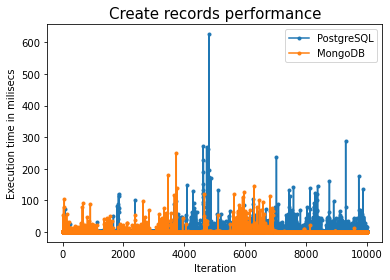

In [60]:
#Title
title="Create records performance"

#Number of iterations=10000
itrerations=10000

#MongoDB
doc_template={ "customer_id": "TCHWPBT-XXXXXXXX", "gender": "Male", "status_x": 1, "verified_x": 1, 
                    "created_at_x": "2018-02-07 19\:16\:23", "updated_at_x": "2018-02-07 19\:16\:23", 
                    "location_number": 0, "location_type": "Work", "latitude_x": -96.44, "longitude_x": -67.2, 
                    "id": 20, "authentication_id": 118616, "latitude_y": -0.4075, "longitude_y": 0.6436, 
                    "vendor_category_en": "Restaurants", "vendor_category_id": 2, "delivery_charge": 0, 
                    "serving_distance": 8, "is_open": 1, "OpeningTime": "08\:00AM-10\:45PM", "OpeningTime2": "-", 
                    "prepration_time": 19, "commission": 0, "is_akeed_delivering": "Yes", "discount_percentage": 0, 
                    "status_y": 1, "verified_y": 1, "rank": 1, "language": "EN", "vendor_rating": 4.5, 
                    "sunday_from_time1": "08\:00\:00", "sunday_to_time1": "22\:45\:00", "monday_from_time1": "08\:00\:00", 
                    "monday_to_time1": "22\:45\:00", "tuesday_from_time1": "08\:00\:00", "tuesday_to_time1": "22\:45\:00", 
                    "wednesday_from_time1": "08\:00\:00", "wednesday_to_time1": "22\:45\:00", 
                    "thursday_from_time1": "08\:00\:00", "thursday_to_time1": "22\:45\:00", 
                    "friday_from_time1": "08\:00\:00", "friday_to_time1": "22\:45\:00", 
                    "saturday_from_time1": "08\:00\:00", "saturday_to_time1": "22\:45\:00", 
                    "primary_tags": "{\"primary_tags\":\"71\"}", "open_close_flags": 1, 
                    "vendor_tag": "4,8,91,10", "vendor_tag_name": "Breakfast,Desserts,Free Delivery,Indian", 
                    "one_click_vendor": "Y", "country_id": 1, "city_id": 1, "created_at_y": "2018-05-04 22\:28\:22", 
                    "updated_at_y": "2020-04-07 16\:35\:55", "device_type": 3, "display_orders": 1, 
                    "location_number_obj": 0, "id_obj": 20, "CID X LOC_NUM X VENDOR": "TCHWPBT X 0 X 20", "target": 0 }

r1=[]
for i in range(itrerations):
    mongo_doc=copy.deepcopy(doc_template)
    mongo_doc["customer_id"]=mongo_doc["customer_id"].replace("XXXXXXXX",str(i))
    t1=mongodb_add_doc(mongo_conn, mongo_db, mongo_doc)
    r1.append([(i+1),t1[1]])

#PostgreSQL
pg_insert_query="INSERT INTO cust_order_info (customer_id,gender,status_x,verified_x,created_at_x,updated_at_x,location_number,location_type,latitude_x,longitude_x,id,authentication_id,latitude_y,longitude_y,vendor_category_en,vendor_category_id,delivery_charge,serving_distance,is_open,OpeningTime,OpeningTime2,prepration_time,commission,is_akeed_delivering,discount_percentage,status_y,verified_y,rank,language,vendor_rating,sunday_from_time1,sunday_to_time1,monday_from_time1,monday_to_time1,tuesday_from_time1,tuesday_to_time1,wednesday_from_time1,wednesday_to_time1,thursday_from_time1,thursday_to_time1,friday_from_time1,friday_to_time1,saturday_from_time1,saturday_to_time1,primary_tags,open_close_flags,vendor_tag,vendor_tag_name,one_click_vendor,country_id,city_id,created_at_y,updated_at_y,device_type,display_orders,location_number_obj,id_obj,CID_LOC_NUM_VENDOR,target) VALUES ('TCHWPBT-XXXXXXXX', 'Male', 1, 1, '2018-02-07 19:16:23', '2018-02-07 19:16:23', 0, 'Work',  -96.44,  -67.2, 20, 118616,  -0.4075, 0.6436, 'Restaurants', 2, 0, 8, 1, '08:00AM-10:45PM', '-', 19, 0, 'Yes', 0, 1, 1, 1, 'EN', 4.5, '08:00:00', '22:45:00', '08:00:00', '22:45:00', '08:00:00', '22:45:00', '08:00:00', '22:45:00', '08:00:00', '22:45:00', '08:00:00', '22:45:00', '08:00:00', '22:45:00', '{\"primary_tags\":\"71\"}', 1, '4,8,91,10', 'Breakfast,Desserts,Free Delivery,Indian', 'Y', 1, 1, '2018-05-04 22:28:22', '2020-04-07 16:35:55', 3, 1, 0, 20, 'TCHWPBT X 0 X 20', 0)"
r2=[]
for j in range(itrerations):
    pg_doc=copy.deepcopy(pg_insert_query)
    pg_doc=pg_doc.replace("XXXXXXXX",str(j))
    t2=postgresql_add_update_delete(pg_conn, pg_doc)
    r2.append([(j+1),t2[1]])
    
#Summarize Performance
summarizePerformance(r2,r1,title)

#Plot performance
plotPerformance(r2,r1,title)

### Read Operation

1. Read with filter condition. Output batch size is increase in increments of 100 and executed for 200 iterations


Summary for Read with filter condition performance:

MongoDB: Min=11.96194, max= 381.97184, 90th percentile=208.417132, 95th percentile=231.78023449999998, 99th percentile=258.5244335000006

PostgreSQL: Min=66.54501, max= 699.87774, 90th percentile=103.89711700000022, 95th percentile=328.01153899999946, 99th percentile=630.7836303000003


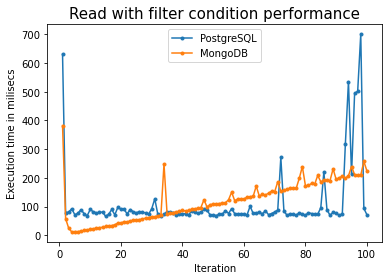

In [34]:
#Title
title="Read with filter condition performance"

#Number of iterations=100
itrerations=100

#MongoDB
r1=[]
for i in range(itrerations):
    t1=mongodb_select_filter(mongo_conn, mongo_db, {'language':'EN', 'city_id':1}, ((i+1)*100))
    r1.append([(i+1),t1[1]])

#PostgreSQL
r2=[]
for j in range(itrerations):
    t2=postgresql_select(pg_conn, "SELECT * FROM cust_order_info WHERE language=\'EN\' AND city_id=1 LIMIT " + str((i+1)*100))
    r2.append([(j+1),t2[1]])
    
#Summarize Performance
summarizePerformance(r2,r1,title)

#Plot performance
plotPerformance(r2,r1,title)

2. Read with filter condition & sort. Output batch size is increase in increments of 100 and executed for 200 iterations


Summary for Read with filter condition & sort performance:

MongoDB: Min=164184.41343, max= 246499.73893, 90th percentile=234692.060088, 95th percentile=240595.89950899998, 99th percentile=245318.9710458

PostgreSQL: Min=69406.98457, max= 75299.68047, 90th percentile=75010.05234600001, 95th percentile=75154.866408, 99th percentile=75270.7176576


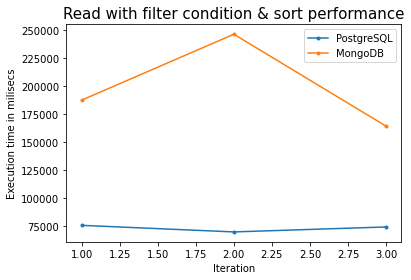

In [7]:
#Title
title="Read with filter condition & sort performance"

#Number of iterations=3
itrerations=3

#MongoDB
r1=[]
for i in range(itrerations):
    t1=mongodb_select_filter_sort(mongo_conn, mongo_db, {'language':'EN', 'city_id':1}, "customer_id", ((i+1)*100))
    r1.append([(i+1),t1[1]])

#PostgreSQL
r2=[]
for j in range(itrerations):
    t2=postgresql_add(conn, doc)(pg_conn, "SELECT * FROM cust_order_info WHERE language=\'EN\' AND city_id=1 
                         ORDER BY customer_id LIMIT " + str((i+1)*100))
    r2.append([(j+1),t2[1]])
    
#Summarize Performance
summarizePerformance(r2,r1,title)

#Plot performance
plotPerformance(r2,r1,title)

3. Read with aggregations.

MongoDB output:
{'_id': 'Sweets & Bakes', 'avgval': 0.2916666666666667}
{'_id': 'Restaurants', 'avgval': 0.4295454545454545}
MongoDB output:
{'_id': 'Sweets & Bakes', 'avgval': 0.2916666666666667}
{'_id': 'Restaurants', 'avgval': 0.4295454545454545}
MongoDB output:
{'_id': 'Restaurants', 'avgval': 0.4295454545454545}
{'_id': 'Sweets & Bakes', 'avgval': 0.2916666666666667}
MongoDB output:
{'_id': 'Restaurants', 'avgval': 0.4295454545454545}
{'_id': 'Sweets & Bakes', 'avgval': 0.2916666666666667}
MongoDB output:
{'_id': 'Restaurants', 'avgval': 0.4295454545454545}
{'_id': 'Sweets & Bakes', 'avgval': 0.2916666666666667}

Summary for Read with aggregation:

MongoDB: Min=86222.65482, max= 108940.29474, 90th percentile=102531.418988, 95th percentile=105735.856864, 99th percentile=108299.4071648

PostgreSQL: Min=63927.73199, max= 78187.63661, 90th percentile=75588.05031400001, 95th percentile=76887.843462, 99th percentile=77927.6779804


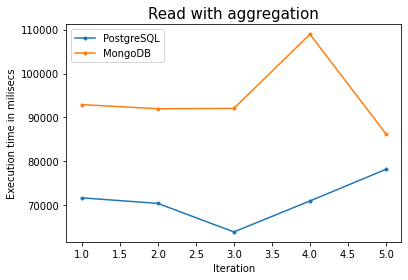

In [13]:
#Title
title="Read with aggregation"

#Number of iterations=5
itrerations=5

#MongoDB
r1=[]
pipeline=[{ "$group": { "_id": "$vendor_category_en", "avgval": { "$avg": "$delivery_charge" } }}]
for i in range(itrerations):
    t1=mongodb_select_aggregate(mongo_conn, mongo_db, pipeline)
    r1.append([(i+1),t1[1]])

#PostgreSQL
r2=[]
for j in range(itrerations):
    t2=postgresql_select(pg_conn, "SELECT vendor_category_en, avg(delivery_charge) FROM cust_order_info GROUP BY vendor_category_en")
    r2.append([(j+1),t2[1]])
    
#Summarize Performance
summarizePerformance(r2,r1,title)

#Plot performance
plotPerformance(r2,r1,title)

### Update Operation


Summary for Update records performance:

MongoDB: Min=47468.34922, max= 149331.03061, 90th percentile=131849.06623599998, 95th percentile=140590.04842299997, 99th percentile=147582.83417259998

PostgreSQL: Min=43184.45492, max= 86233.83021, 90th percentile=67555.564569, 95th percentile=76894.69738949998, 99th percentile=84366.0036459


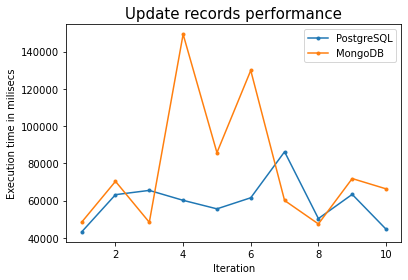

In [10]:
#Title
title="Update records performance"

#Number of iterations=10
itrerations=10

#MongoDB
r1=[]
for i in range(itrerations):
    criteria={'customer_id':'TCHWPBT-XXXXXXX'}
    criteria_copy=copy.deepcopy(criteria)
    criteria_copy['customer_id']=criteria_copy['customer_id'].replace("XXXXXXX",str(i+1))
    replace={'$set':{'gender':'Female'}}
    t1=mongodb_update_doc(mongo_conn, mongo_db, criteria_copy, replace)
    r1.append([(i+1),t1[1]])

#PostgreSQL
r2=[]
for j in range(itrerations):
    pg_update_query="UPDATE cust_order_info SET gender='FEMALE' WHERE customer_id='TCHWPBT-" + str(j+1) + "'"
    t2=postgresql_add_update_delete(pg_conn, pg_update_query)
    r2.append([(j+1),t2[1]])
    
#Summarize Performance
summarizePerformance(r2,r1,title)

#Plot performance
plotPerformance(r2,r1,title)

### Delete Operation


Summary for Delete records performance:

MongoDB: Min=47651.37887, max= 135129.70662, 90th percentile=118297.300533, 95th percentile=126713.50357649999, 99th percentile=133446.4660113

PostgreSQL: Min=38916.44835, max= 58876.61076, 90th percentile=48874.060250999995, 95th percentile=53875.33550549999, 99th percentile=57876.355709100004


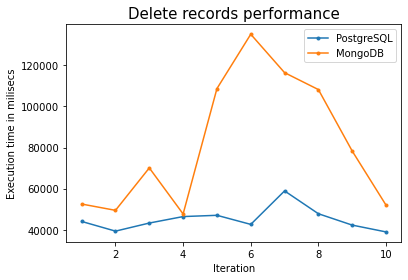

In [17]:
#Title
title="Delete records performance"

#Number of iterations=10
itrerations=10

#MongoDB
r1=[]
for i in range(itrerations):
    criteria={'customer_id':'TCHWPBT-XXXXXXX'}
    criteria_copy=copy.deepcopy(criteria)
    criteria_copy['customer_id']=criteria_copy['customer_id'].replace("XXXXXXX",str(i+1))
    t1=mongodb_delete_doc(mongo_conn, mongo_db, criteria_copy)
    r1.append([(i+1),t1[1]])

#PostgreSQL
r2=[]
for j in range(itrerations):
    pg_update_query="DELETE FROM cust_order_info WHERE customer_id='TCHWPBT-" + str(j+1) + "'"
    t2=postgresql_add_update_delete(pg_conn, pg_update_query)
    r2.append([(j+1),t2[1]])
    
#Summarize Performance
summarizePerformance(r2,r1,title)

#Plot performance
plotPerformance(r2,r1,title)

### Close the connections to MongoDB & PostgreSQL

In [34]:
#Close MongoDB & PostgreSQL connections
mongodb_disconnect(mongo_conn[0])
postgresql_disconnect(pg_conn)

MongoDB connection closed.
PostgreSQL connection closed.


(<connection object at 0x000001B58BA8D278; dsn: 'user=postgres password=xxx dbname=perf_benchmark host=127.0.0.1 port=5432', closed: 1>,
 0.0)